# ORIENTAÇÕES PARA O IMPORTAÇÃO DOS DADOS
Para importar corretamente a base de dados dos Microdados do Enade é necessário considerar os seguintes requisitos:

• a importação deve considerar o separador ponto e vírgula (;);

• a primeira linha sendo considerada o cabeçalho;

• os decimais devem ser importados em formato de ponto (.);

• considerar os valores faltantes como aspas duplas (“);

• é necessário importar as colunas “DS_VT_ACE_OFG” e “DS_VT_ACE_OCE” como caractere (string).

## Criacao de uma pasta para as tabelas

Sera criado uma pasta para armazenar as imagens

In [3]:
import os

#pasta tabelas
diretorio = "tabelas"
try:
    os.makedirs(diretorio)
    print(f"Pasta '{diretorio}' criada com sucesso.")
except FileExistsError:
    print(f"A pasta '{diretorio}' já existe.")

#pasta tabelas/vetores
vetores = f"{diretorio}/vetores"
try:
    os.makedirs(vetores)
    print(f"Pasta '{vetores}' criada com sucesso.")
except FileExistsError:
    print(f"A pasta '{vetores}' já existe.")

#pasta tabelas/questionario
questionario = f"{diretorio}/questionario"
try:
    os.makedirs(questionario)
    print(f"Pasta '{questionario}' criada com sucesso.")
except FileExistsError:
    print(f"A pasta '{questionario}' já existe.")    

#pasta tabelas/enade
enade = f"{diretorio}/enade"
try:
    os.makedirs(enade)
    print(f"Pasta '{enade}' criada com sucesso.")
except FileExistsError:
    print(f"A pasta '{enade}' já existe.")   

#pasta tabelas/percepcao_prova
percepcao_prova = f"{diretorio}/percepcao_prova"
try:
    os.makedirs(percepcao_prova)
    print(f"Pasta '{percepcao_prova}' criada com sucesso.")
except FileExistsError:
    print(f"A pasta '{percepcao_prova}' já existe.")   



A pasta 'tabelas' já existe.
A pasta 'tabelas/vetores' já existe.
A pasta 'tabelas/questionario' já existe.
A pasta 'tabelas/enade' já existe.
A pasta 'tabelas/percepcao_prova' já existe.


### Instalaçao das bibliotecas


In [161]:
# bibliotecas necessárias
!pip install pandas matplotlib seaborn unidecode numpy



[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## Analise dados ENADE

### Analise de alunos


#### Total de alunos por curso

In [162]:
import pandas as pd
def total_alunos_por_curso(dir_entrada):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['NOME_CURSO', 'NT_GER'])
    
    df['CURSO_ORIGINAL'] = df['NOME_CURSO']
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()

    contagem_total = df.groupby('NOME_CURSO').size()
    contagem_validos = df[df['NT_GER'].notna() & (df['NT_GER'] != '')].groupby('NOME_CURSO').size()
    percentual_realizacao = (contagem_validos / contagem_total * 100).round(2).astype(str) + '%'

    result = pd.DataFrame({
        'Número total de alunos\ninscritos': contagem_total, 
        'Número de alunos\nque realizaram a prova': contagem_validos,
        'Percentual que realizou\na prova': percentual_realizacao
    }).reset_index()

    result = result.join(df[['NOME_CURSO', 'CURSO_ORIGINAL']].drop_duplicates().set_index('NOME_CURSO'), on='NOME_CURSO')
    result.rename(columns={'CURSO_ORIGINAL': 'Cursos participantes do ENADE'}, inplace=True)

    #soma total das colunas
    soma_total = result[['Número total de alunos\ninscritos', 'Número de alunos\nque realizaram a prova']].sum()
    soma_total['Cursos participantes do ENADE'] = 'Total alunos ENADE'

    #percentual para a soma total
    percentual_soma_total = (soma_total['Número de alunos\nque realizaram a prova'] / soma_total['Número total de alunos\ninscritos'] * 100)
    soma_total['Percentual que realizou\na prova'] = f"{round(percentual_soma_total, 2)}%"
    
    result = result.append(soma_total, ignore_index=True)

    return result[['Cursos participantes do ENADE', 'Número total de alunos\ninscritos', 'Número de alunos\nque realizaram a prova', 'Percentual que realizou\na prova']]

# criaçao da tabela
def tabela_total_alunos_enade(contagem, dir_destino):
    fig, ax = plt.subplots(figsize=(8, 0.3 * len(contagem) + 0.5))
    ax.axis('off')

    tabela = ax.table(
        cellText=contagem.values,
        colLabels=contagem.columns,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    for (i, col_label) in enumerate(tabela.get_celld()[(0, j)] for j in range(len(contagem.columns))):
        col_label.set_text_props(fontproperties=FontProperties(weight='bold'))
        col_label.set_text_props(ha='center')

    for key, cell in tabela.get_celld().items():
        if key[1] == 0:
            cell.set_text_props(ha='left')
        elif key[1] in [1, 2, 3]:
            cell.set_text_props(ha='center')
        if contagem.iloc[key[0]-1, 0] == 'Total alunos ENADE':
            cell.set_facecolor('#ffffcc')  

    tabela.auto_set_column_width(col=list(range(len(contagem.columns))))
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)

    plt.savefig(dir_destino, bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()


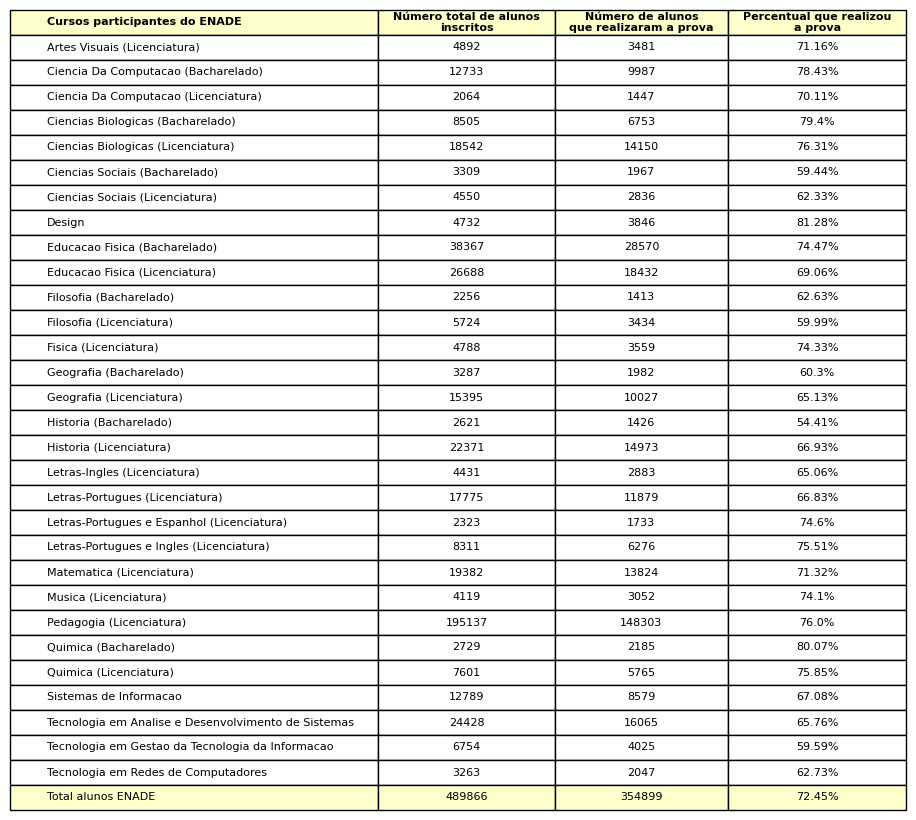

In [163]:
dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'
dir_destino = f"{enade}/tabela_total_alunos_ENADE"

contagem_por_curso = total_alunos_por_curso(dir_entrada)
tabela_total_alunos_enade(contagem_por_curso, dir_destino)

###  Analise da nota das provas - Tabelas 'NT_CE', 'NT_FG', 'NT_GER' 

'NT_CE', 'NT_FG', 'NT_GER'


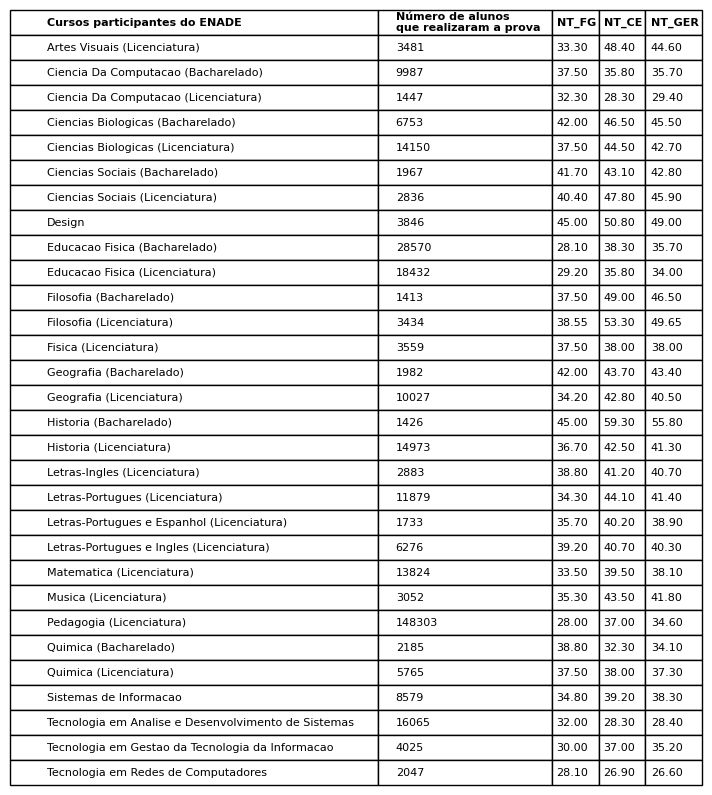

In [164]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

def total_alunos_por_curso(dir_entrada):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['NOME_CURSO', 'NT_FG', 'NT_CE', 'NT_GER'])

    df['CURSO_ORIGINAL'] = df['NOME_CURSO']
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()

    contagem_validos = df[df['NT_GER'].notnull()].groupby('NOME_CURSO').size()

    medianas = df.groupby('NOME_CURSO')[['NT_FG', 'NT_CE', 'NT_GER']].median().applymap("{:.2f}".format)

    result = contagem_validos.to_frame(name='Número de alunos\nque realizaram a prova').join(medianas).reset_index()
    result = result.join(df[['NOME_CURSO', 'CURSO_ORIGINAL']].drop_duplicates().set_index('NOME_CURSO'), on='NOME_CURSO')

    result = result[['CURSO_ORIGINAL', 'Número de alunos\nque realizaram a prova', 'NT_FG', 'NT_CE', 'NT_GER']]
    result.rename(columns={'CURSO_ORIGINAL': 'Cursos participantes do ENADE'}, inplace=True)
    return result


def tabela_analise_notas(contagem, dir_destino):
    fig, ax = plt.subplots(figsize=(8, 0.3 * len(contagem) + 0.5))
    ax.axis('off')

    tabela = ax.table(
        cellText=contagem.values,
        colLabels=contagem.columns,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    for (i, col_label) in enumerate(tabela.get_celld()[(0, j)] for j in range(len(contagem.columns))):
        col_label.set_text_props(fontproperties=FontProperties(weight='bold'))
        col_label.set_text_props(ha='center')

    for key, cell in tabela.get_celld().items():
        cell.set_text_props(ha='left')

    for key, cell in tabela.get_celld().items():
        if key[0] == len(contagem) + 1:
            cell.set_facecolor('#ffffcc')

    tabela.auto_set_column_width(col=list(range(len(contagem.columns))))
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)

    # Salvando a figura
    plt.savefig(dir_destino, bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()

dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'
dir_destino = f"{enade}/tabela_total_notas_alunos_ENADE"
contagem = total_alunos_por_curso(dir_entrada)
tabela_analise_notas(contagem, dir_destino)


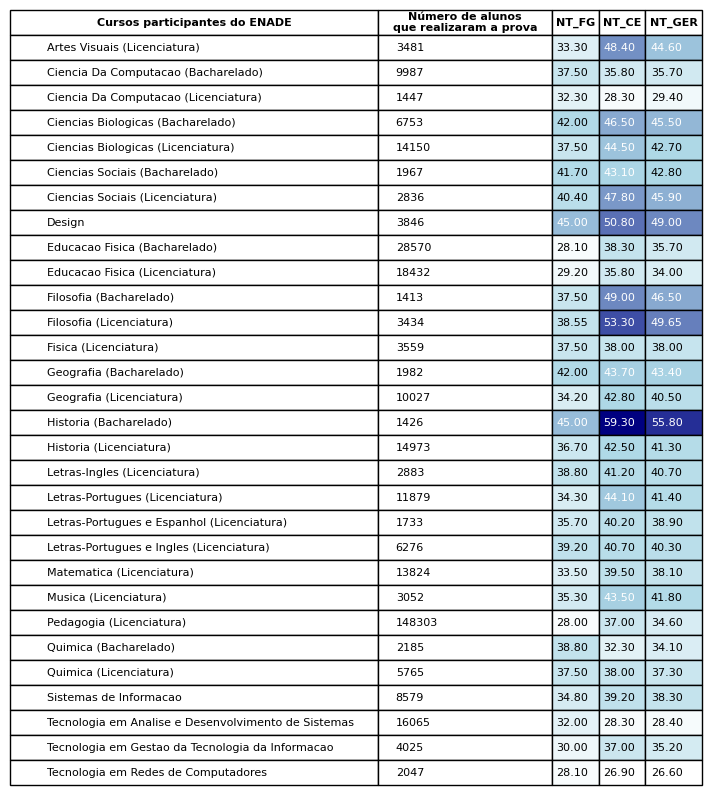

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.font_manager import FontProperties


def total_alunos_por_curso(dir_entrada):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['NOME_CURSO', 'NT_FG', 'NT_CE', 'NT_GER'])
    
    df['CURSO_ORIGINAL'] = df['NOME_CURSO']
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()

    contagem_validos = df[df['NT_GER'].notnull()].groupby('NOME_CURSO').size()
    medianas = df.groupby('NOME_CURSO')[['NT_FG', 'NT_CE', 'NT_GER']].median().applymap("{:.2f}".format)

    result = contagem_validos.to_frame(name='Número de alunos\nque realizaram a prova').join(medianas).reset_index()
    result = result.join(df[['NOME_CURSO', 'CURSO_ORIGINAL']].drop_duplicates().set_index('NOME_CURSO'), on='NOME_CURSO')
    result = result[['CURSO_ORIGINAL', 'Número de alunos\nque realizaram a prova', 'NT_FG', 'NT_CE', 'NT_GER']]
    result.rename(columns={'CURSO_ORIGINAL': 'Cursos participantes do ENADE'}, inplace=True)

    return result

cmap = LinearSegmentedColormap.from_list('meu_colormap', ['white', 'lightblue', 'navy'])
def tabela_analise_notas(contagem, dir_destino, cmap=cmap):
    fig, ax = plt.subplots(figsize=(8, 0.3 * len(contagem) + 0.5))
    ax.axis('off')

    min_val = contagem[['NT_FG', 'NT_CE', 'NT_GER']].astype(float).min().min()
    max_val = contagem[['NT_FG', 'NT_CE', 'NT_GER']].astype(float).max().max()

    tabela = ax.table(
        cellText=contagem.values,
        colLabels=contagem.columns,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    cells = tabela.get_celld()
    for i in range(1, len(contagem) + 1):
        for j, column in enumerate(['NT_FG', 'NT_CE', 'NT_GER'], start=2):
            val = float(contagem.iloc[i - 1][column])
            color = cmap((val - min_val) / (max_val - min_val))
            cells[(i, j)].set_facecolor(color)
            cells[(i, j)].set_text_props(color='white' if val > (min_val + max_val) / 2 else 'black')

    for (i, col_label) in enumerate(cells[(0, j)] for j in range(len(contagem.columns))):
        col_label.set_text_props(fontproperties=FontProperties(weight='bold'))
        col_label.set_text_props(ha='center')

    tabela.auto_set_column_width(col=list(range(len(contagem.columns))))
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)

    plt.savefig(dir_destino, bbox_inches='tight', dpi=300)
    plt.show()
    plt.close(fig)


dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'
dir_destino = f"{enade}/tabela_total_notas_alunos_ENADE_heatmap"  

contagem = total_alunos_por_curso(dir_entrada)
tabela_analise_notas(contagem, dir_destino, cmap)


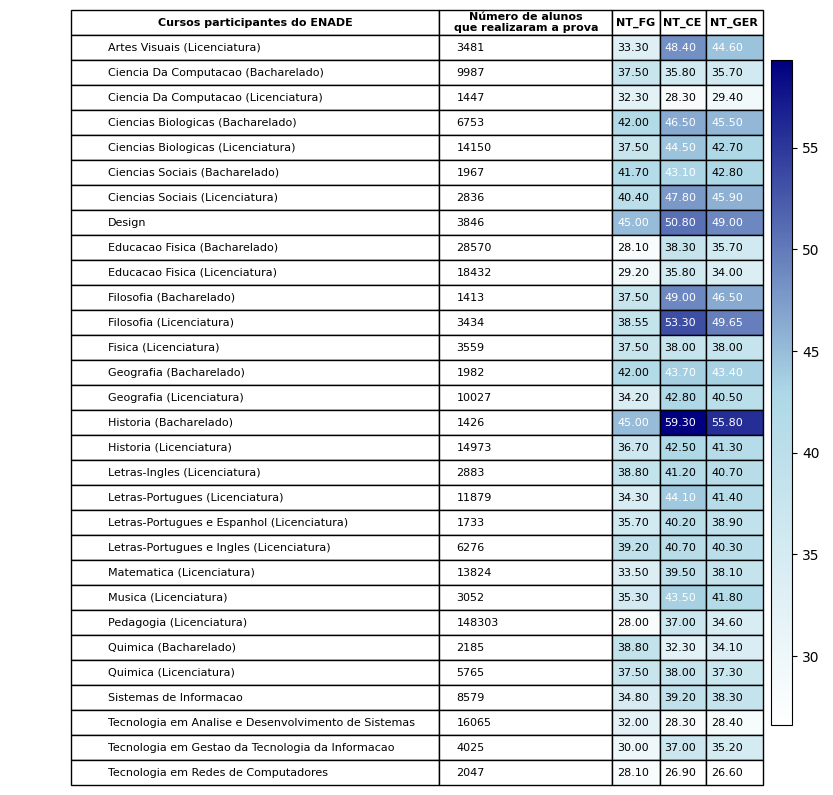

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.font_manager import FontProperties


def total_alunos_por_curso(dir_entrada):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['NOME_CURSO', 'NT_FG', 'NT_CE', 'NT_GER'])
    
    df['CURSO_ORIGINAL'] = df['NOME_CURSO']
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()

    contagem_validos = df[df['NT_GER'].notnull()].groupby('NOME_CURSO').size()
    medianas = df.groupby('NOME_CURSO')[['NT_FG', 'NT_CE', 'NT_GER']].median().applymap("{:.2f}".format)

    result = contagem_validos.to_frame(name='Número de alunos\nque realizaram a prova').join(medianas).reset_index()
    result = result.join(df[['NOME_CURSO', 'CURSO_ORIGINAL']].drop_duplicates().set_index('NOME_CURSO'), on='NOME_CURSO')
    result = result[['CURSO_ORIGINAL', 'Número de alunos\nque realizaram a prova', 'NT_FG', 'NT_CE', 'NT_GER']]
    result.rename(columns={'CURSO_ORIGINAL': 'Cursos participantes do ENADE'}, inplace=True)

    return result

cmap = LinearSegmentedColormap.from_list('meu_colormap', ['white', 'lightblue', 'navy'])
def tabela_analise_notas(contagem, dir_destino, cmap=cmap):
    fig, ax = plt.subplots(figsize=(10.5, 0.3 * len(contagem) + 0.5))
    ax.axis('off')

    min_val = contagem[['NT_FG', 'NT_CE', 'NT_GER']].astype(float).min().min()
    max_val = contagem[['NT_FG', 'NT_CE', 'NT_GER']].astype(float).max().max()

    tabela = ax.table(
        cellText=contagem.values,
        colLabels=contagem.columns,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    cells = tabela.get_celld()
    for i in range(1, len(contagem) + 1):
        for j, column in enumerate(['NT_FG', 'NT_CE', 'NT_GER'], start=2):
            val = float(contagem.iloc[i - 1][column])
            color = cmap((val - min_val) / (max_val - min_val))
            cells[(i, j)].set_facecolor(color)
            cells[(i, j)].set_text_props(color='white' if val > (min_val + max_val) / 2 else 'black')

    for (i, col_label) in enumerate(cells[(0, j)] for j in range(len(contagem.columns))):
        col_label.set_text_props(fontproperties=FontProperties(weight='bold'))
        col_label.set_text_props(ha='center')

    tabela.auto_set_column_width(col=list(range(len(contagem.columns))))
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)

    # Adicionar a barra de cores à direita da tabela
    cax = fig.add_axes([0.85, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    norm = plt.Normalize(min_val, max_val)
    cb = plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), cax=cax)
    

    plt.savefig(dir_destino, bbox_inches='tight', dpi=300)
    plt.show()
    plt.close(fig)


dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'
dir_destino = f"{enade}/tabela_total_notas_alunos_ENADE_heatmap"  

contagem = total_alunos_por_curso(dir_entrada)
tabela_analise_notas(contagem, dir_destino, cmap)


###  Analise da nota das provas - Ciencia da computacao

'NT_CE', 'NT_FG', 'NT_GER'


In [166]:
dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'
cursos_analisados = ["Ciência Da Computação (Bacharelado)", "ciencia da computacao (licenciatura)"]
colunas_nota = ['NT_CE', 'NT_FG', 'NT_GER']

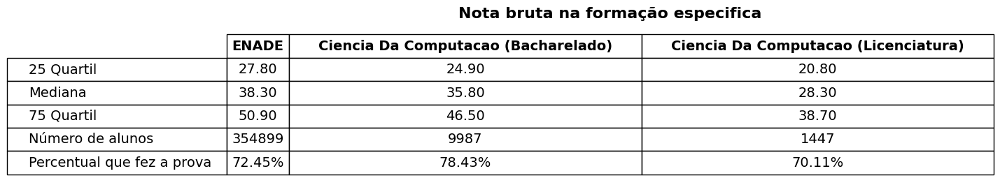

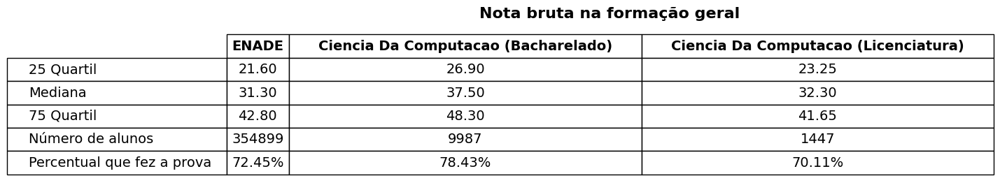

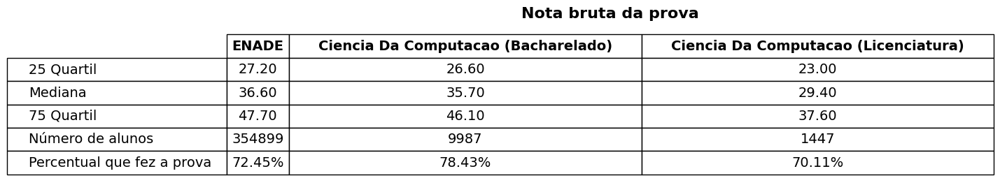

In [167]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import table
import unidecode

def formatar_curso(texto):
    return unidecode.unidecode(texto).lower()

titulos_colunas = {
    'NT_CE': 'Nota bruta na formação especifica',
    'NT_FG': 'Nota bruta na formação geral',
    'NT_GER': 'Nota bruta da prova'
}

df = pd.read_csv(dir_entrada, sep=';', usecols=colunas_nota + ['NOME_CURSO'])

df['NOME_CURSO_NORMALIZADO'] = df['NOME_CURSO'].apply(formatar_curso)


mapa_nomes_originais = df.set_index('NOME_CURSO_NORMALIZADO')['NOME_CURSO'].to_dict()

for coluna in colunas_nota:
    df[coluna] = pd.to_numeric(df[coluna], errors='coerce')
    enade_stats = df[coluna].describe(percentiles=[0.25, 0.5, 0.75]).to_dict()

    stats_data = {'ENADE': [enade_stats['25%'], enade_stats['50%'], enade_stats['75%'], enade_stats['count'], enade_stats['count']/df.shape[0] * 100 if df.shape[0] > 0 else 0]}

    for curso in cursos_analisados:
        curso_normalizado = formatar_curso(curso)
        curso_df = df[df['NOME_CURSO_NORMALIZADO'] == curso_normalizado]
        curso_stats = curso_df[coluna].describe(percentiles=[0.25, 0.5, 0.75]).to_dict()
        total_instancias = curso_df.shape[0]
        percentual = curso_stats['count']/total_instancias * 100 if total_instancias > 0 else 0
        stats_data[mapa_nomes_originais[curso_normalizado]] = [curso_stats['25%'], curso_stats['50%'], curso_stats['75%'], curso_stats['count'], percentual]

    row_names = ['25 Quartil', 'Mediana', '75 Quartil', 'Número de alunos', 'Percentual que fez a prova']
    final_stats_df = pd.DataFrame(stats_data, index=row_names)


    final_stats_df.loc['25 Quartil'] = final_stats_df.loc['25 Quartil'].astype(float).map("{:.2f}".format)
    final_stats_df.loc['Mediana'] = final_stats_df.loc['Mediana'].astype(float).map("{:.2f}".format)
    final_stats_df.loc['75 Quartil'] = final_stats_df.loc['75 Quartil'].astype(float).map("{:.2f}".format)
    final_stats_df.loc['Número de alunos'] = final_stats_df.loc['Número de alunos'].astype(int).map("{:d}".format)
    final_stats_df.loc['Percentual que fez a prova'] = final_stats_df.loc['Percentual que fez a prova'].apply(lambda x: f"{x:.2f}%" if isinstance(x, float) else x)


    fig, ax = plt.subplots(figsize=(10, 3))  
    ax.axis('off')
    #-------------titulo da figura-------------------------------------------------------------------
    ax.set_title(titulos_colunas[coluna], fontsize=16, weight='bold', loc='center') 

    tbl = table(ax, final_stats_df, loc='center', cellLoc='center', colWidths=[0.2]*len(final_stats_df.columns))
    tbl.auto_set_column_width(col=list(range(len(final_stats_df.columns)))) 

    for cell in tbl._cells:
        if cell[0] == 0:  
            tbl._cells[cell].get_text().set_weight('bold')
    tbl.auto_set_font_size(True)
    tbl.set_fontsize(14)
    tbl.scale(2, 2)  

    plt.savefig(f'{enade}/tabela_{coluna}', bbox_inches='tight', pad_inches=0.05, dpi=300)
    plt.show()
    plt.close()


###  Analise da nota das provas - Boxplot

'NT_CE', 'NT_FG', 'NT_GER'


In [168]:
dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'
cursos_analisados = ["Ciência Da Computação (Bacharelado)", "ciencia da computacao (licenciatura)"]
colunas_nota = ['NT_CE', 'NT_FG', 'NT_GER']

<Figure size 1800x800 with 0 Axes>

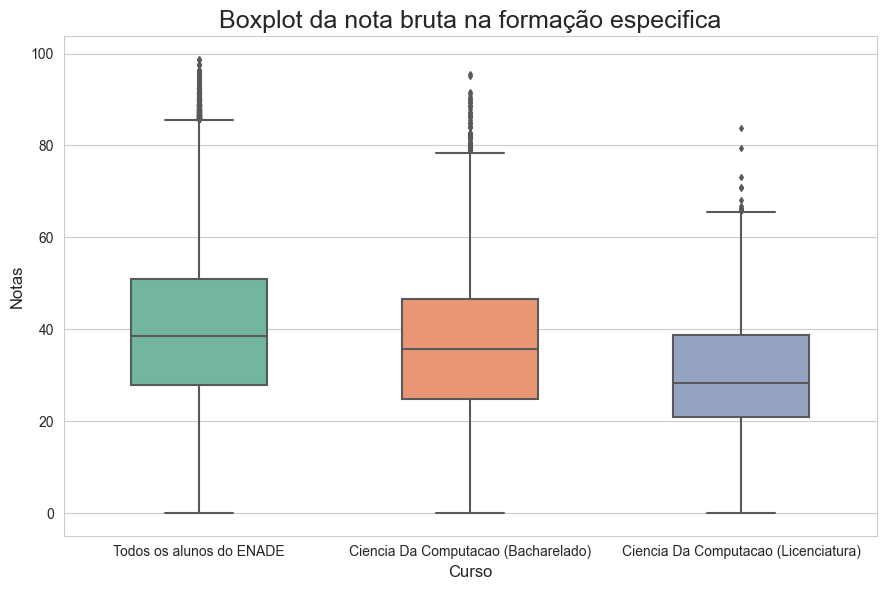

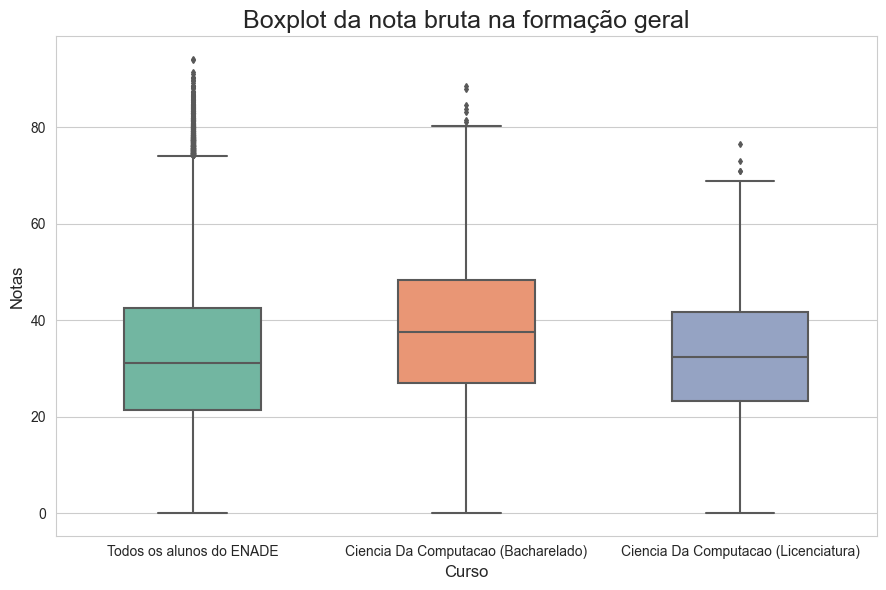

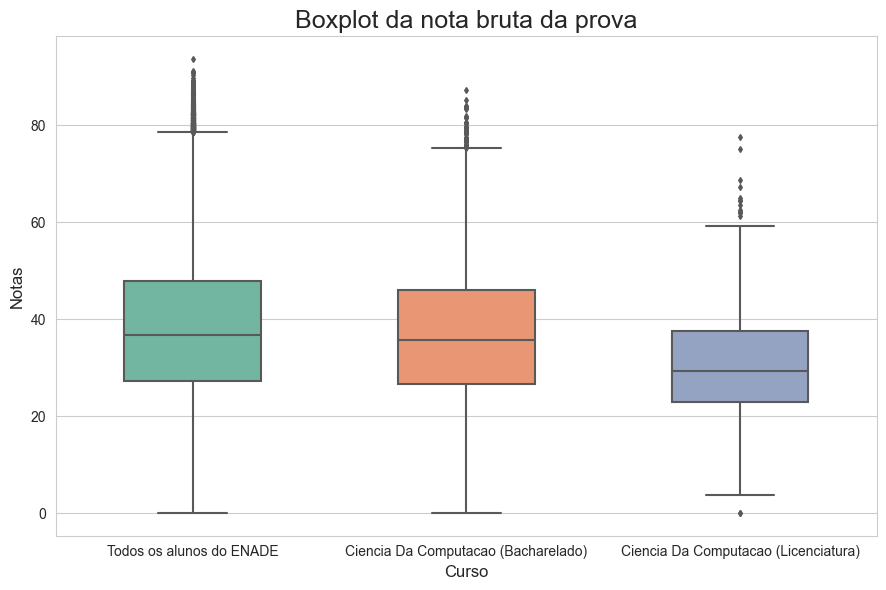

In [169]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import unidecode

titulos_colunas = {
    'NT_CE': 'nota bruta na formação especifica',
    'NT_FG': 'nota bruta na formação geral',
    'NT_GER': 'nota bruta da prova'
}

largura_padrao = len(cursos_analisados)*4.5
altura_padrao = 6

def formatar_curso(texto):
    return unidecode.unidecode(texto).lower()


df = pd.read_csv(dir_entrada, sep=';', usecols=colunas_nota + ['NOME_CURSO'])
nome_curso_map = {formatar_curso(curso): curso for curso in df['NOME_CURSO'].unique()}

df['NOME_CURSO_NORMALIZADO'] = df['NOME_CURSO'].apply(formatar_curso)

for coluna in colunas_nota:
    df[coluna] = pd.to_numeric(df[coluna], errors='coerce')

df['GRUPO_CURSO'] = df['NOME_CURSO_NORMALIZADO'].apply(lambda x: nome_curso_map[x] if x in [formatar_curso(curso) for curso in cursos_analisados] else 'Todos os alunos do ENADE')

sns.set_style("whitegrid")
plt.figure(figsize=(18, 8))

for coluna in colunas_nota:
    plt.figure(figsize=(largura_padrao, altura_padrao))
    sns.boxplot(x='GRUPO_CURSO', y=coluna, data=df, width=0.5, palette='Set2', fliersize=3, linewidth=1.5)
    #-------------titulo da figura-------------------------------------------------------------------
    plt.title(f'Boxplot da {titulos_colunas[coluna]}', fontsize=18)
    plt.xlabel('Curso', fontsize=12, fontweight='light')
    plt.ylabel('Notas', fontsize=12, fontweight='light')
    plt.xticks(rotation=0, fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()  
    plt.savefig(f'{enade}/boxplot_{coluna}_{cursos_analisados}_t', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


## Analise Microdados

### Funcao Grafico Barras Eixo X

In [170]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from unidecode import unidecode

def criar_mapeamento_co_ies_para_nome_ies(dir_entrada):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_IES'])
    mapeamento = df.drop_duplicates().set_index('CO_IES')['NOME_IES'].to_dict()
    return mapeamento

def formatar_curso(course_name):
    return unidecode(course_name).lower()

def grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_CURSO', qe_column])
    mapeamento_ies = criar_mapeamento_co_ies_para_nome_ies(dir_entrada)
    
    if faculdades_filtradas_CO_IES:
        df = df[df['CO_IES'].isin(faculdades_filtradas_CO_IES)]

    curso_map = df['NOME_CURSO'].dropna().unique()
    curso_map = {formatar_curso(curso): curso for curso in curso_map}
    df['NOME_CURSO_FORMATADO'] = df['NOME_CURSO'].apply(formatar_curso)
    cursos_analisados_formatados = [formatar_curso(curso) for curso in cursos_analisados]
    df_filtrado = df[df['NOME_CURSO_FORMATADO'].isin(cursos_analisados_formatados)]

    total_counts_per_course = df_filtrado[df_filtrado[qe_column].notna()].groupby('NOME_CURSO_FORMATADO')[qe_column].count()  
    

    plt.figure(figsize=(len(cursos_analisados)*10, 8))
    ax = sns.countplot(x='NOME_CURSO_FORMATADO', hue=qe_column, data=df_filtrado, palette='Set2', edgecolor='black', linewidth=1.2,
                       order=total_counts_per_course.index, width=0.9)
    

    max_count = df_filtrado.groupby('NOME_CURSO_FORMATADO')[qe_column].value_counts().max()

    ax.set_ylim(0, max_count*1.1)

    ax.set_xticklabels([curso_map[curso] for curso in total_counts_per_course.index], rotation=0, fontsize=14)
    nomes_ies = ', '.join([mapeamento_ies.get(co_ies, 'Desconhecida') for co_ies in faculdades_filtradas_CO_IES])
    plt.title(f"{titulo}\n{nomes_ies}", fontsize=16)
    plt.legend(title=qe_column, title_fontsize='13', fontsize='12')
    plt.xlabel('Curso',fontsize=15)
    plt.ylabel('Alunos',fontsize=15)

    handles, labels = ax.get_legend_handles_labels()
    legend_labels = []
    for handle, label in zip(handles, labels):
        count = df_filtrado[df_filtrado[qe_column] == label]['NOME_CURSO_FORMATADO'].value_counts()
        for course, course_count in count.iteritems():
            total = total_counts_per_course.get(course, 0)
            percentage = course_count / total * 100 if total > 0 else 0
            legend_labels.append(f"{label} ({percentage:.2f}%) - {course_count}")
    plt.legend(handles, legend_labels, title=qe_column, title_fontsize='13', fontsize='12')

    primeiro_curso, primeiro_total = next(iter(total_counts_per_course.items()))
    segundo_curso, segundo_total = None, None
    cursos_lista = list(total_counts_per_course.items())

    if len(cursos_lista) > 1:
        segundo_curso, segundo_total = cursos_lista[1]

    contador = 0

    for p in ax.patches:
        curso_label = ax.get_xticklabels()[int(p.get_x() + p.get_width() / 2.0)].get_text()
        curso_label_formatado = formatar_curso(curso_label)

        total_usado = primeiro_total if contador % 2 == 0 else segundo_total
        contador += 1

        if total_usado > 0:
            percentage = 100 * p.get_height() / total_usado
            annotation = f'{int(p.get_height())}\n({percentage:.2f}%)'
        else:
            annotation = f'{int(p.get_height())}\n(N/A)'

        ax.annotate(f"{annotation}", (p.get_x() + p.get_width() / 2.0, p.get_height()),
                    ha='center', va='center', fontsize=12, color='black', xytext=(0, 18),
                    textcoords='offset points')
        
    plt.legend(title=qe_column, title_fontsize='13', fontsize='12')                    
    plt.savefig(dir_destino, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

### Funcao Grafico Barras Eixo Y

In [171]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from unidecode import unidecode

def grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada, qe_column, titulo):
    df = pd.read_csv(dir_entrada, sep=';', encoding='utf-8', low_memory=False)    
    mapeamento_ies = {co_ies: nome for co_ies, nome in zip(df['CO_IES'].unique(), df['NOME_IES'].unique())}

    
    if faculdades_filtradas_CO_IES:
        df_filtrado = df[df['CO_IES'].isin(faculdades_filtradas_CO_IES)].copy()
        nomes_ies = ', '.join(mapeamento_ies[co_ies] for co_ies in faculdades_filtradas_CO_IES if co_ies in mapeamento_ies)
    else:
        df_filtrado = df.copy()
        nomes_ies = ''

    cursos_analisados_formatados = [unidecode(curso).lower() for curso in cursos_analisados]

    df_filtrado['NOME_CURSO_FORMATADO'] = df_filtrado['NOME_CURSO'].apply(lambda x: unidecode(x).lower() if isinstance(x, str) else x)
    
    df_filtrado = df_filtrado[df_filtrado['NOME_CURSO_FORMATADO'].isin(cursos_analisados_formatados)]

    plt.figure(figsize=(6.5*len(cursos_analisados), 8))
    ax = sns.countplot(data=df_filtrado, y=qe_column, hue='NOME_CURSO', palette='Set2', edgecolor='black', linewidth=1.2)

    plt.xlabel('Alunos', fontsize=15)
    plt.ylabel('Respostas', fontsize=15)
    plt.legend(title='Curso', title_fontsize='13', fontsize='12')

    titulo = f"{titulo}\n{nomes_ies}" if nomes_ies else titulo
    plt.title(titulo, loc='center')

    for p in ax.patches:
        width = p.get_width()
        ax.annotate(f'{int(width)}', (p.get_x() + width, p.get_y() + p.get_height() / 2),
                    ha='left', va='center', fontsize=12, color='black', xytext=(5, 0),
                    textcoords='offset points')

    plt.tight_layout()
    plt.savefig(f'{questionario}/grafico_{qe_column}_h', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

### Funcao Grafico Circular

In [172]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from unidecode import unidecode
import numpy as np

def criar_mapeamento_co_ies_para_nome_ies(dir_entrada):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_IES'])
    mapeamento = df.drop_duplicates().set_index('CO_IES')['NOME_IES'].to_dict()
    return mapeamento

def formatar_curso(course_name):
    return unidecode(course_name).lower()

def autopct_format(values):
    return lambda pct: ''

def grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo):
    mapeamento_ies = criar_mapeamento_co_ies_para_nome_ies(dir_entrada)
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_CURSO', qe_column])
    mapeamento_ies = criar_mapeamento_co_ies_para_nome_ies(dir_entrada)
    if faculdades_filtradas_CO_IES:
        df = df[df['CO_IES'].isin(faculdades_filtradas_CO_IES)]

    curso_map = df['NOME_CURSO'].dropna().unique()
    curso_map = {formatar_curso(curso): curso for curso in curso_map}

    df['NOME_CURSO_FORMATADO'] = df['NOME_CURSO'].apply(formatar_curso)

    cursos_analisados_formatados = [formatar_curso(curso) for curso in cursos_analisados]
    df_filtrado = df[df['NOME_CURSO_FORMATADO'].isin(cursos_analisados_formatados)]

    df_grouped = df_filtrado.groupby('NOME_CURSO_FORMATADO')[qe_column].value_counts().unstack(fill_value=0)
    df_grouped = df_grouped.reindex(cursos_analisados_formatados)

    colors = cm.Set3.colors

    for curso in cursos_analisados_formatados:
        counts = df_grouped.loc[curso]
        total = counts.sum()
        sorted_counts = counts.sort_values(ascending=False)

        legend_labels = [f"{label} ({count / total * 100:.2f}%) - {count}" for label, count in sorted_counts.items()]

        fig, ax = plt.subplots(figsize=(12, 8))
        wedges, texts, autotexts = ax.pie(sorted_counts, autopct=autopct_format(sorted_counts),
                                          startangle=90, colors=colors,
                                          shadow=True, wedgeprops=dict(width=0.3, edgecolor='gray'))

        ax.legend(wedges, legend_labels, title=f"Porcentagem e Número de alunos {qe_column}", loc="upper right", bbox_to_anchor=(1, 0, 0.5, 1))

        nomes_ies = ', '.join([mapeamento_ies.get(co_ies, 'Desconhecida') for co_ies in faculdades_filtradas_CO_IES])
        plt.title(f"{titulo}\n{nomes_ies}\n{curso_map[curso]}", fontsize=16)
        plt.savefig(f"{dir_destino}_{curso}.png", dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()

### Funcao Heatmap de todos os cursos


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

def heatmap_todos_cursos(dir_entrada, qe_column, titulo):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['NOME_CURSO', qe_column])

    tabela_contagem = df.groupby(['NOME_CURSO', qe_column]).size().unstack(fill_value=0)
    tabela_porcentagem = tabela_contagem.div(tabela_contagem.sum(axis=1), axis=0) * 100

    cmap = LinearSegmentedColormap.from_list('meu_colormap', ['white', 'lightblue', 'navy'])
    
    #tamanho do gráfico
    #plt.figure(figsize=(15, 8))
    plt.figure(figsize=(45, 8))
    
    annot_values = tabela_contagem.astype(str) + " - (" + tabela_porcentagem.round(1).astype(str) + "%)"
    sns.heatmap(tabela_porcentagem, annot=annot_values, fmt="", cmap=cmap)
    
    plt.ylabel('Curso')
    plt.xlabel('Resposta')
    plt.title(titulo)
    
    nome_arquivo_saida = f'{enade}/heatmap_{qe_column}'
    plt.savefig(nome_arquivo_saida, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Heatmap salvo no diretório '{nome_arquivo_saida}'")


### Entrada de dados analisados(Microdados)

In [174]:
#lista de cursos para a analise
cursos_analisados = ['ciencia Da Computacao (bacharelado)','ciencia da computacao (licenciatura)' ]
#codigo ies para a faculdade analisada
faculdades_filtradas_CO_IES=[2]
print(faculdades_filtradas_CO_IES)


[2]


In [175]:
# Tipos de graficos

# grafico_microdados_barras()
# grafico_microdados_circular()
# grafico_microdados_barras_horizontal()

#### microdados2021_arq6 
Idade do participante com valores entre 7 e 89 (Dado procedente da base da Receita Federal)

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

def agrupar_por_idade(idade):
    
    if idade <= 25:
        return '18-25 anos'
    elif idade <= 30:
        return '25-30 anos'
    elif idade <= 40:
        return '31-40 anos'
    elif idade <= 50:
        return '41-50 anos'
    elif idade <= 60:
        return '51-60 anos'
    elif idade <= 80:
        return '61-80 anos'   
    else:
        return '> 80 anos'

# Define a ordem desejada para os grupos de idade
ordem_idade = [ '18-25 anos','25-30 anos', '31-40 anos', '41-50 anos', '51-60 anos', '61-80 anos', '> 80 anos']

def heatmap_idade(dir_entrada, qe_column, titulo):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['NOME_CURSO', qe_column])

    # Adiciona uma nova coluna 'IDADE_GRUPO' com os grupos de idade
    df['IDADE_GRUPO'] = df[qe_column].apply(agrupar_por_idade)

    # Converte 'IDADE_GRUPO' para uma categoria ordenada
    df['IDADE_GRUPO'] = pd.Categorical(df['IDADE_GRUPO'], categories=ordem_idade, ordered=True)

    tabela_contagem = df.groupby(['NOME_CURSO', 'IDADE_GRUPO']).size().unstack(fill_value=0)
    tabela_porcentagem = tabela_contagem.div(tabela_contagem.sum(axis=1), axis=0) * 100

    cmap = LinearSegmentedColormap.from_list('meu_colormap', ['white', 'lightblue', 'navy'])

    plt.figure(figsize=(16.5, 8))
    
    annot_values = tabela_contagem.astype(str) + " - (" + tabela_porcentagem.round(1).astype(str) + "%)"
    sns.heatmap(tabela_porcentagem, annot=annot_values, fmt="", cmap=cmap,annot_kws={'size': 11})
    
    plt.ylabel('Curso')
    plt.xlabel('Resposta')
    plt.title(titulo)
    
    nome_arquivo_saida = f'{enade}/heatmap_{qe_column}'
    plt.savefig(nome_arquivo_saida, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Heatmap salvo no diretório '{nome_arquivo_saida}'")


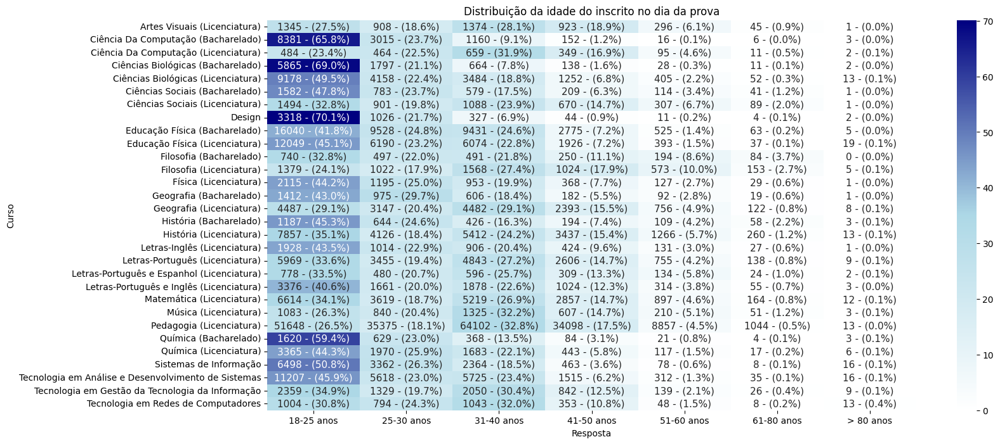

Heatmap salvo no diretório 'tabelas/enade/heatmap_NU_IDADE'


In [36]:
dir_entrada = 'microdados_tratados/form_microdados_arq6.csv'

qe_column = 'NU_IDADE'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição da idade do inscrito no dia da prova"

heatmap_idade(dir_entrada, qe_column,titulo)


#### microdados2021_arq5 
Edição, código de curso e sexo
-    "M": "Masculino"
-    "F": "Feminino"

In [16]:
dir_entrada = 'microdados_tratados/form_microdados_arq5.csv'

qe_column = 'TP_SEXO'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Gênero"

heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


TypeError: '<=' not supported between instances of 'str' and 'int'

#### microdados2021_arq7 
QE1: Qual o seu estado civil?
-  "A": "Solteiro(a)",
-   "B": "Casado(a)",
-    "C": "Separado(a) judicialmente/divorciado(a)",
 -   "D": "Viúvo(a)",
 -   "E": "Outro"

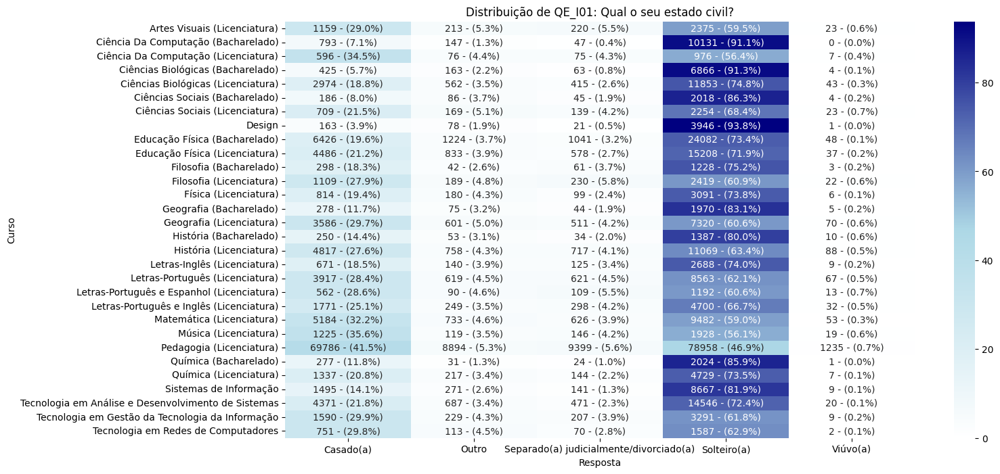

Heatmap salvo no diretório 'tabelas/enade/heatmap_QE_I01'


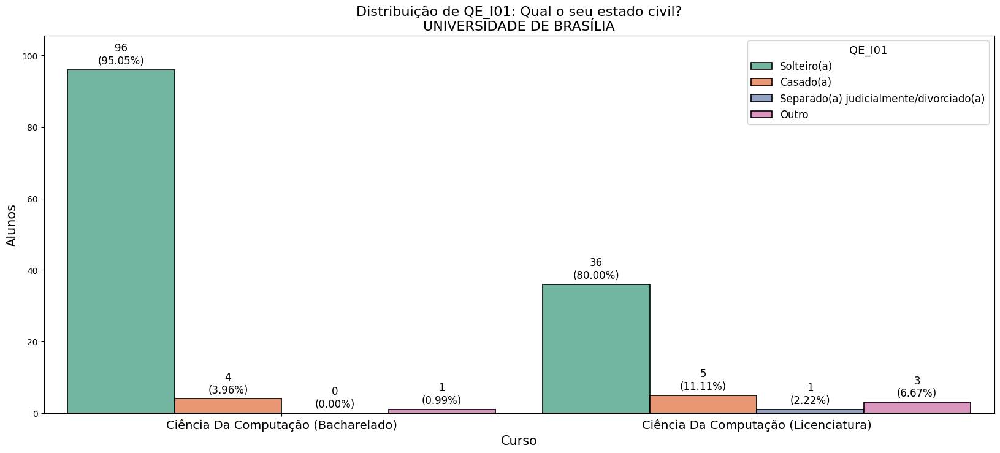

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq7.csv'

qe_column = 'QE_I01'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual o seu estado civil?"

heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)



#### microdados2021_arq8
QE2: Qual é a sua cor ou raça?
-    "A": "Branca",
-    "B": "Preta",
-    "C": "Amarela",
-    "D": "Parda",
-    "E": "Indígena",
-    "F": "Não quero declarar"

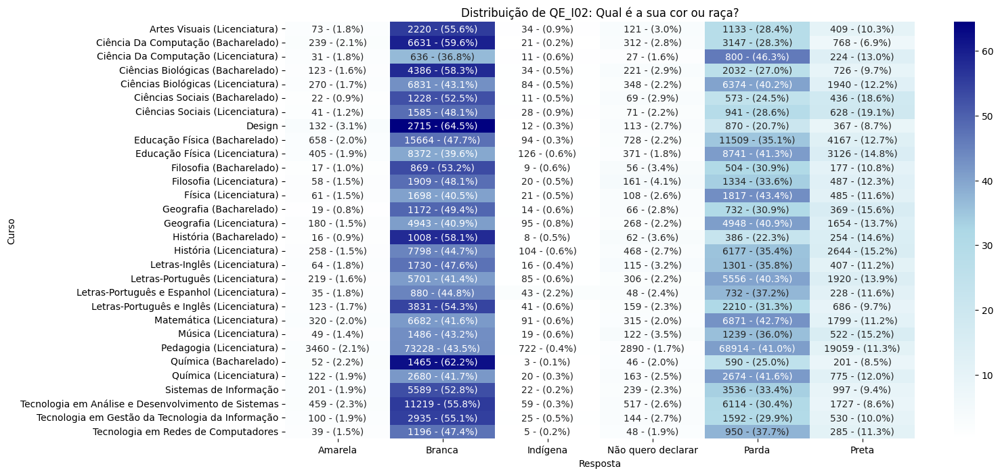

Heatmap salvo no diretório 'tabelas/enade/heatmap_QE_I02'


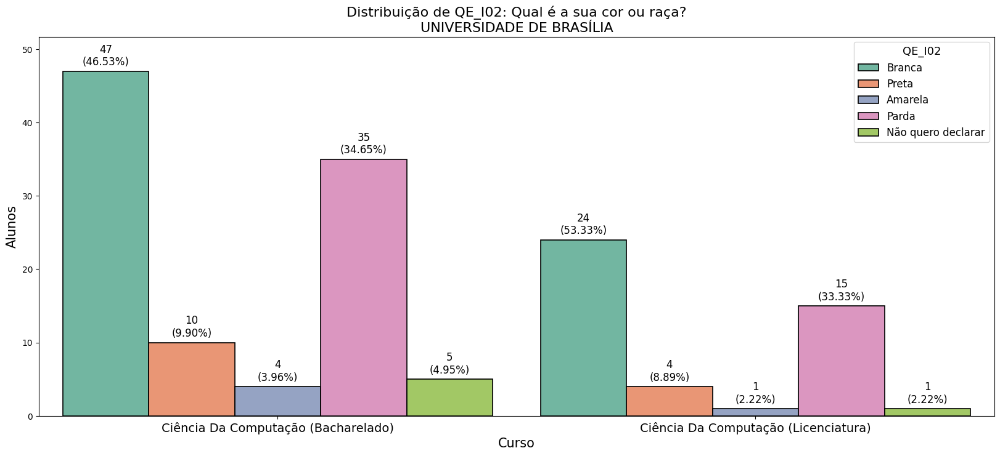

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq8.csv'

qe_column = 'QE_I02'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual é a sua cor ou raça?"

heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)

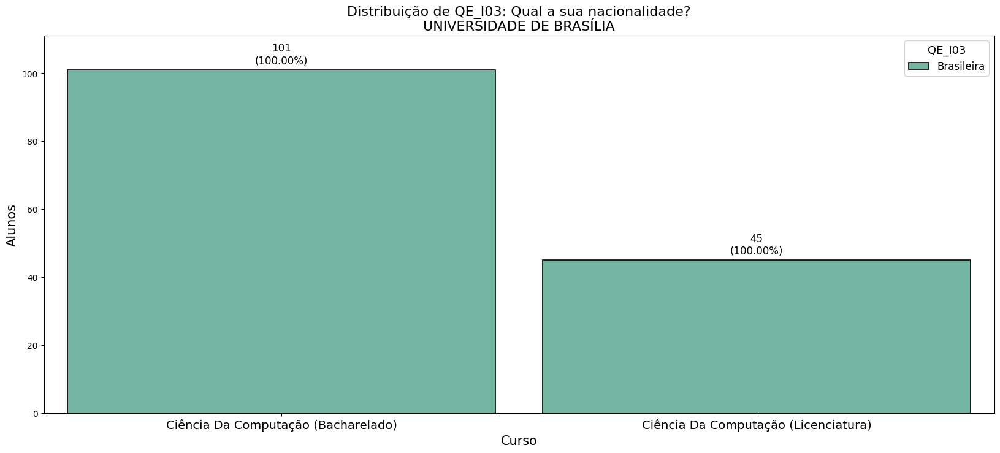

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq9.csv'

qe_column = 'QE_I03'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual a sua nacionalidade?"

#heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)

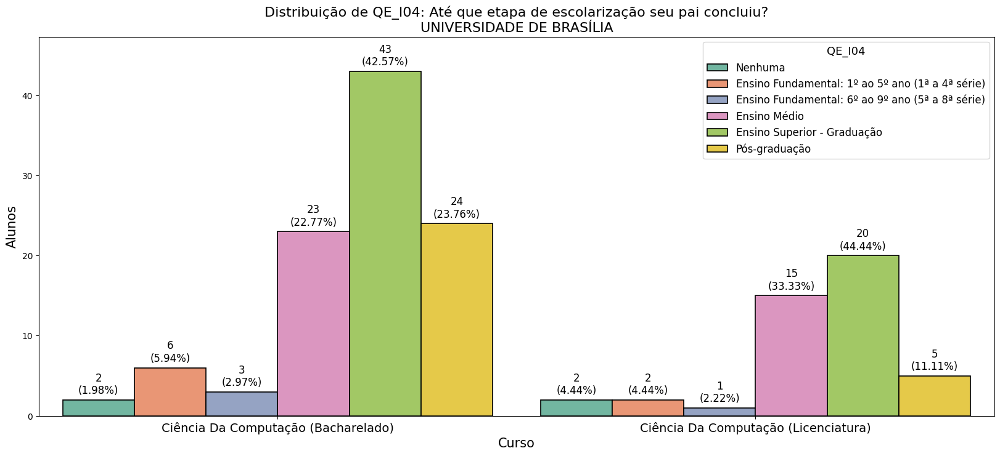

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq10.csv'

qe_column = 'QE_I04'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Até que etapa de escolarização seu pai concluiu?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)

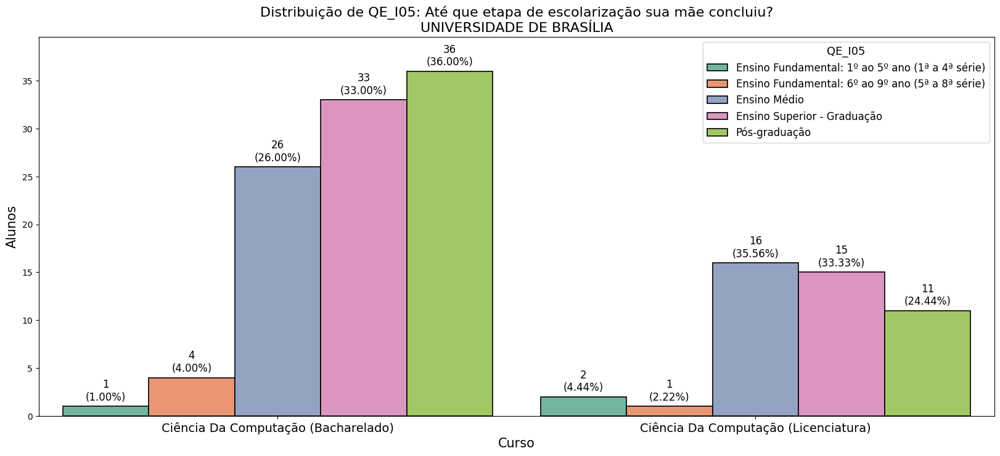

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq11.csv'

qe_column = 'QE_I05'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Até que etapa de escolarização sua mãe concluiu?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


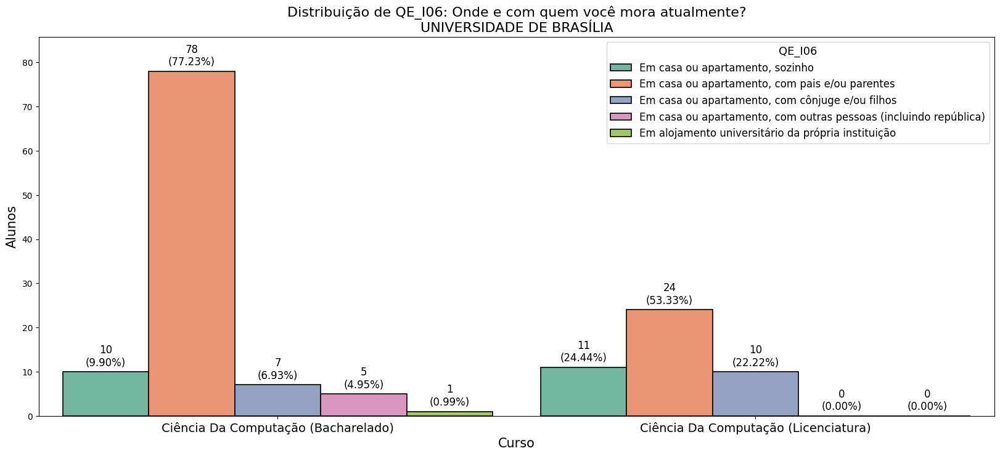

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq12.csv'

qe_column = 'QE_I06'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Onde e com quem você mora atualmente?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


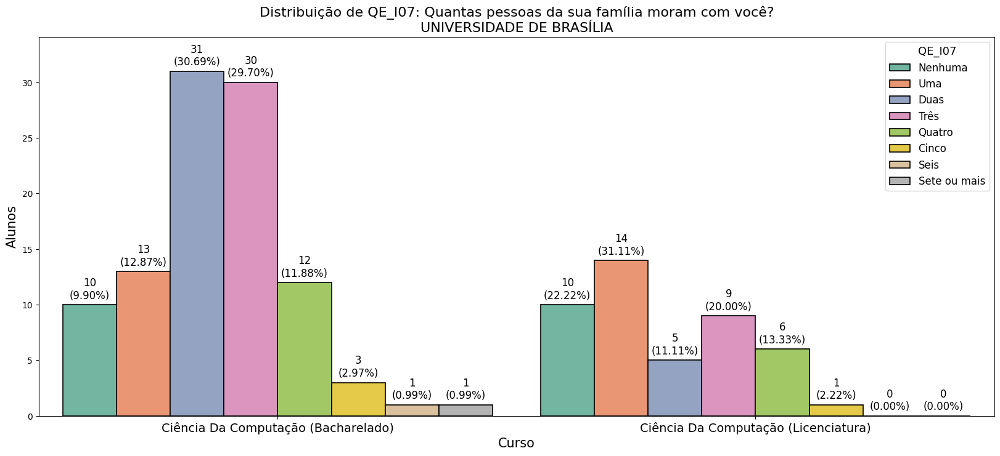

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq13.csv'

qe_column = 'QE_I07'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Quantas pessoas da sua família moram com você?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)



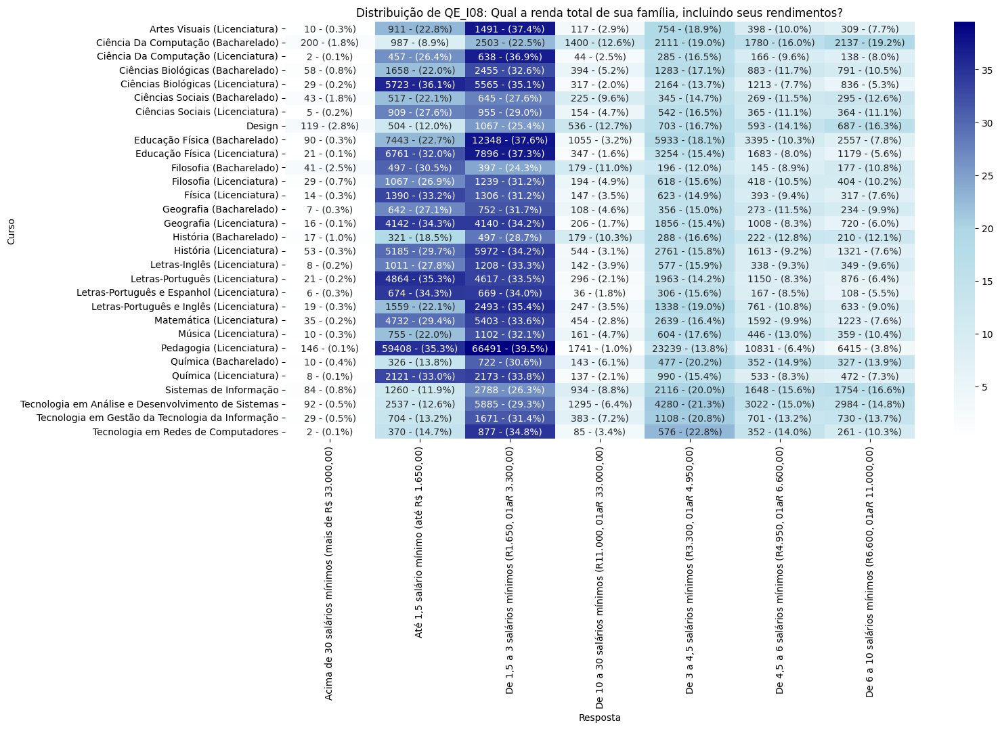

Heatmap salvo no diretório 'tabelas/enade/heatmap_QE_I08'


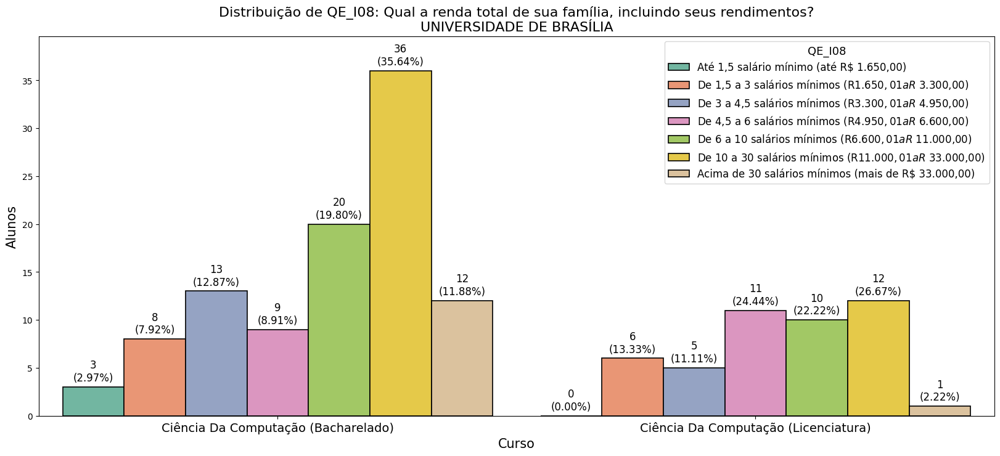

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq14.csv'

qe_column = 'QE_I08'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual a renda total de sua família, incluindo seus rendimentos?"
heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


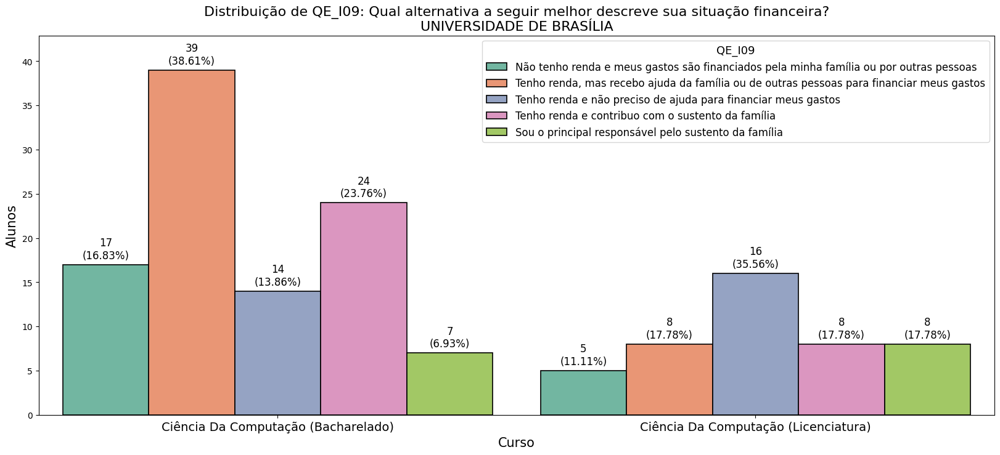

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq15.csv'

qe_column = 'QE_I09'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual alternativa a seguir melhor descreve sua situação financeira?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


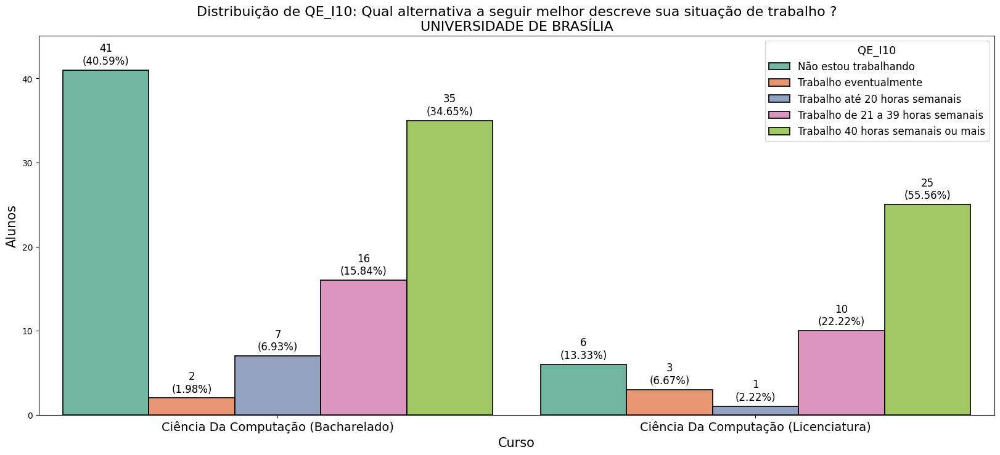

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq16.csv'

qe_column = 'QE_I10'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual alternativa a seguir melhor descreve sua situação de trabalho ?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


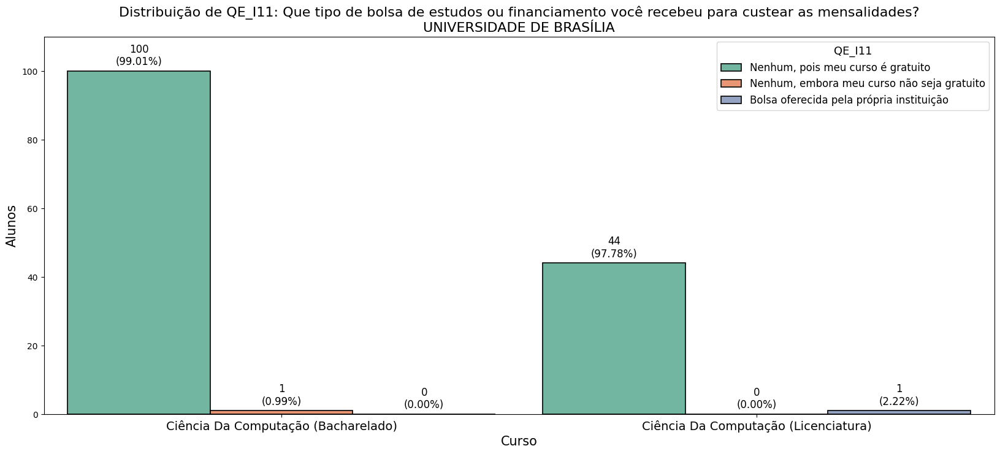

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq17.csv'

qe_column = 'QE_I11'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Que tipo de bolsa de estudos ou financiamento você recebeu para custear as mensalidades?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


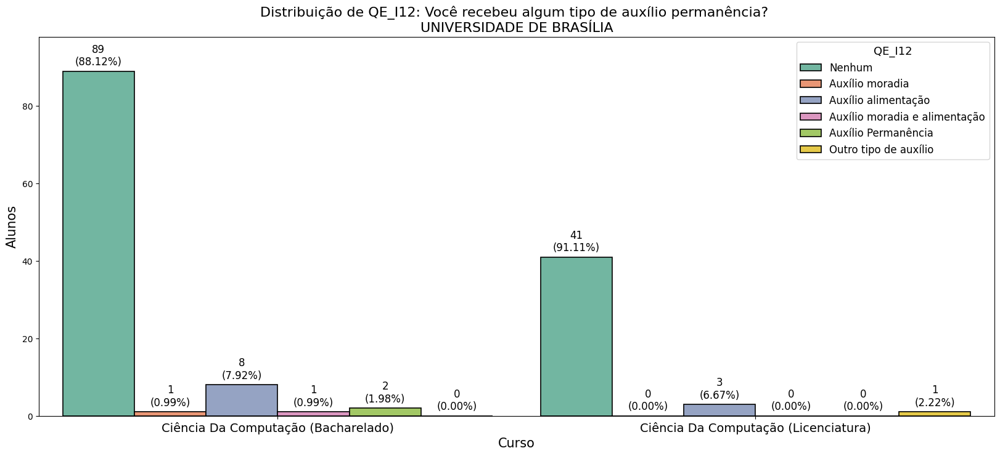

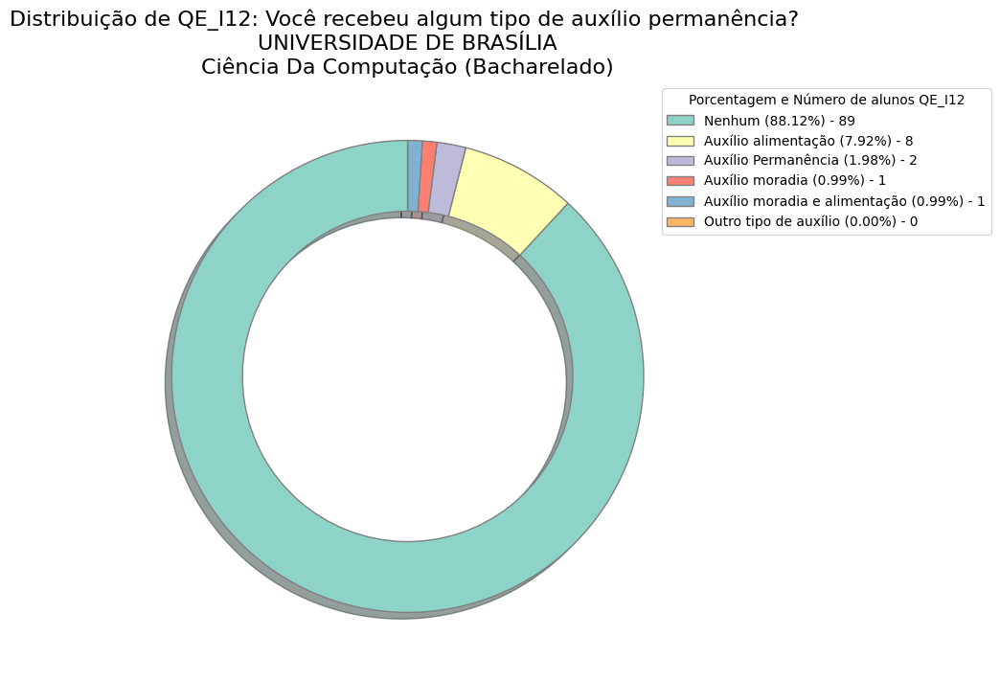

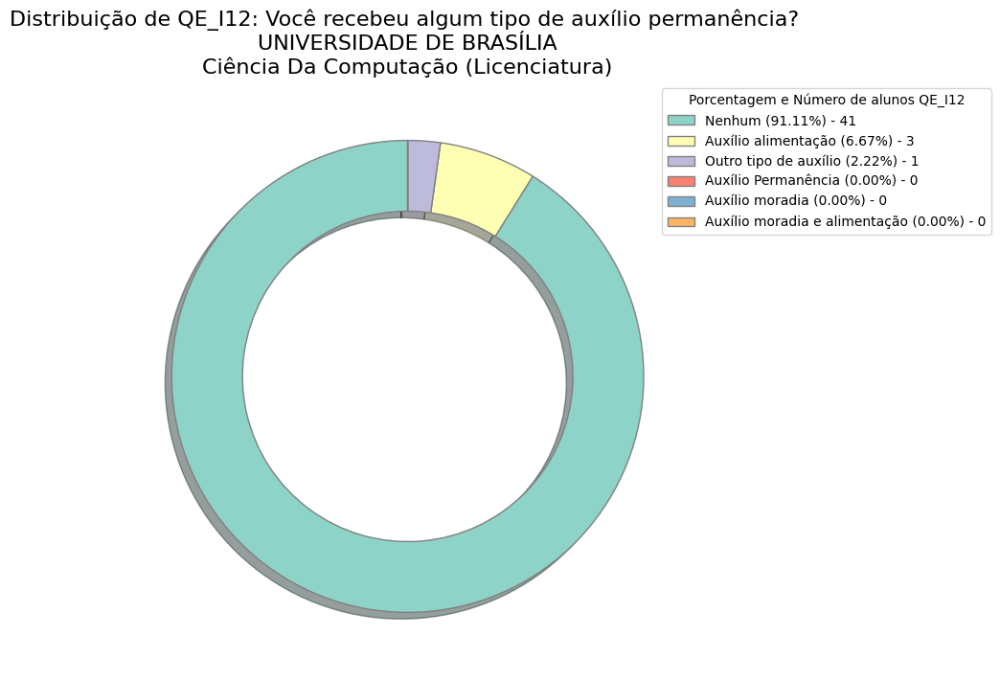

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq18.csv'

qe_column = 'QE_I12'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Você recebeu algum tipo de auxílio permanência? "


grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


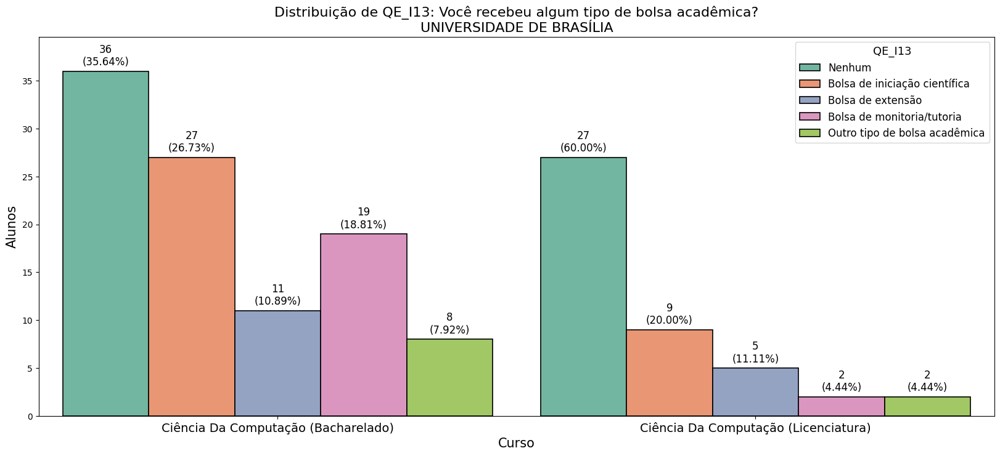

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq19.csv'

qe_column = 'QE_I13'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Você recebeu algum tipo de bolsa acadêmica?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


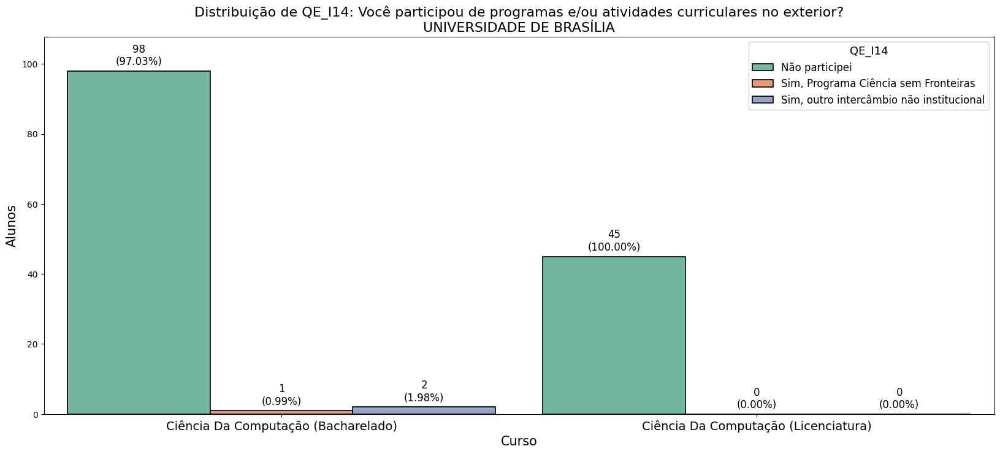

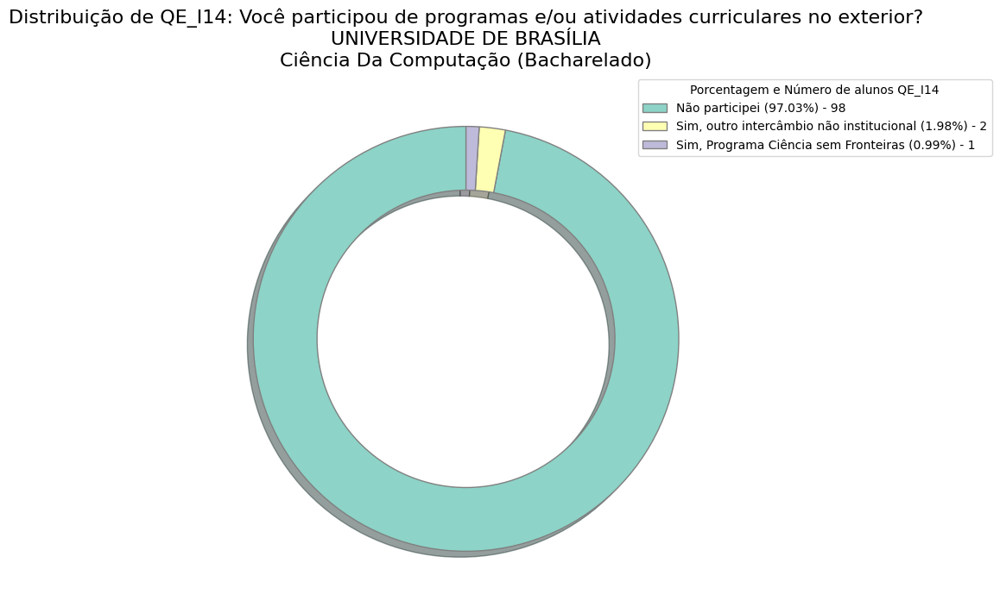

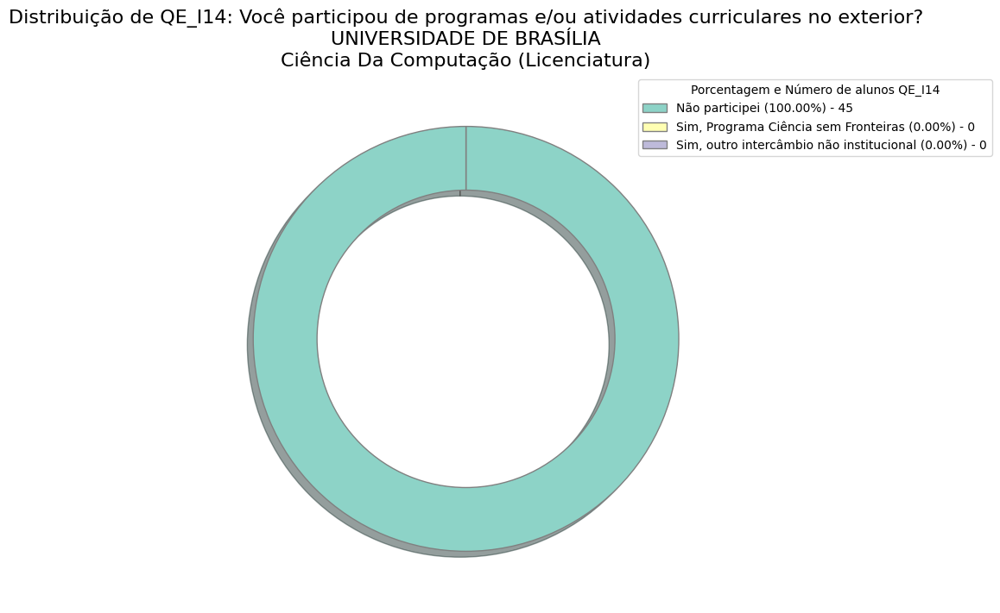

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq20.csv'

qe_column = 'QE_I14'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Você participou de programas e/ou atividades curriculares no exterior?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


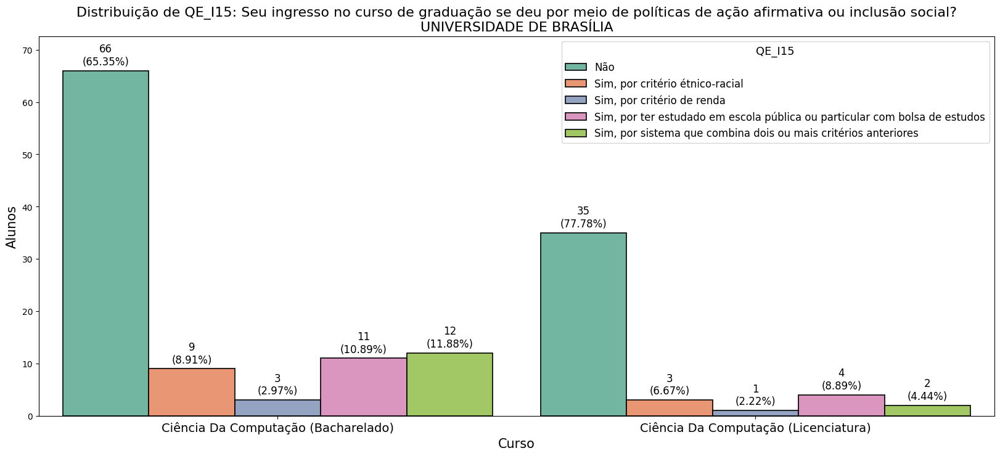

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq21.csv'

qe_column = 'QE_I15'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Seu ingresso no curso de graduação se deu por meio de políticas de ação afirmativa ou inclusão social?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


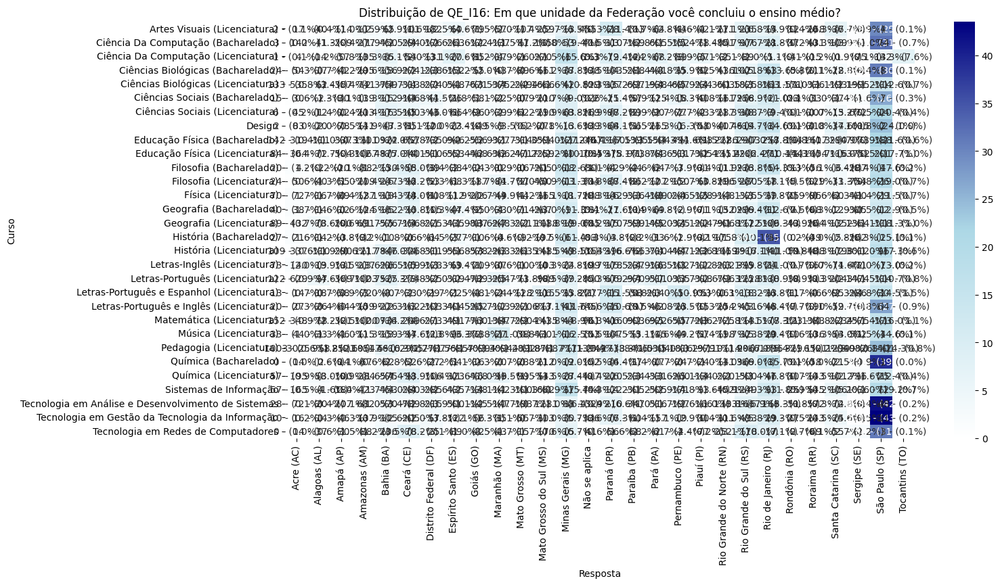

Heatmap salvo no diretório 'tabelas/enade/heatmap_QE_I16'


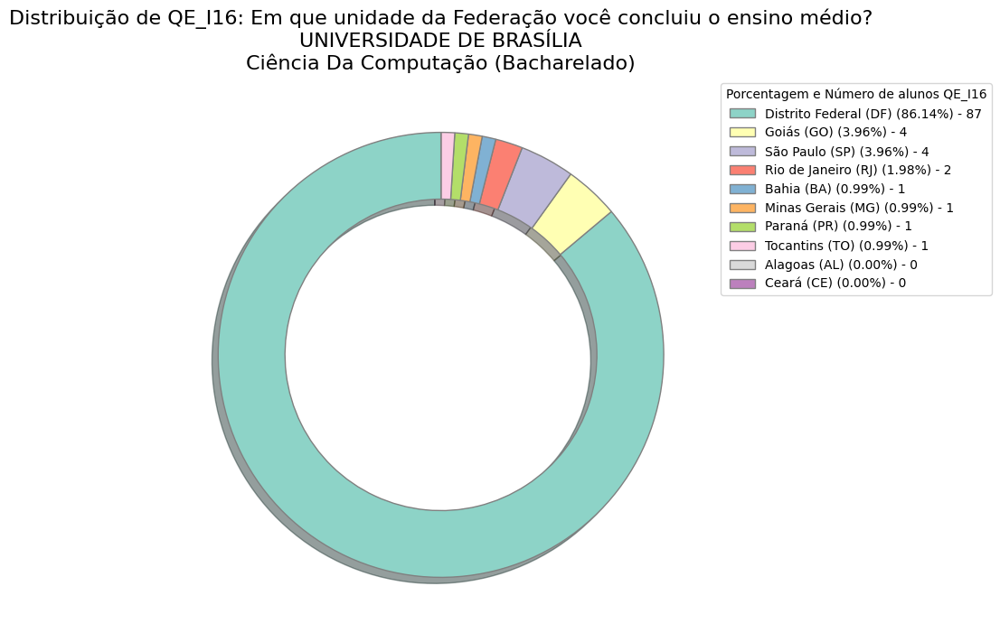

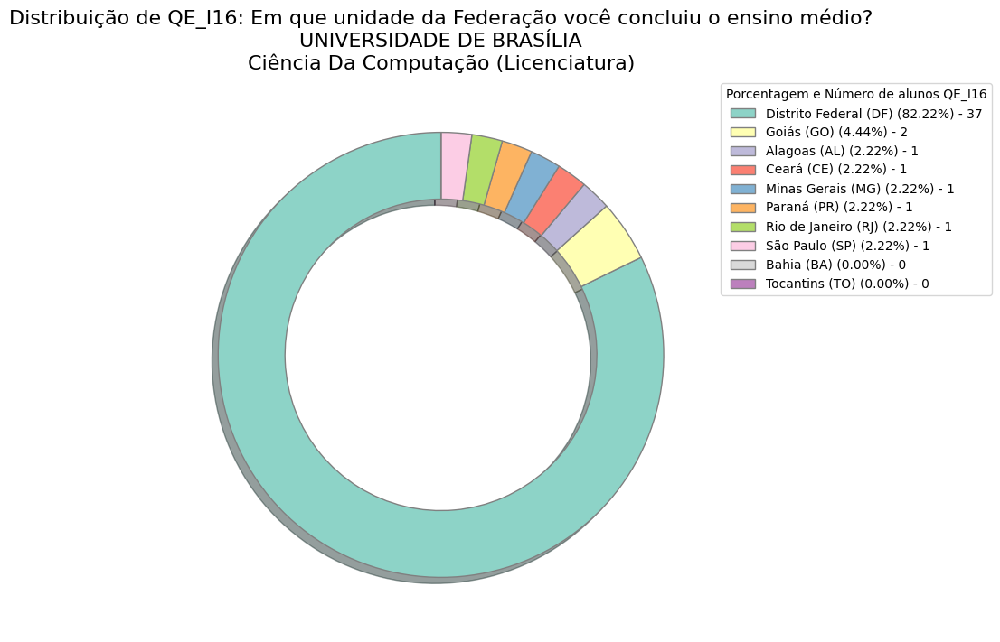

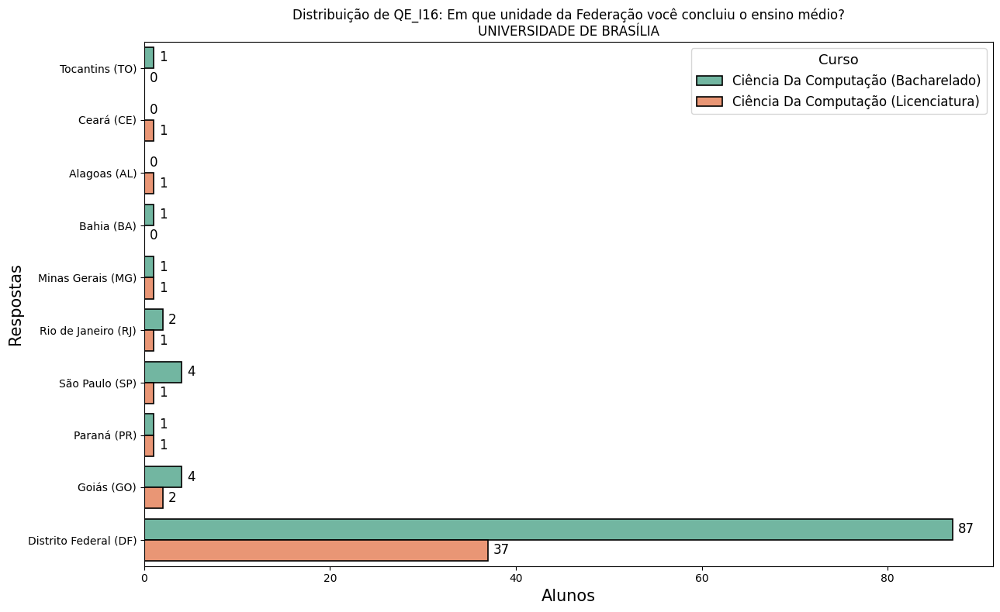

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq22.csv'

qe_column = 'QE_I16'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Em que unidade da Federação você concluiu o ensino médio?"
heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada, qe_column, titulo)



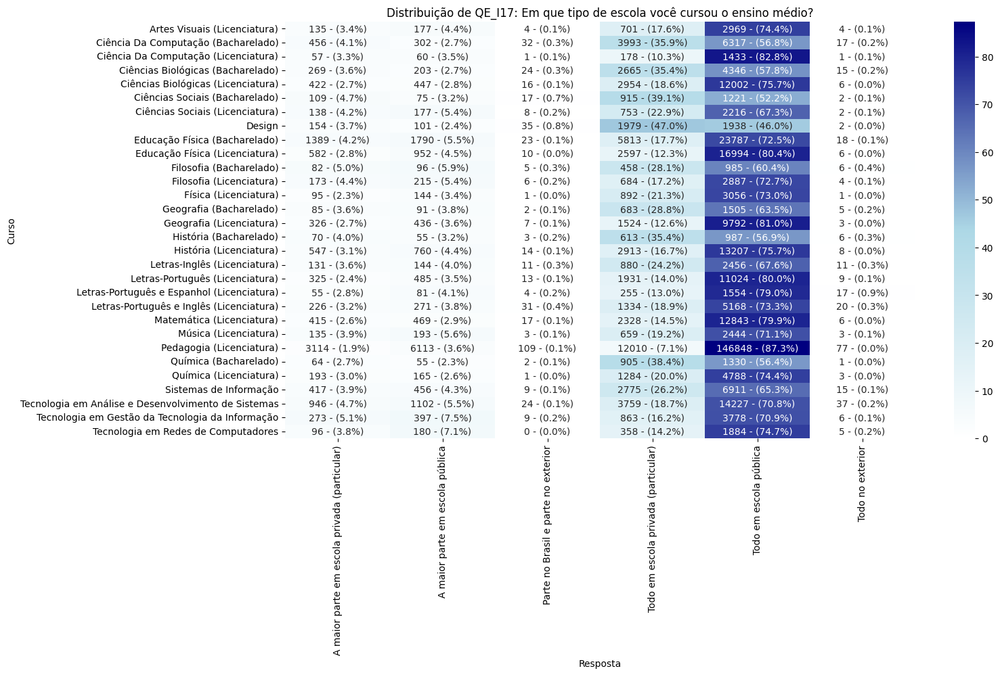

Heatmap salvo no diretório 'tabelas/enade/heatmap_QE_I17'


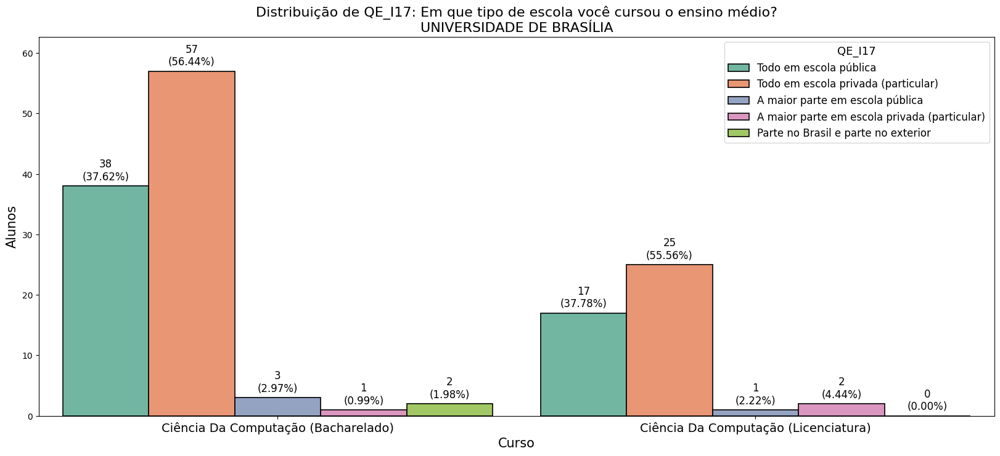

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq23.csv'

qe_column = 'QE_I17'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Em que tipo de escola você cursou o ensino médio?"

heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


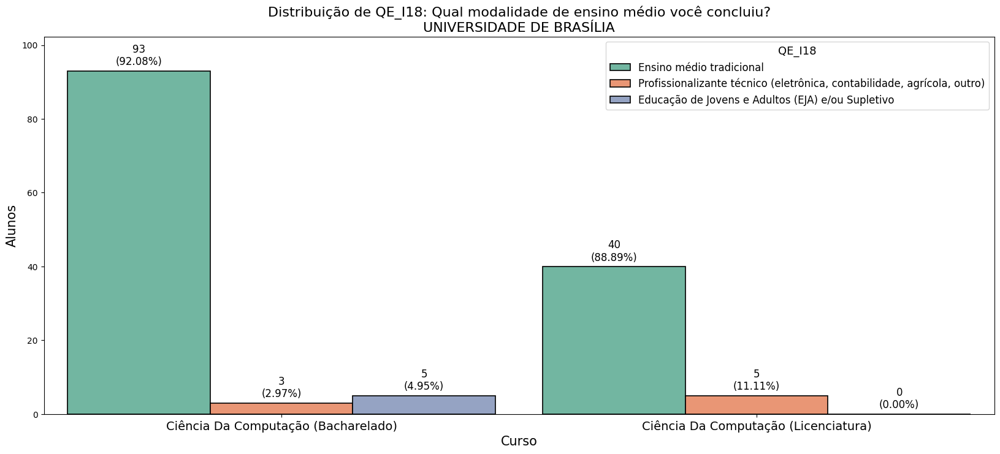

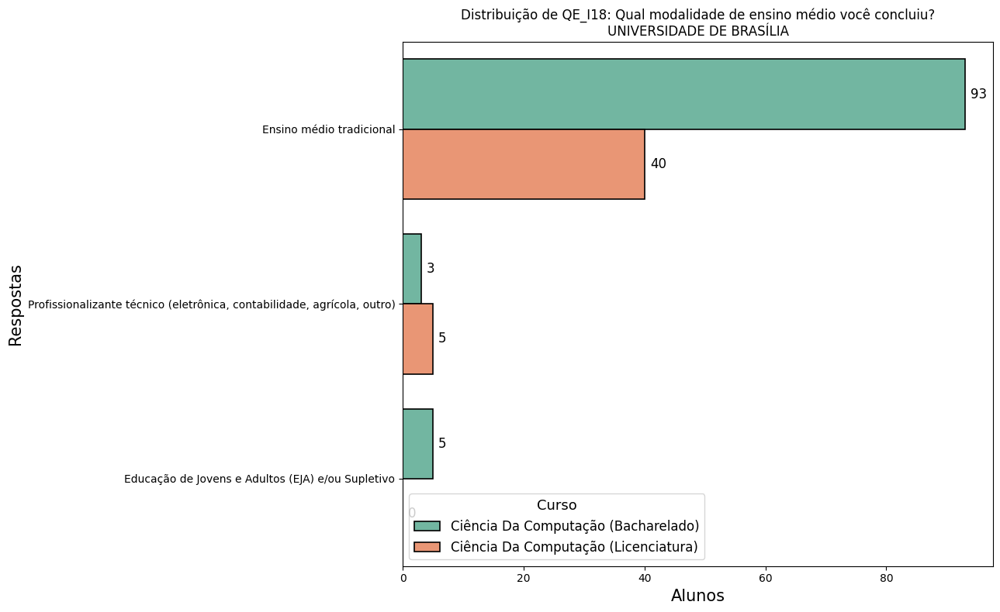

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq24.csv'

qe_column = 'QE_I18'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual modalidade de ensino médio você concluiu?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada, qe_column, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


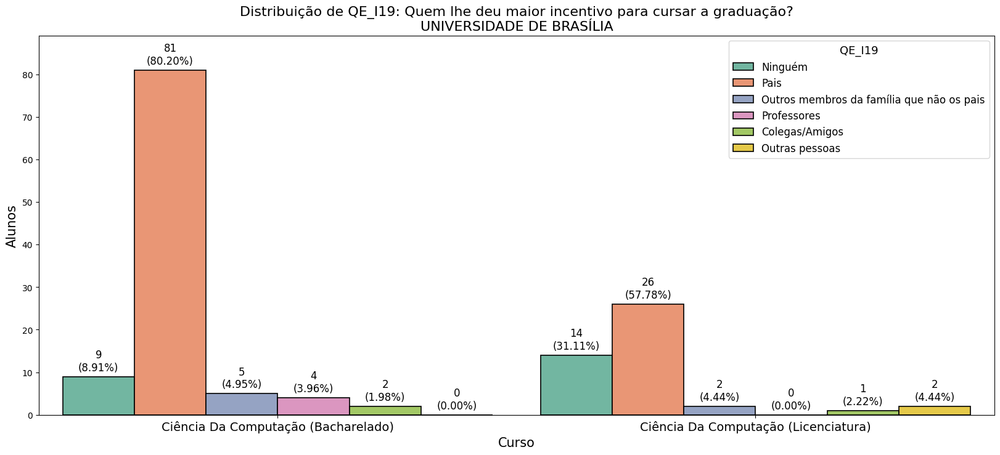

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq25.csv'

qe_column = 'QE_I19'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Quem lhe deu maior incentivo para cursar a graduação?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


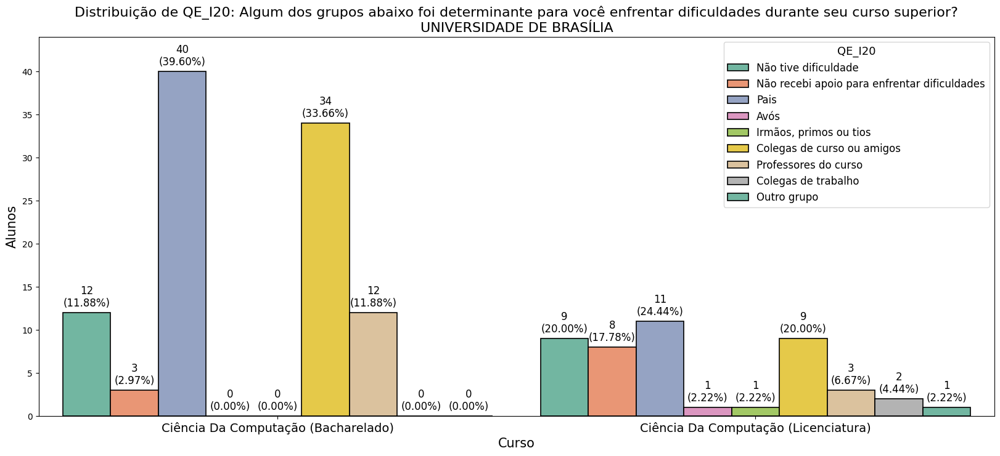

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq26.csv'

qe_column = 'QE_I20'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Algum dos grupos abaixo foi determinante para você enfrentar dificuldades durante seu curso superior?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


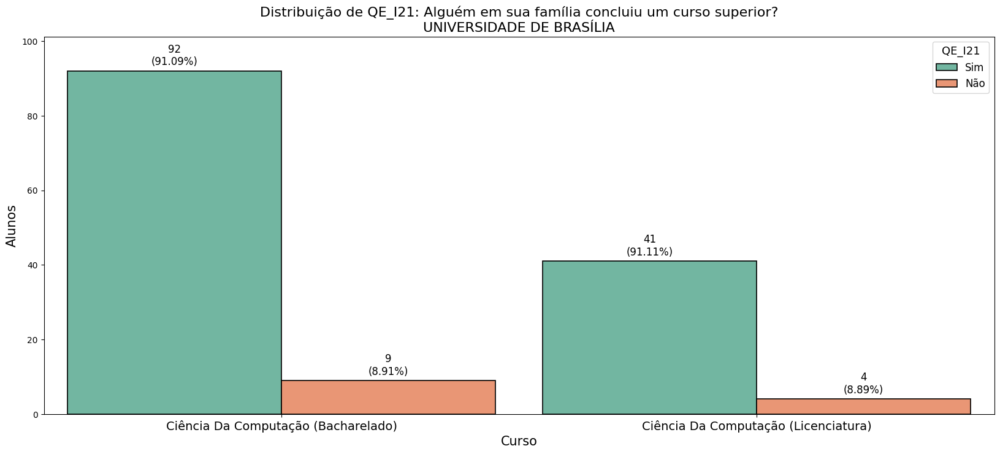

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq27.csv'

qe_column = 'QE_I21'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Alguém em sua família concluiu um curso superior?"


grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


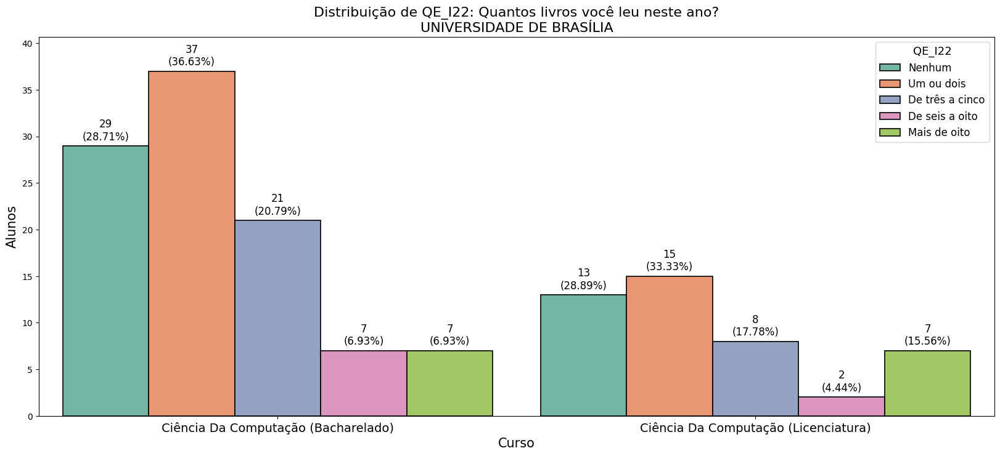

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq28.csv'

qe_column = 'QE_I22'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Quantos livros você leu neste ano?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


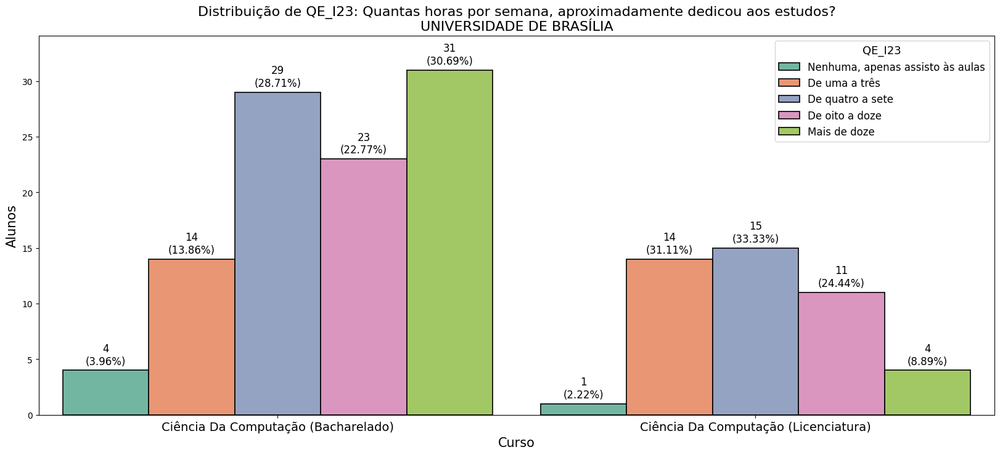

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq29.csv'

qe_column = 'QE_I23'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Quantas horas por semana, aproximadamente dedicou aos estudos?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


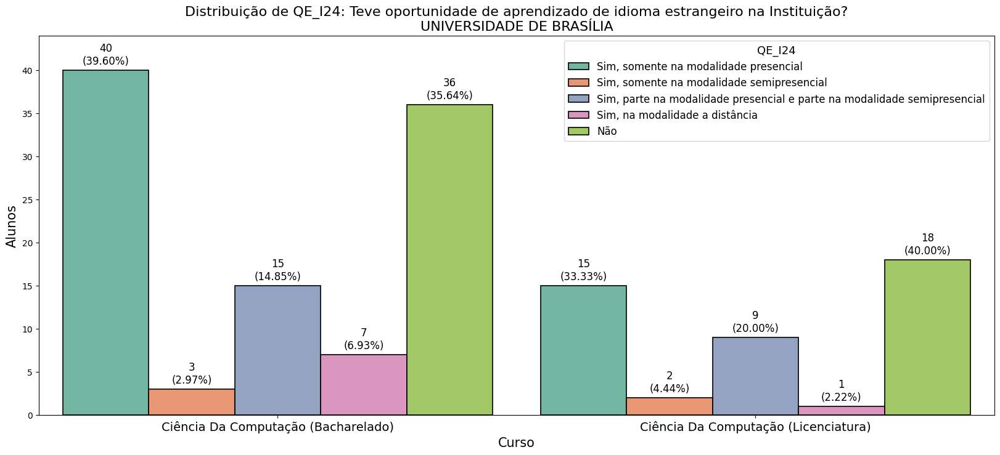

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq30.csv'

qe_column = 'QE_I24'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Teve oportunidade de aprendizado de idioma estrangeiro na Instituição?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


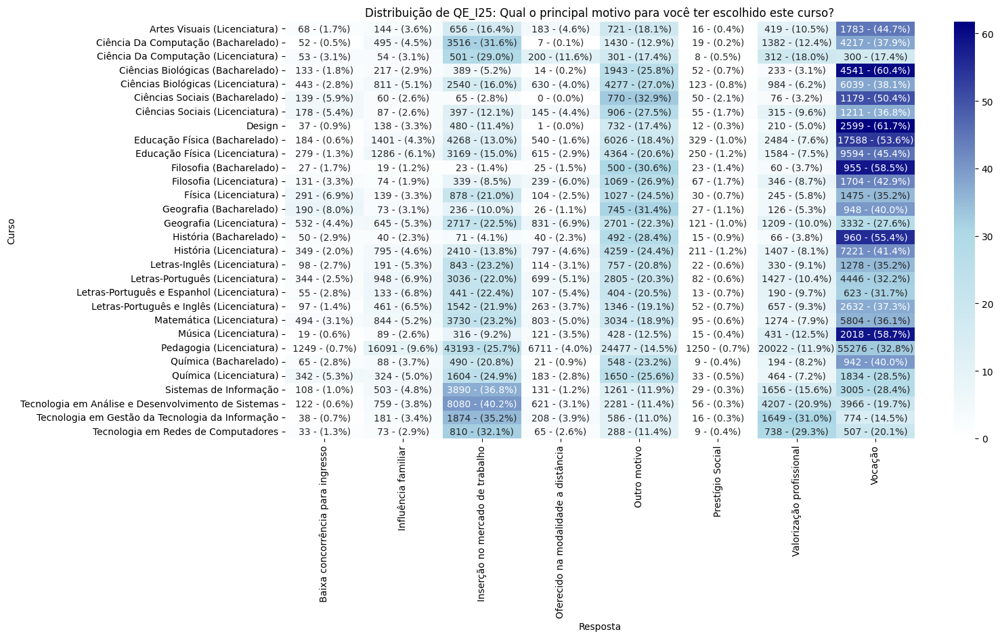

Heatmap salvo no diretório 'tabelas/enade/heatmap_QE_I25'


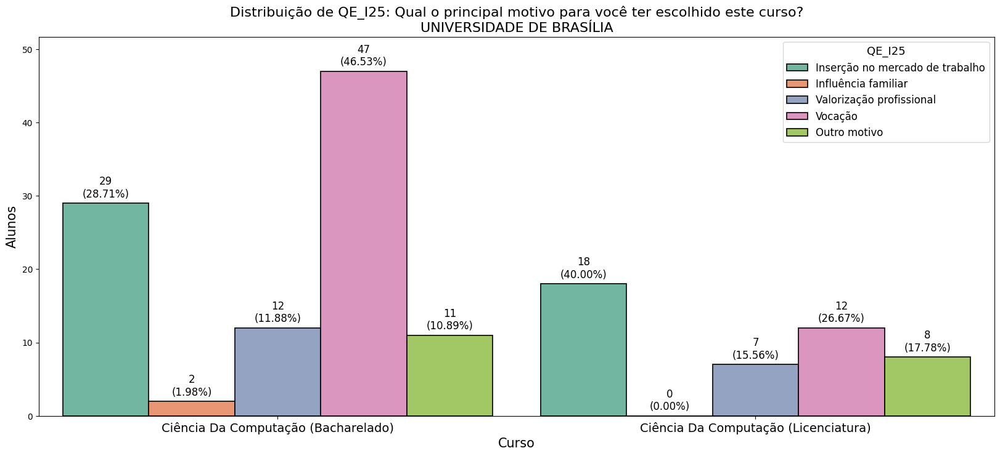

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq31.csv'

qe_column = 'QE_I25'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual o principal motivo para você ter escolhido este curso?"

heatmap_todos_cursos(dir_entrada, qe_column,titulo)
grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


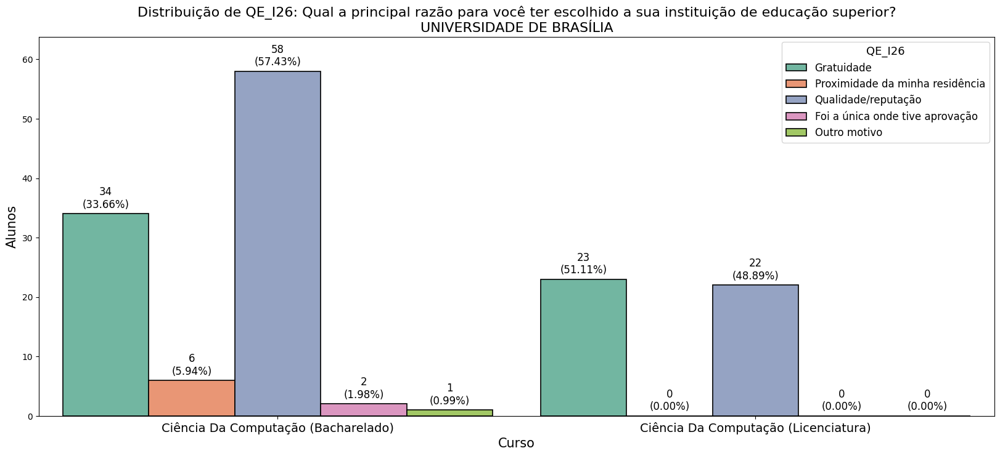

In [ ]:
dir_entrada = 'microdados_tratados/form_microdados_arq32.csv'

qe_column = 'QE_I26'
dir_destino = f'{questionario}/grafico_{qe_column}'
titulo = f"Distribuição de {qe_column}: Qual a principal razão para você ter escolhido a sua instituição de educação superior?"

grafico_microdados_barras(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)


### Analisis questoes assertivas

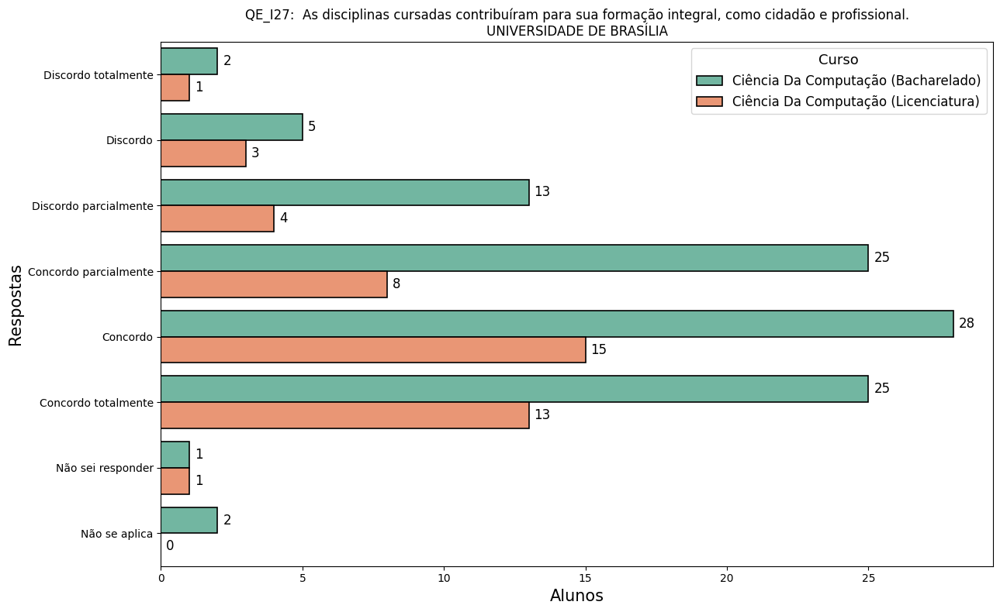

In [ ]:

dir_entrada_dis = 'microdados_tratados/form_microdados_arq4.csv'
qe_column = 'QE_I27'

titulo = f"{qe_column}:  As disciplinas cursadas contribuíram para sua formação integral, como cidadão e profissional."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)
#grafico_microdados_circular(dir_entrada, qe_column, faculdades_filtradas_CO_IES, cursos_analisados, dir_destino, titulo)

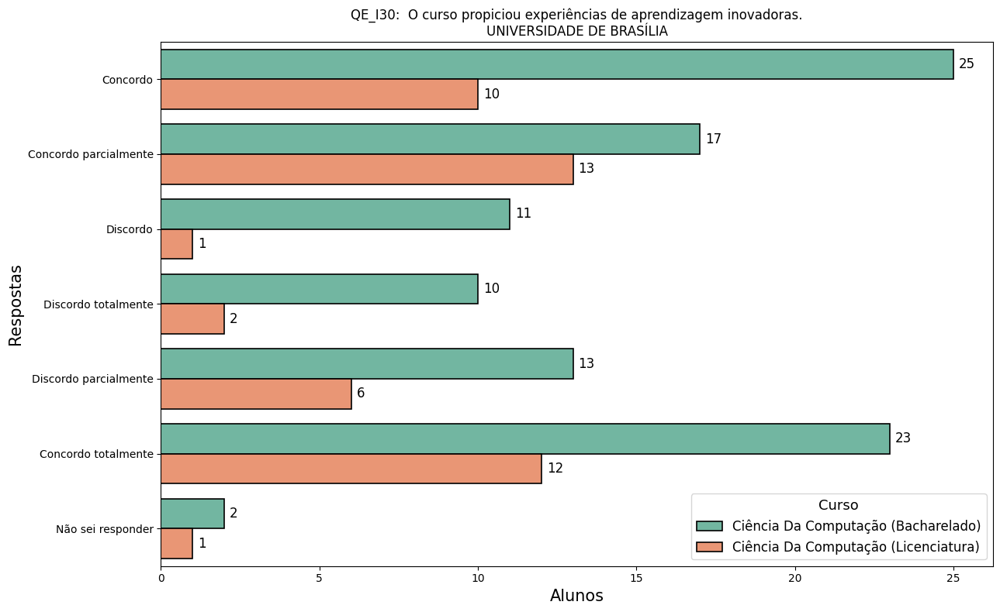

In [ ]:
qe_column = 'QE_I30'
titulo = f"{qe_column}:  O curso propiciou experiências de aprendizagem inovadoras."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


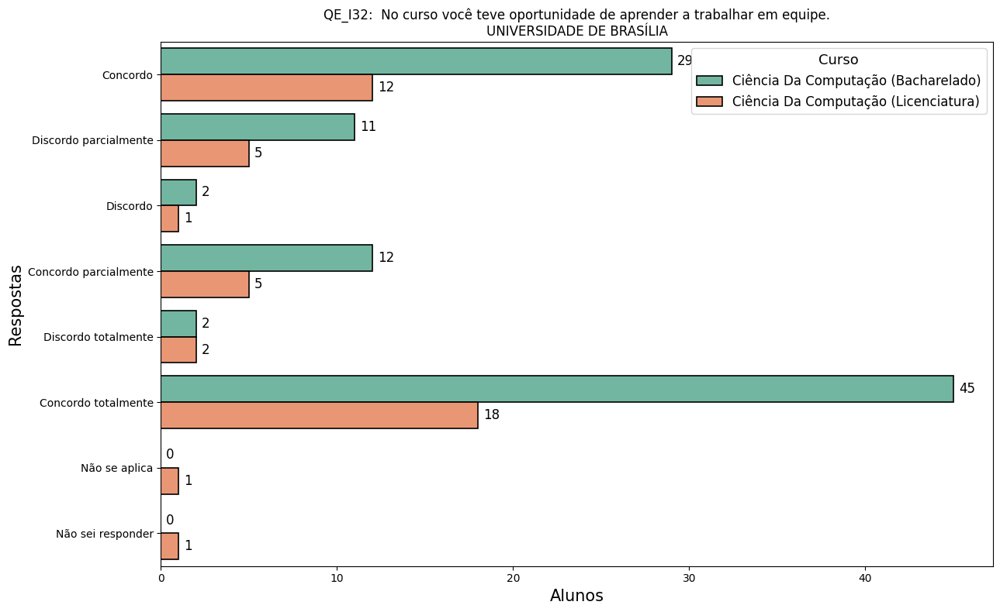

In [ ]:
qe_column = 'QE_I32'
titulo = f"{qe_column}:  No curso você teve oportunidade de aprender a trabalhar em equipe."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


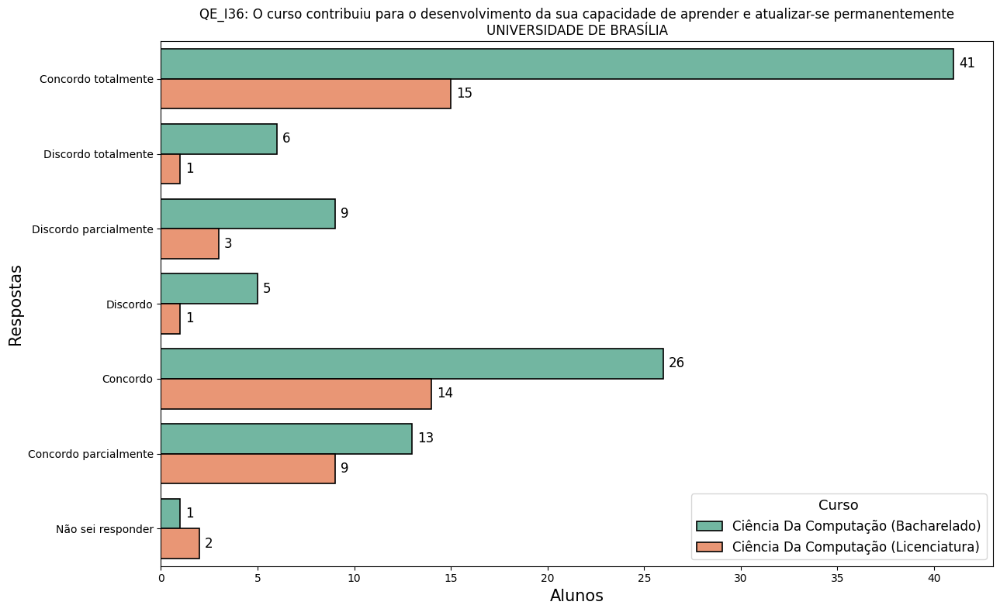

In [ ]:
qe_column = 'QE_I36'
titulo = f"{qe_column}: O curso contribuiu para o desenvolvimento da sua capacidade de aprender e atualizar-se permanentemente"

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


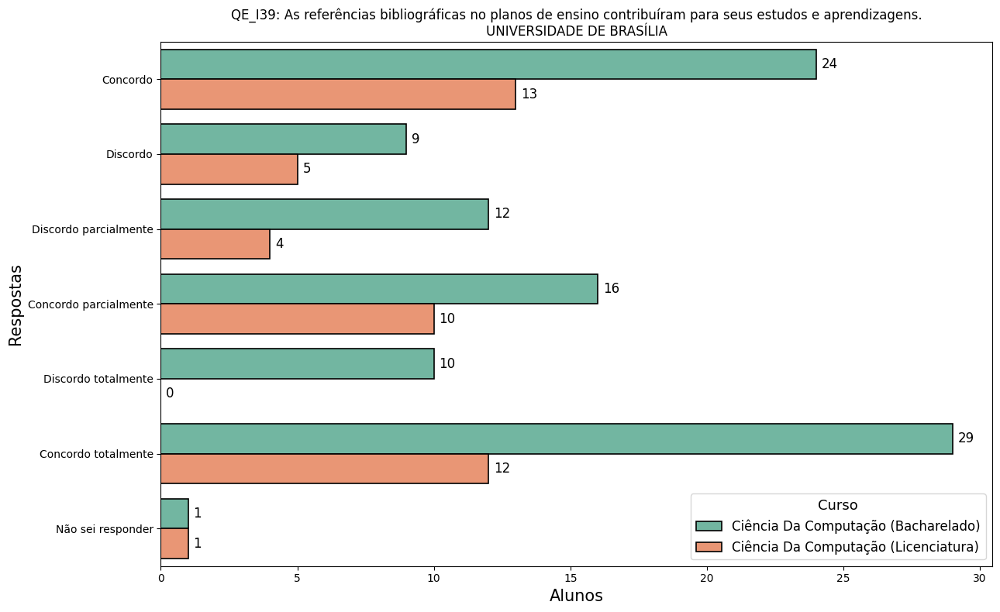

In [ ]:
qe_column = 'QE_I39'
titulo = f"{qe_column}: As referências bibliográficas no planos de ensino contribuíram para seus estudos e aprendizagens."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


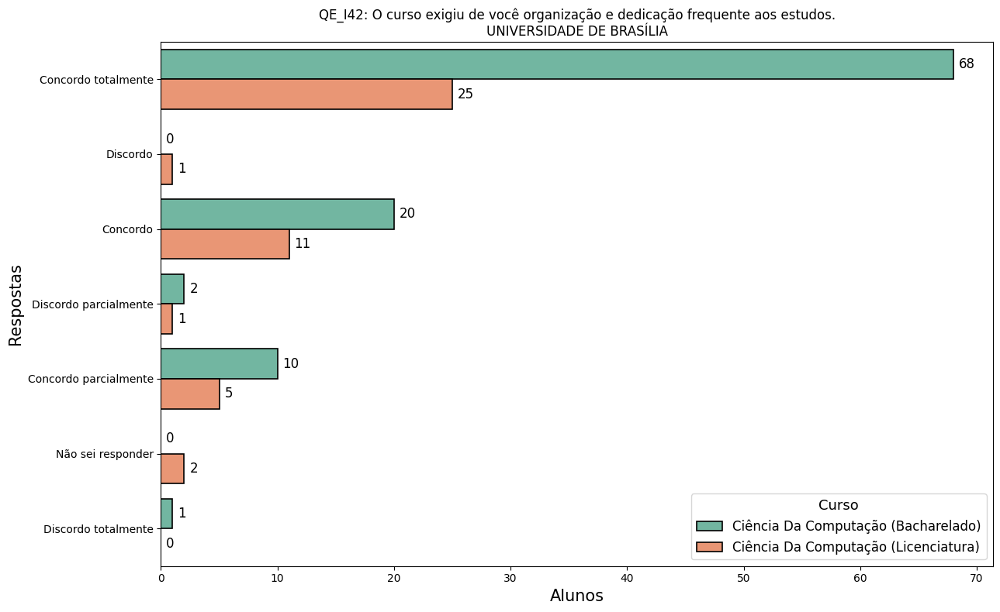

In [ ]:
qe_column = 'QE_I42'
titulo = f"{qe_column}: O curso exigiu de você organização e dedicação frequente aos estudos."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


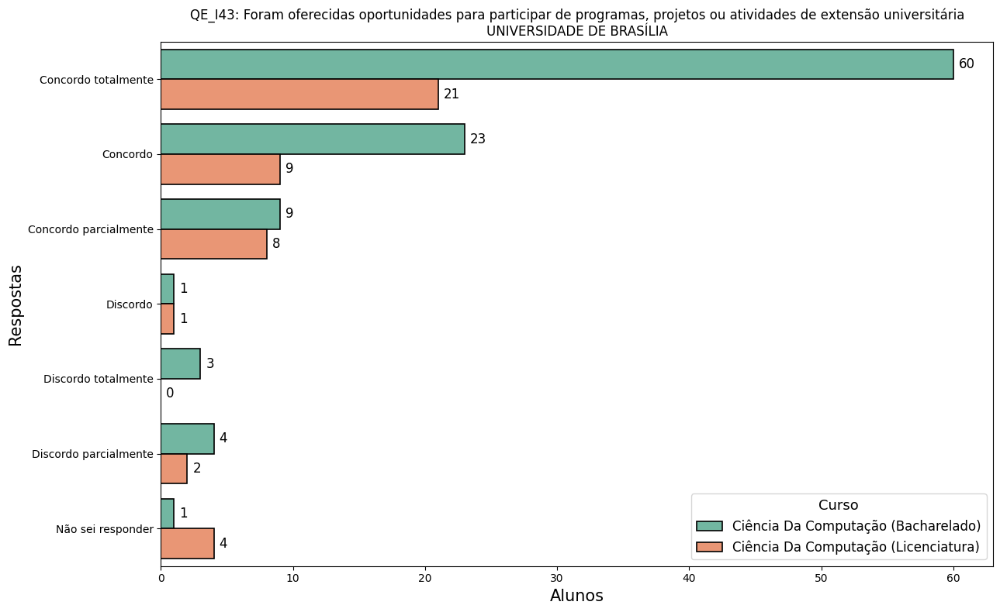

In [ ]:
qe_column = 'QE_I43'
titulo = f"{qe_column}: Foram oferecidas oportunidades para participar de programas, projetos ou atividades de extensão universitária"

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


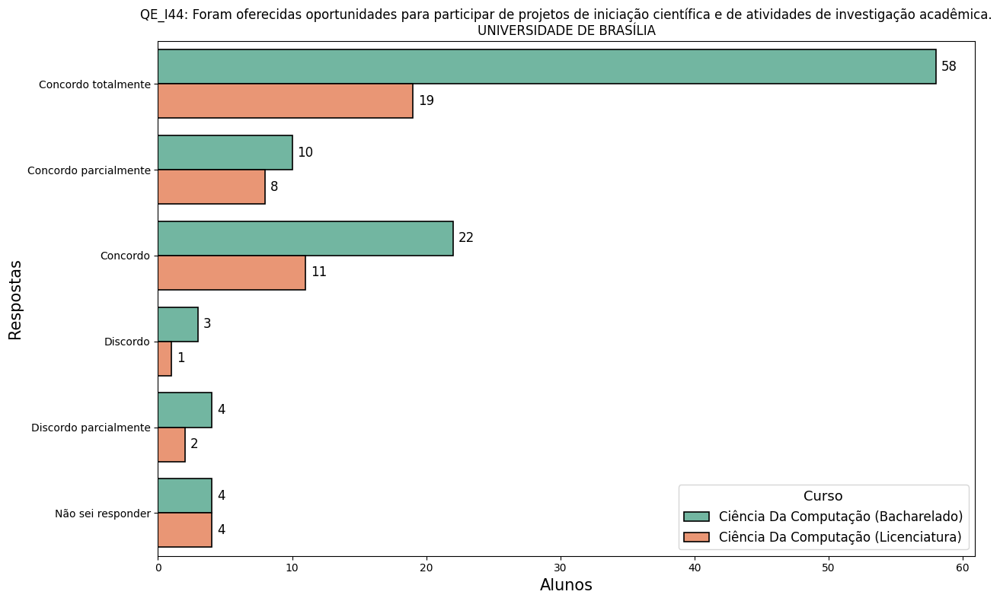

In [ ]:
qe_column = 'QE_I44'
titulo = f"{qe_column}: Foram oferecidas oportunidades para participar de projetos de iniciação científica e de atividades de investigação acadêmica."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


In [ ]:
qe_column = 'QE_I45'
titulo = f"{qe_column}: O curso ofereceu condições para os estudantes participarem de eventos internos e/ou externos à instituição."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


KeyboardInterrupt: 

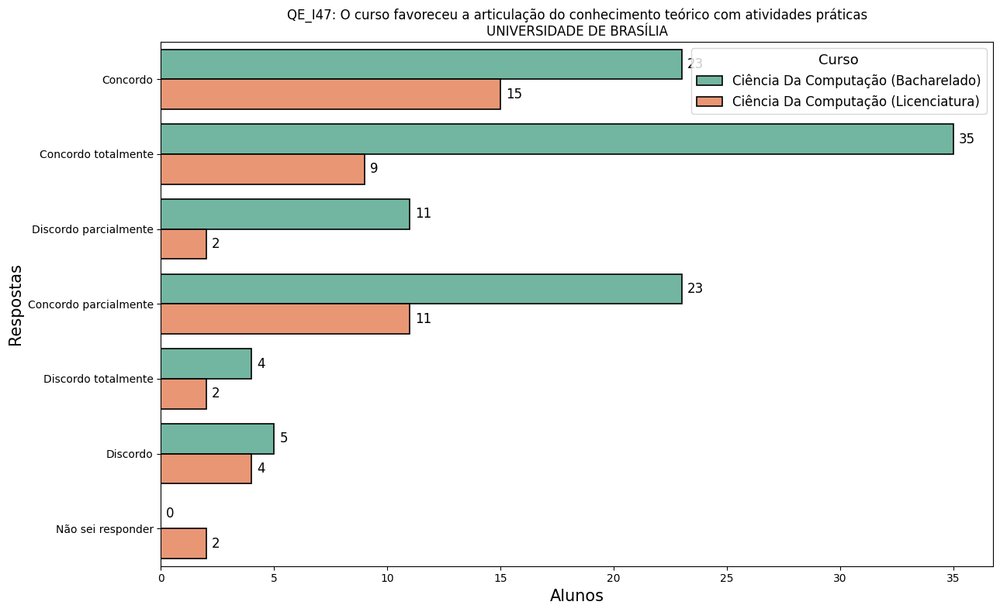

In [ ]:
qe_column = 'QE_I47'
titulo = f"{qe_column}: O curso favoreceu a articulação do conhecimento teórico com atividades práticas"

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


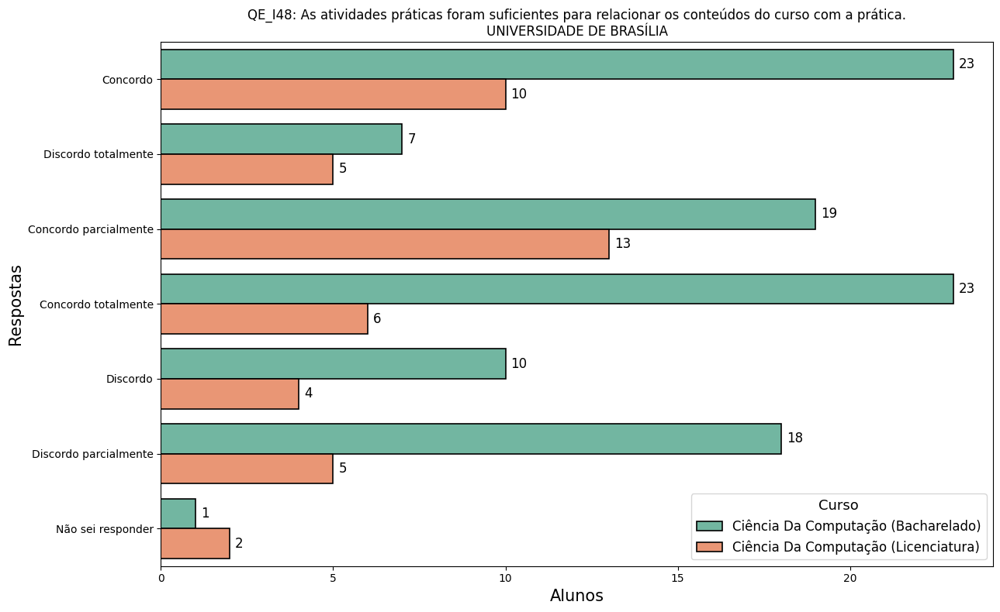

In [ ]:
qe_column = 'QE_I48'
titulo = f"{qe_column}: As atividades práticas foram suficientes para relacionar os conteúdos do curso com a prática."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


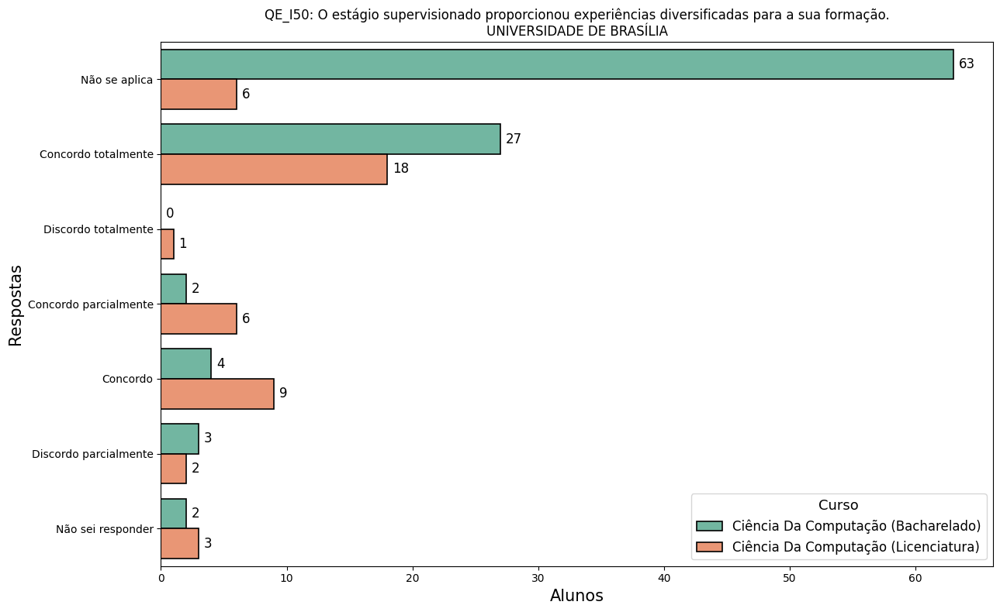

In [ ]:
qe_column = 'QE_I50'
titulo = f"{qe_column}: O estágio supervisionado proporcionou experiências diversificadas para a sua formação."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


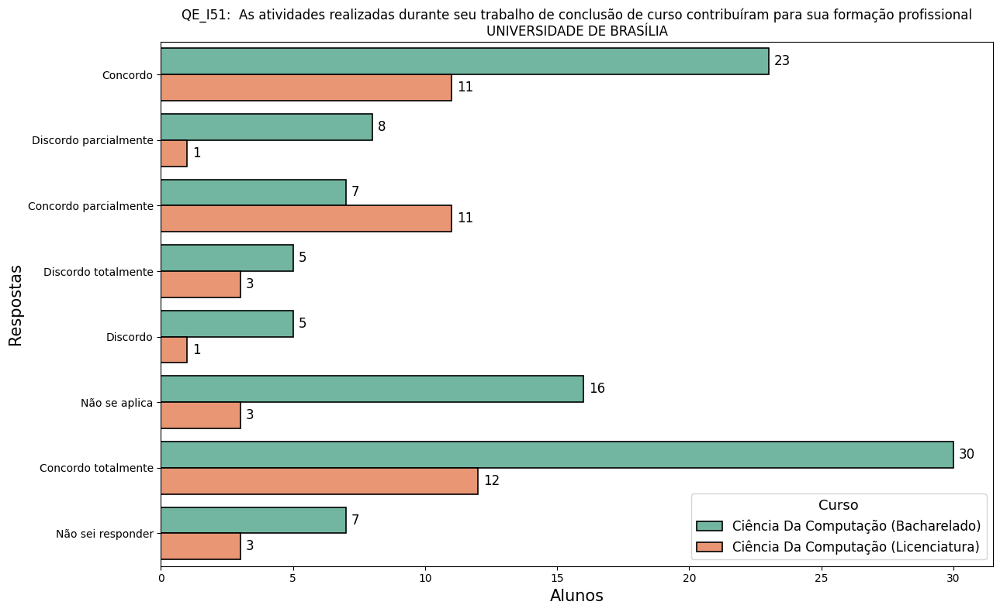

In [ ]:
qe_column = 'QE_I51'
titulo = f"{qe_column}:  As atividades realizadas durante seu trabalho de conclusão de curso contribuíram para sua formação profissional"

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


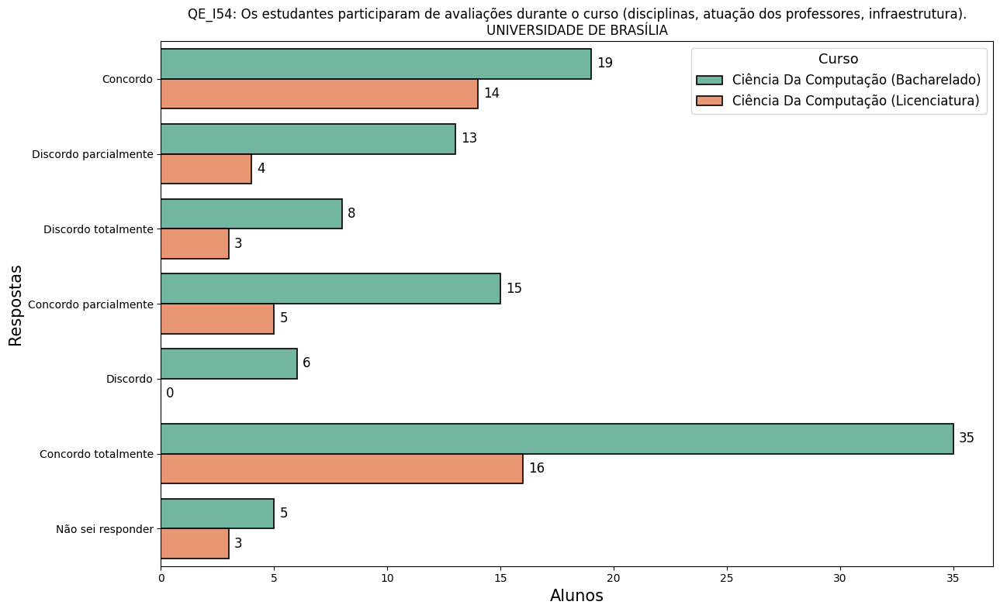

In [ ]:
qe_column = 'QE_I54'
titulo = f"{qe_column}: Os estudantes participaram de avaliações durante o curso (disciplinas, atuação dos professores, infraestrutura)."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


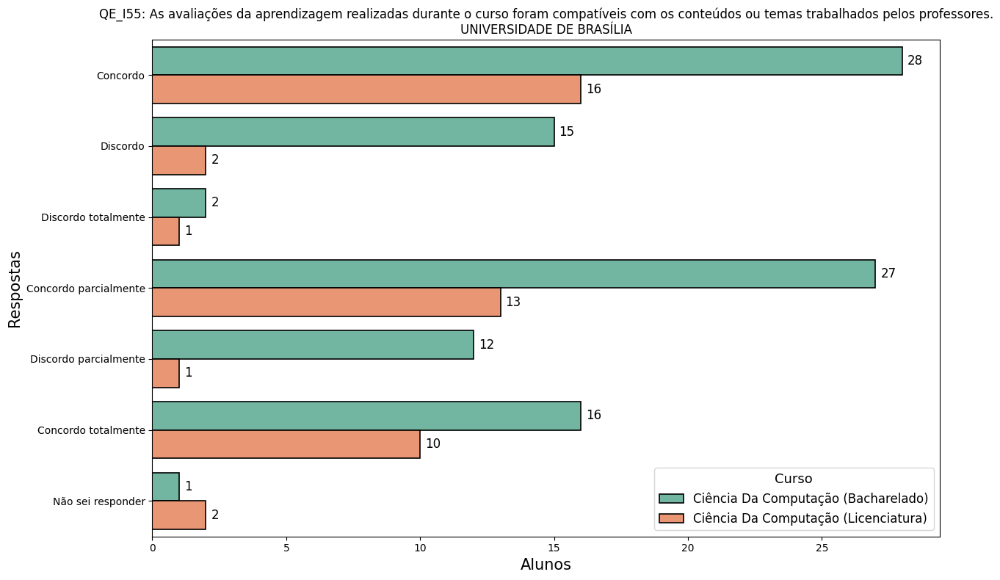

In [ ]:
qe_column = 'QE_I55'
titulo = f"{qe_column}: As avaliações da aprendizagem realizadas durante o curso foram compatíveis com os conteúdos ou temas trabalhados pelos professores."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


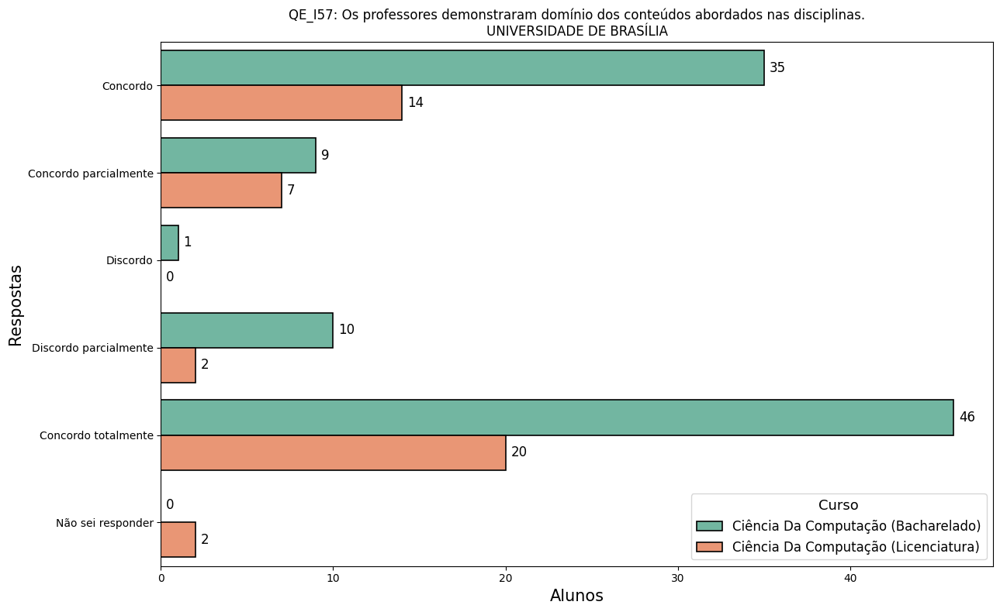

In [ ]:
qe_column = 'QE_I57'
titulo = f"{qe_column}: Os professores demonstraram domínio dos conteúdos abordados nas disciplinas."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


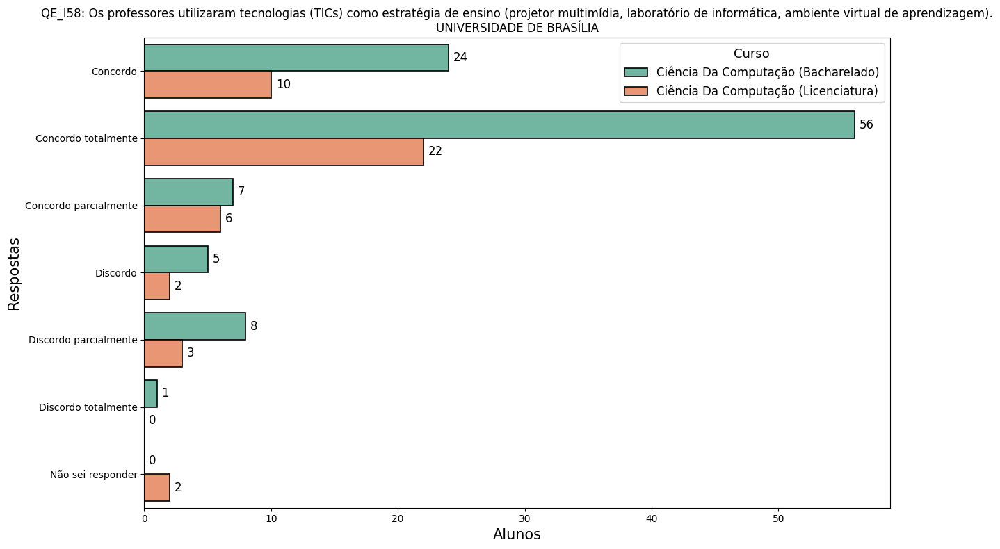

In [ ]:
qe_column = 'QE_I58'
titulo = f"{qe_column}: Os professores utilizaram tecnologias (TICs) como estratégia de ensino (projetor multimídia, laboratório de informática, ambiente virtual de aprendizagem)."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


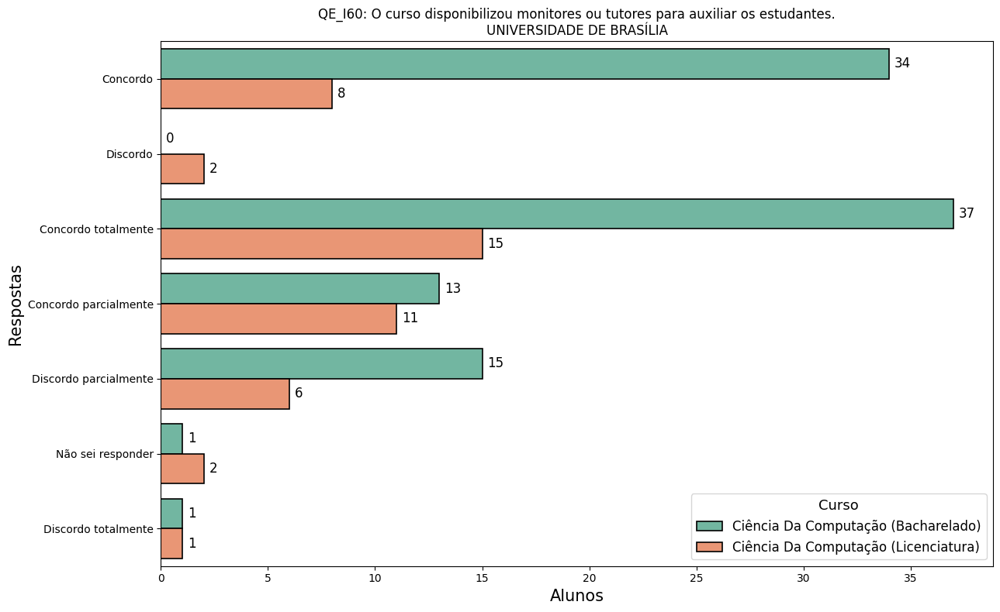

In [ ]:
qe_column = 'QE_I60'
titulo = f"{qe_column}: O curso disponibilizou monitores ou tutores para auxiliar os estudantes."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


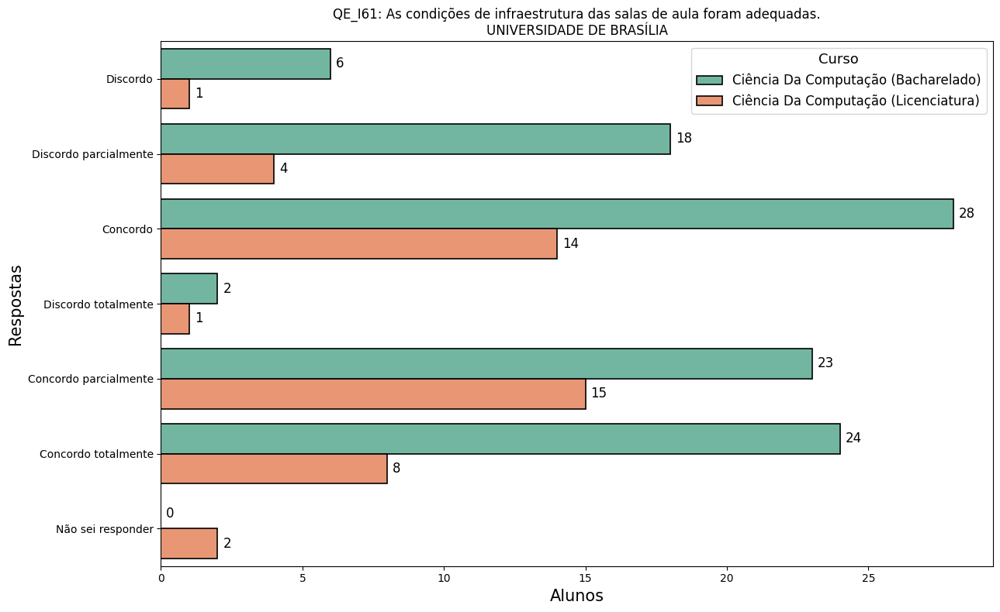

In [ ]:
qe_column = 'QE_I61'
titulo = f"{qe_column}: As condições de infraestrutura das salas de aula foram adequadas."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


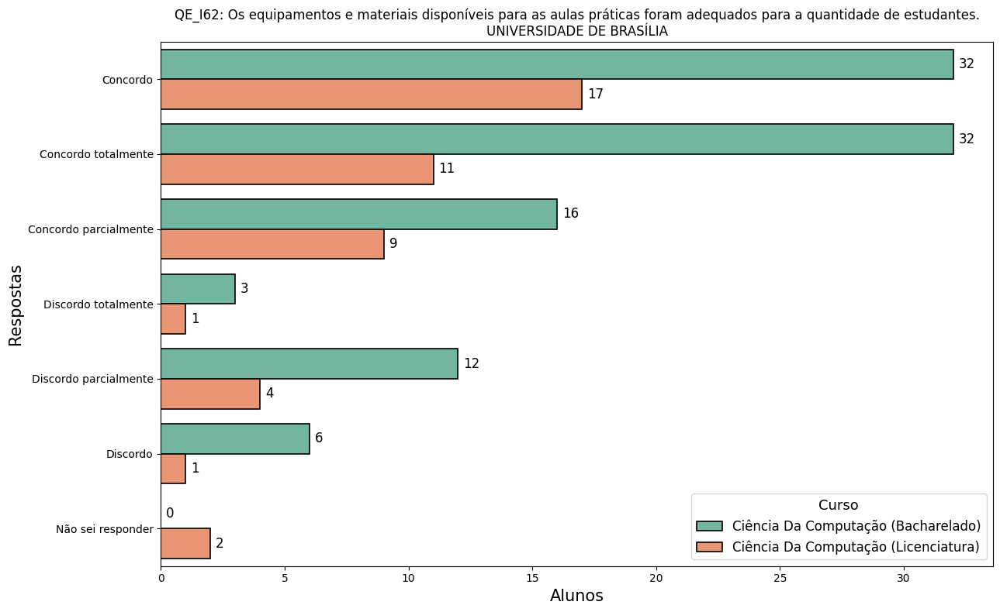

In [ ]:
qe_column = 'QE_I62'
titulo = f"{qe_column}: Os equipamentos e materiais disponíveis para as aulas práticas foram adequados para a quantidade de estudantes."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


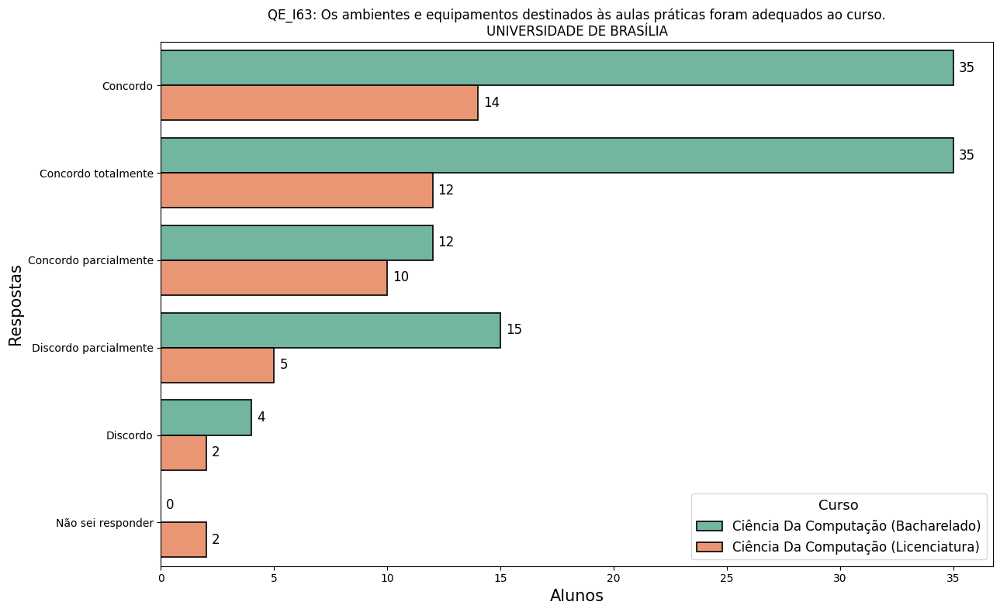

In [ ]:
qe_column = 'QE_I63'
titulo = f"{qe_column}: Os ambientes e equipamentos destinados às aulas práticas foram adequados ao curso."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


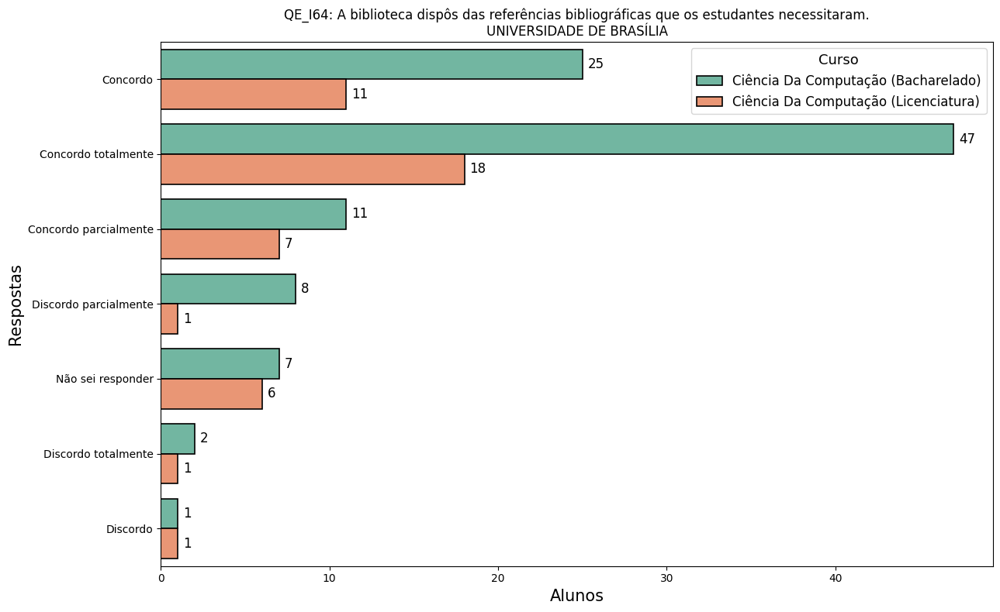

In [ ]:
qe_column = 'QE_I64'
titulo = f"{qe_column}: A biblioteca dispôs das referências bibliográficas que os estudantes necessitaram."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_dis, qe_column, titulo)


### Analisis Questoes Pandemia

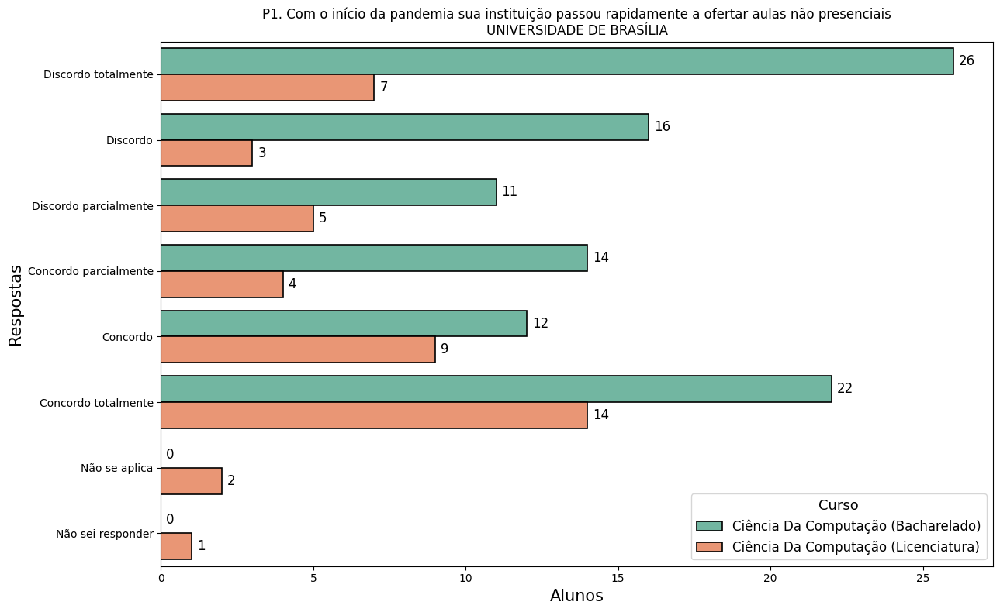

In [ ]:
dir_entrada_pandemia = 'microdados_tratados/form_microdados_arq43.csv'
qe_column = 'QE_I82'

titulo = f"P1. Com o início da pandemia sua instituição passou rapidamente a ofertar aulas não presenciais."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

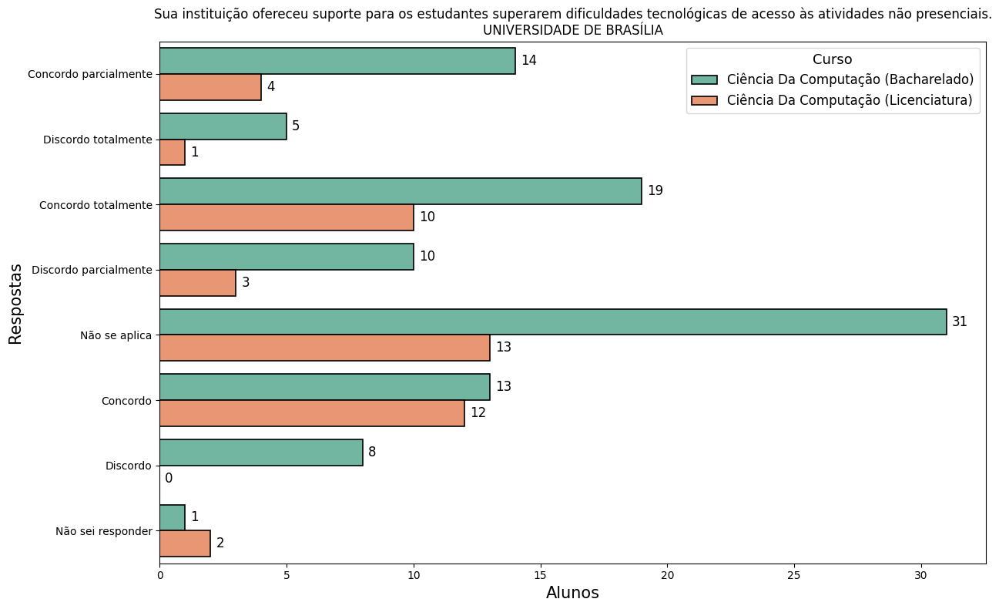

In [ ]:
qe_column = 'QE_I83'
titulo = "P2. Sua instituição ofereceu suporte para os estudantes superarem dificuldades tecnológicas de acesso às atividades não presenciais."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

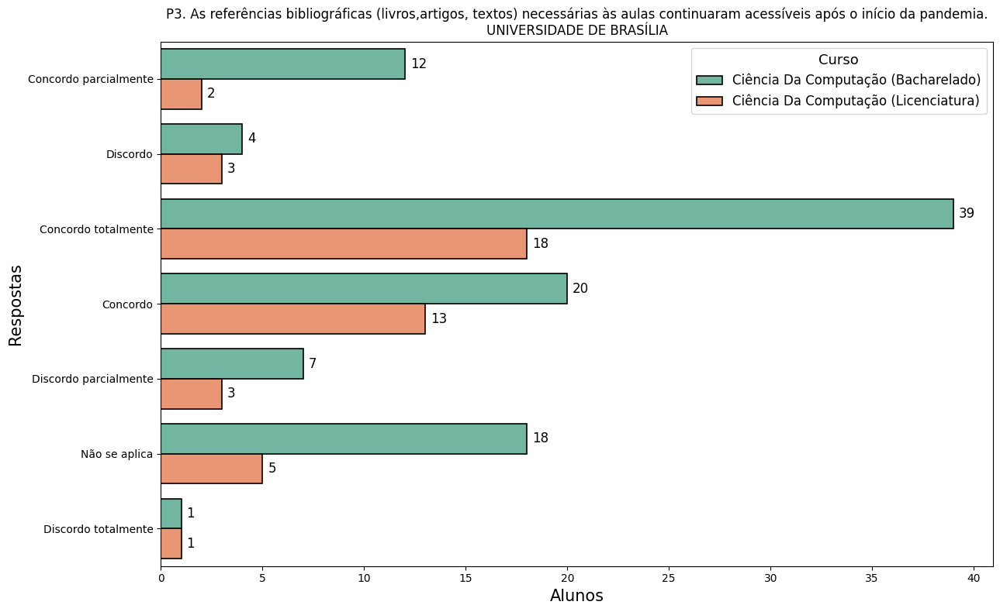

In [ ]:
qe_column = 'QE_I84'
titulo = "P3. As referências bibliográficas (livros,artigos, textos) necessárias às aulas continuaram acessíveis após o início da pandemia."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

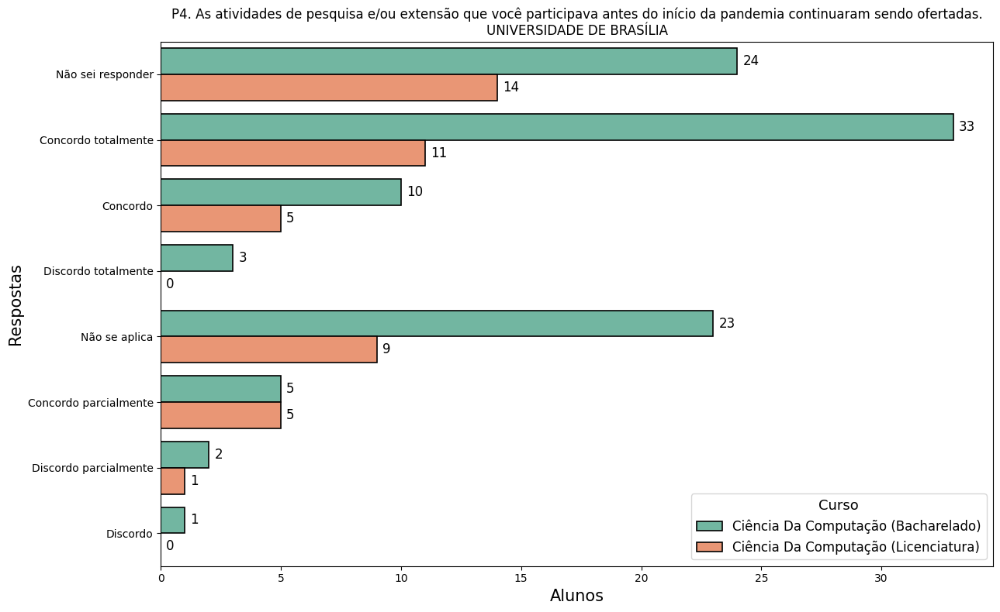

In [ ]:
qe_column = 'QE_I85'
titulo = "P4. As atividades de pesquisa e/ou extensão que você participava antes do início da pandemia continuaram sendo ofertadas."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

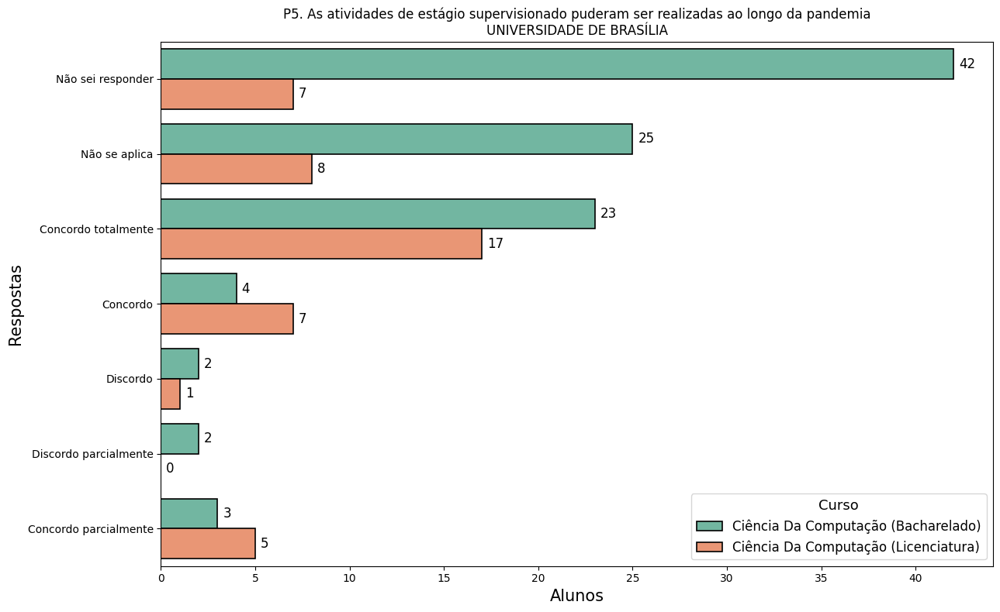

In [ ]:
qe_column = 'QE_I86'
titulo = "P5. As atividades de estágio supervisionado puderam ser realizadas ao longo da pandemia"

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

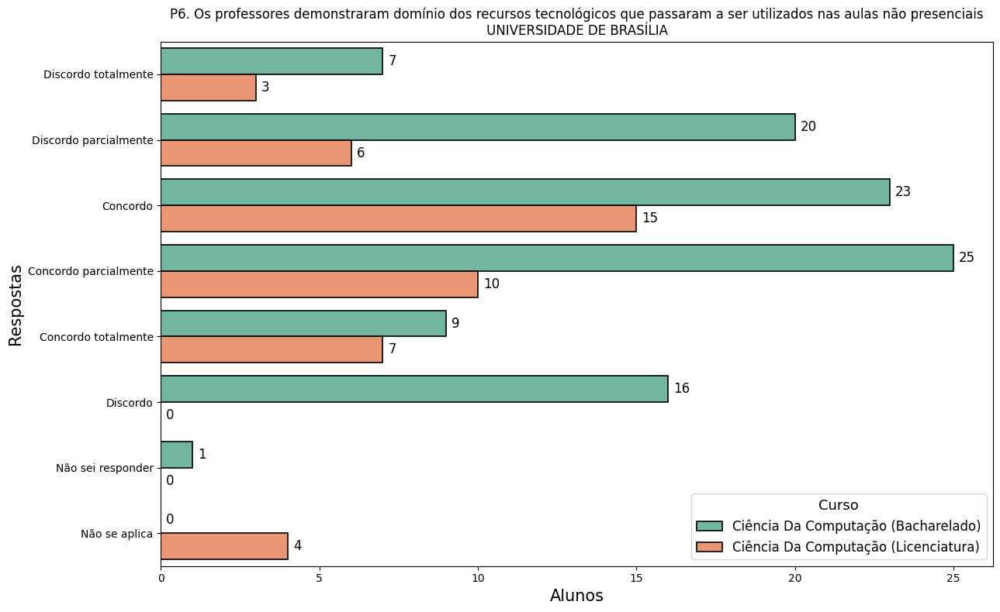

In [ ]:
qe_column = 'QE_I87'
titulo = "P6. Os professores demonstraram domínio dos recursos tecnológicos que passaram a ser utilizados nas aulas não presenciais"

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

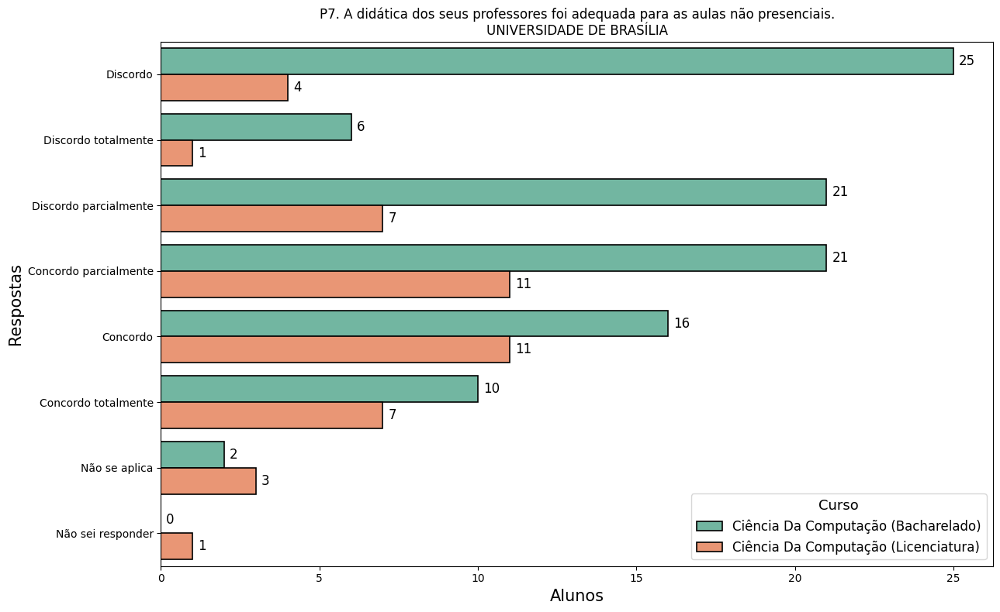

In [ ]:
qe_column = 'QE_I88'
titulo = "P7. A didática dos seus professores foi adequada para as aulas não presenciais."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

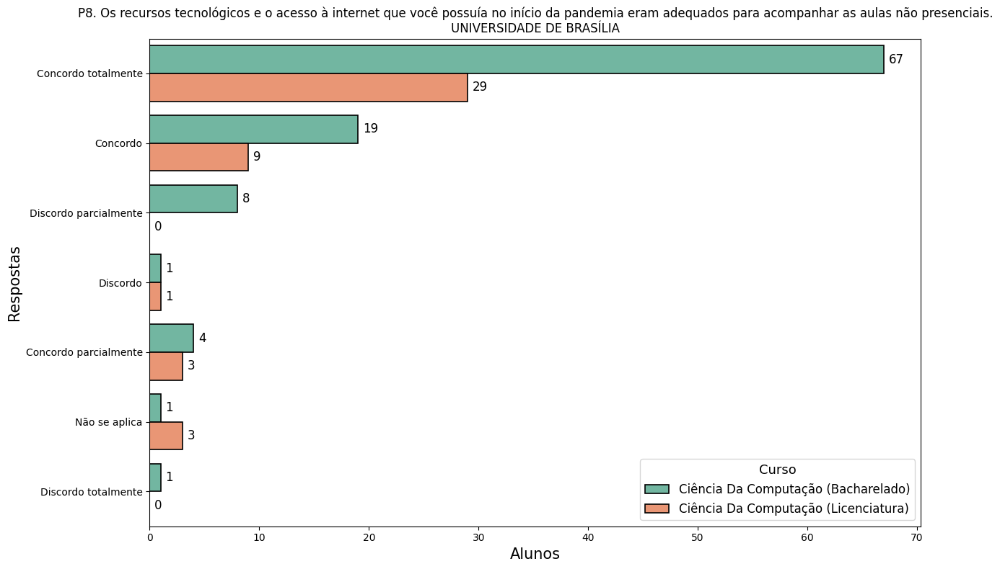

In [ ]:
qe_column = 'QE_I89'
titulo = "P8. Os recursos tecnológicos e o acesso à internet que você possuía no início da pandemia eram adequados para acompanhar as aulas não presenciais."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

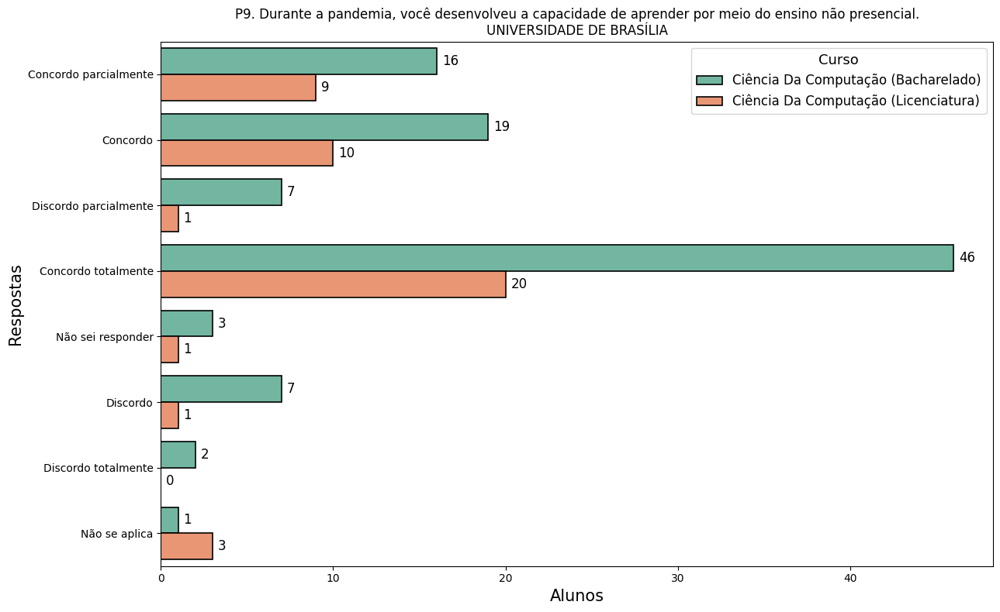

In [ ]:
qe_column = 'QE_I90'
titulo = "P9. Durante a pandemia, você desenvolveu a capacidade de aprender por meio do ensino não presencial."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

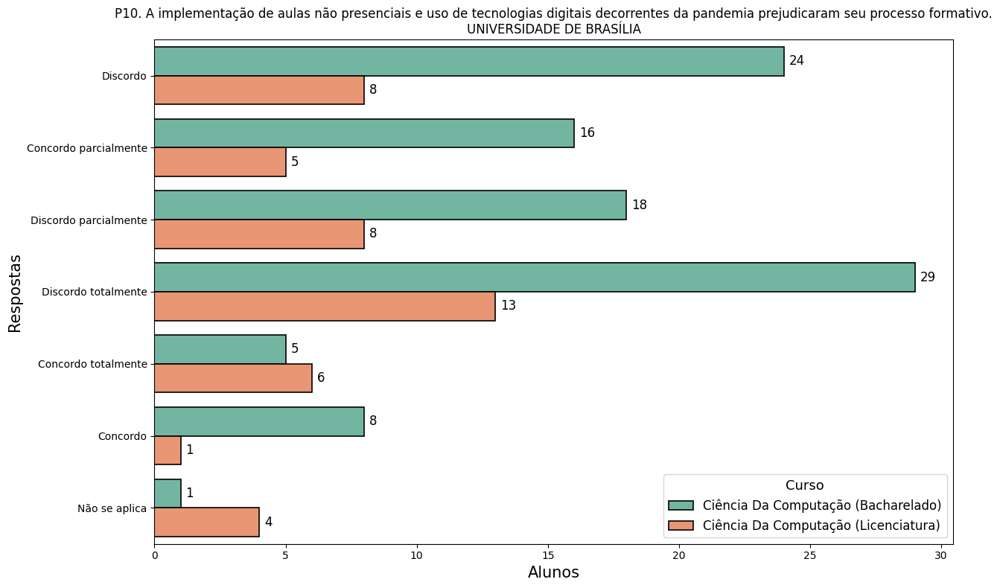

In [ ]:
qe_column = 'QE_I91'
titulo = "P10. A implementação de aulas não presenciais e uso de tecnologias digitais decorrentes da pandemia prejudicaram seu processo formativo."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)

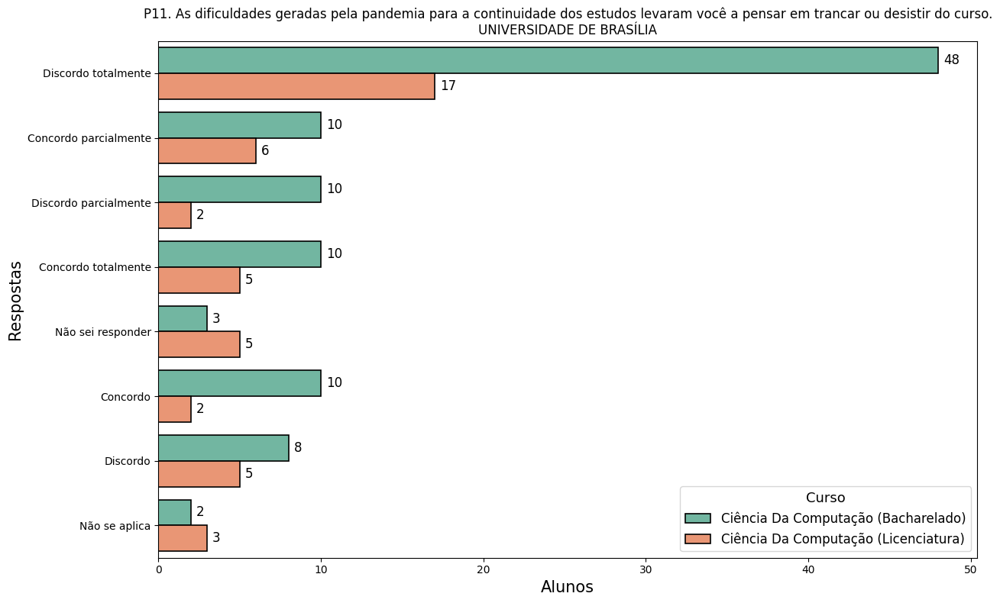

In [ ]:
qe_column = 'QE_I92'
titulo = "P11. As dificuldades geradas pela pandemia para a continuidade dos estudos levaram você a pensar em trancar ou desistir do curso."

grafico_microdados_barras_horizontal(faculdades_filtradas_CO_IES, cursos_analisados, dir_entrada_pandemia, qe_column, titulo)


## Analise Vetores


### N de estudantes de faculdades analisadas

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

def total_estudantes_faculdade(dir_entrada, cursos_analisados, faculdades_analisadas):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['NOME_CURSO', 'NOME_IES', 'CO_IES', 'NT_GER'])
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()  
    df_filtrado = df[df['NOME_CURSO'].isin(map(str.lower, cursos_analisados)) & df['CO_IES'].isin(faculdades_analisadas)]
    
    contagem_por_curso = {}
    for curso in cursos_analisados:
        df_curso = df_filtrado[df_filtrado['NOME_CURSO'] == curso.lower()]
        contagem_total = df_curso.groupby('NOME_IES').size().sort_values(ascending=False)
        contagem_validos = df_curso[df_curso['NT_GER'].notna() & (df_curso['NT_GER'] != '')].groupby('NOME_IES').size().sort_values(ascending=False)
        contagem_por_curso[curso] = (contagem_total, contagem_validos)
    return contagem_por_curso


def tabela_total_alunos_analisados(contagem_por_curso,faculdade_destacada):
    for curso, (contagem_total, contagem_validos) in contagem_por_curso.items():
        fig, ax = plt.subplots(figsize=(8, 0.3*len(contagem_total) + 0.5))  
        ax.axis('off')  

        #----------titulo----------------------------------------------------------------------
        plt.suptitle(curso.title(), fontsize=12, fontweight='bold') 

        
        cell_text = []
        for nome_ies in contagem_total.index:
            num_total = contagem_total[nome_ies]
            num_validos = contagem_validos.get(nome_ies, 0)
            cell_text.append([nome_ies, num_total, num_validos])

        cell_colors = [['#9FFD9F' if nome_ies == faculdade_destacada else 'white' for _ in range(3)] for nome_ies, _, _ in cell_text]

        tabela = ax.table(
            cellText=cell_text,
            cellColours=cell_colors,
            colLabels=['Nome da Instituição', 'Número total de alunos\ninscritos', 'Número de alunos\nque realizaram a prova'],
            loc='center',
            cellLoc='left',
            colLoc='center'
        )
        
        for key, cell in tabela.get_celld().items():
            if key[0] == 0:
                cell.set_text_props(fontproperties=FontProperties(weight='bold'))
            if key[1] in [1, 2]:
                cell.set_text_props(ha='center')

        tabela.auto_set_column_width(col=list(range(len(cell_text[0]))))
        tabela.auto_set_font_size(False)
        tabela.set_fontsize(8)
        tabela.scale(1, 1.5)        

        plt.savefig(f"{vetores}/tabela_estudantes_{curso.replace(' ', '_')}_t", bbox_inches='tight', dpi=300)
        plt.show()
        plt.close()


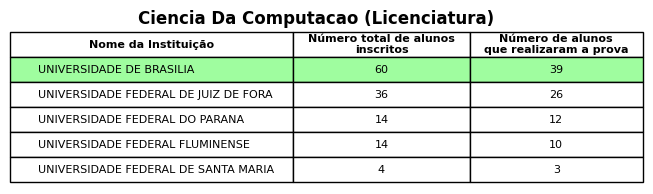

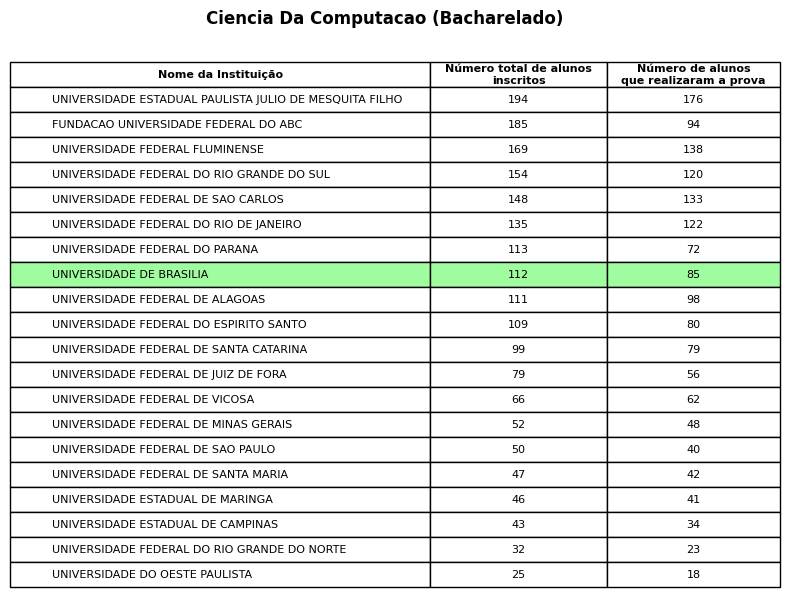

In [ ]:
faculdades_analisadas_CO_IES = [575, 570, 8, 576, 581, 571, 577, 573, 585, 4925, 54, 591, 7, 56, 572, 586, 582, 271, 2,57]
cursos_analisados = ['ciencia da computacao (licenciatUra)', 'ciencia da computacao (Bacharelado)' ]

faculdade_destacada= 'UNIVERSIDADE DE BRASILIA'

dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'

contagem_estudantes = total_estudantes_faculdade(dir_entrada, cursos_analisados, faculdades_analisadas_CO_IES)
tabela_total_alunos_analisados(contagem_estudantes,faculdade_destacada)

### Funcao de Porcentual de acertos - Gerar a tabela



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

def percentual_acertos_por_faculdade(dir_entrada, cursos_analisados, faculdades_analisadas, colunas_questoes):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_IES', 'NOME_CURSO'] + colunas_questoes)
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()  
    df_filtrado = df[
        df['NOME_CURSO'].isin(map(str.lower, cursos_analisados)) & 
        df['CO_IES'].isin(faculdades_analisadas)
    ]
    
    mapeamento_ies_nome = df_filtrado.drop_duplicates(subset=['CO_IES', 'NOME_IES']).set_index('CO_IES')['NOME_IES']
    
    percentuais_por_faculdade = df_filtrado.groupby('CO_IES')[colunas_questoes].mean() * 100
    return percentuais_por_faculdade, mapeamento_ies_nome


def analisar_desempenho_faculdades(percentuais, mapeamento_ies_nome):

    melhor_desempenho = percentuais.idxmax()
    pior_desempenho = percentuais.idxmin()

    melhores_nomes = melhor_desempenho.map(mapeamento_ies_nome)
    piores_nomes = pior_desempenho.map(mapeamento_ies_nome)

    dados_analise = []
    for questao in colunas_questoes:
        dados_analise.append([questao, melhores_nomes[questao], piores_nomes[questao]])

    return dados_analise

def tabela_desempenho_fac(dados_analise, curso_analisado, dir_destino, faculdade_destacada):
    fig, ax = plt.subplots(figsize=(10, 0.3 * len(dados_analise)))
    ax.axis('off')
    plt.suptitle(curso_analisado.title(), fontsize=12, fontweight='bold', y=1.05)

    tabela_analise = ax.table(
        cellText=dados_analise,
        colLabels=['Questão', 'Melhor Desempenho', 'Pior Desempenho'],
        loc='center',
        cellLoc='center',
        colLoc='center'
    )

    tabela_analise.auto_set_column_width(col=list(range(len(dados_analise[0]))))

    for (row, col), cell in tabela_analise.get_celld().items():
        if row == 0:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))
        else:
            if dados_analise[row - 1][1] == dados_analise[row - 1][2]:
                for coluna in range(1, 3):
                    tabela_analise[row, coluna].get_text().set_text('QUESTÃO ANULADA')
                for coluna in range(3):
                    tabela_analise[row, coluna].set_facecolor('#FFA4A4')
            elif cell.get_text().get_text() == faculdade_destacada:
                cell.set_facecolor('#A4FFA4')

    tabela_analise.auto_set_font_size(False)
    tabela_analise.set_fontsize(8)
    tabela_analise.scale(1, 1.5)

    plt.savefig(dir_destino, bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()


    
    
def tabela_percentuais_qe(percentuais, mapeamento_ies_nome, curso_analisado, dir_destino):
    fig, ax = plt.subplots(figsize=(12, 0.3 * len(mapeamento_ies_nome) + 0.5))  
    ax.axis('off')  

    #titulo da tabela----------------------------------
    plt.suptitle(curso_analisado.title(), fontsize=12, fontweight='bold', y=1)


    cell_text = []
    for faculdade in mapeamento_ies_nome.index:
        nome_ies = mapeamento_ies_nome.get(faculdade, 'Desconhecido')
        percentuais_faculdade = [f"{percentuais.loc[faculdade, questao]:.2f}%" if faculdade in percentuais.index else "" for questao in colunas_questoes]
        cell_text.append([nome_ies] + percentuais_faculdade)
    
    tabela = ax.table(
        cellText=cell_text,
        colLabels=['Nome da Instituição'] + colunas_questoes,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    for i, nome_ies in enumerate(mapeamento_ies_nome.values):
        if nome_ies == faculdade_destacada:
            for j in range(len(colunas_questoes) + 1): 
                tabela[i+1, j].set_facecolor("#A4FFA4") 
    
    for key, cell in tabela.get_celld().items():
        if key[0] == 0:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))

    tabela.auto_set_column_width(col=list(range(len(cell_text[0]))))    
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)
    
    # Salva a figura
    plt.savefig(dir_destino, bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()
    


#### Faculdades escolhidas


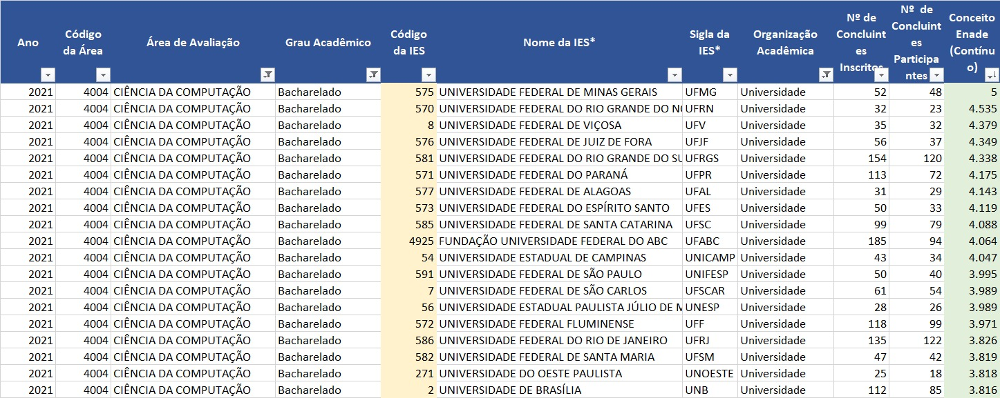

### Funcoes alternativas FG e CE

#### Funcao FG

In [51]:
import pandas as pd
import matplotlib.pyplot as plt

def tabela_opcoes_marcadas_FG(cursos_analisados, dir_entrada, colunas_questoes, faculdades_analisadas_CO_IES,final_arquivo):
    
    def gerar_tabelas_contagem(dados, colunas_questoes, curso, faculdades):
        
        dados_curso = dados[
            (dados['NOME_CURSO'].str.lower() == curso.lower()) & 
            (dados['CO_IES'].isin(faculdades))
        ]

        ies_map = dados.set_index('CO_IES')['NOME_IES'].to_dict()

        
        contagem = {}
        for coluna in colunas_questoes:
            counts = dados_curso[coluna].value_counts(dropna=False).reindex(['A', 'B', 'C', 'D', 'E', '.','*'], fill_value=0)
            contagem[coluna] = counts.astype(int)

        contagem_df = pd.DataFrame(contagem).reset_index()
        contagem_df = contagem_df.rename(columns={'index': 'Opções marcadas'})

        contagem_df['Opções marcadas'] = contagem_df['Opções marcadas'].map({
            '*': 'Várias',
            '.': 'Opção\nem branco',
            'A': 'Opção A',
            'B': 'Opção B',
            'C': 'Opção C',
            'D': 'Opção D',
            'E': 'Opção E'
        })

        gabarito = dados_curso.iloc[0]['DS_VT_GAB_OFG_FIN']  
        gabarito_dict = {'Opções marcadas': 'Gabarito'}
        for i, letra in enumerate(gabarito, start=1):
            gabarito_dict[f"forma_geral_alternativa_q_{i}"] = letra
        
        gabarito_df = pd.DataFrame([gabarito_dict], columns=contagem_df.columns)
        contagem_df = pd.concat([contagem_df, gabarito_df], ignore_index=True)
        
        return contagem_df, ies_map

    try:
        dados = pd.read_csv(dir_entrada, delimiter=';')
        tabelas_contagem = {}
        
        for curso in cursos_analisados:
            tabelas_contagem[curso], ies_map = gerar_tabelas_contagem(dados, colunas_questoes, curso, faculdades_analisadas_CO_IES)
            tabelas_contagem[curso] = tabelas_contagem[curso].set_index('Opções marcadas').T
            tabelas_contagem[curso].reset_index(inplace=True)
            tabelas_contagem[curso].rename(columns={'index': 'Questões'}, inplace=True)

    
        for curso, df in tabelas_contagem.items():
            
            fig, ax = plt.subplots(figsize=(8, 0.3 * len(df) + 0.5))
            ax.axis('off')


            tabela = ax.table(
                cellText=df.values,
                colLabels=df.columns,
                loc='center',
                cellLoc='center'
            )

            nome_faculdade = ies_map.get(faculdades_analisadas_CO_IES[0], 'Faculdade Desconhecida')

            #-----------titulo-------------
            #ax.set_title(f"Tabela de alternativas CE - {curso}\n{nome_faculdade}", fontsize=14, weight='bold')

            
            tabela.auto_set_column_width(col=list(range(len(df.columns))))  
            tabela.auto_set_font_size(False)
            tabela.set_fontsize(12)
            tabela.scale(1, 2.5)

            
            gabarito_col_index = df.columns.get_loc('Gabarito')  

            for row_index in range(len(df)+1):
                tabela._cells[(row_index, gabarito_col_index)].set_facecolor('#A4FFA4')
                tabela._cells[(row_index, gabarito_col_index)].set_edgecolor('black')

            plt.savefig(f"{vetores}/tabela_FG_alternativa_{curso}_{final_arquivo}", bbox_inches='tight', dpi=300)
            plt.show()
            plt.close()

    except FileNotFoundError:
        print("Arquivo não encontrado. Verifique o caminho do arquivo e tente novamente.")




#### Funcao CE

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def tabela_opcoes_marcadas_CE(cursos_analisados, dir_entrada, colunas_questoes, faculdades_analisadas_CO_IES,final_arquivo):
    
    def gerar_tabelas_contagem(dados, colunas_questoes, curso, faculdades):
        dados_curso = dados[
            (dados['NOME_CURSO'].str.lower() == curso.lower()) & 
            (dados['CO_IES'].isin(faculdades))
        ]

        ies_map = dados.set_index('CO_IES')['NOME_IES'].to_dict()

        contagem = {}
        for coluna in colunas_questoes:
            counts = dados_curso[coluna].value_counts(dropna=False).reindex(['A', 'B', 'C', 'D', 'E', '.','*'], fill_value=0)
            contagem[coluna] = counts.astype(int)

        contagem_df = pd.DataFrame(contagem).reset_index()
        contagem_df = contagem_df.rename(columns={'index': 'Opções marcadas'})

        contagem_df['Opções marcadas'] = contagem_df['Opções marcadas'].map({
            '*': 'Várias',
            '.': 'Opção\nem branco',
            'A': 'Opção A',
            'B': 'Opção B',
            'C': 'Opção C',
            'D': 'Opção D',
            'E': 'Opção E'
        })

        
        gabarito = dados_curso.iloc[0]['DS_VT_GAB_OCE_FIN']  
        gabarito_dict = {'Opções marcadas': 'Gabarito'}
        for i, letra in enumerate(gabarito, start=1):
            gabarito_dict[f"forma_espec_alternativa_q_{i}"] = letra
        
        gabarito_df = pd.DataFrame([gabarito_dict], columns=contagem_df.columns)
        contagem_df = pd.concat([contagem_df, gabarito_df], ignore_index=True)
        
        return contagem_df, ies_map


    try:
        dados = pd.read_csv(dir_entrada, delimiter=';')
        tabelas_contagem = {}
        
        for curso in cursos_analisados:
            tabelas_contagem[curso], ies_map = gerar_tabelas_contagem(dados, colunas_questoes, curso, faculdades_analisadas_CO_IES)
            tabelas_contagem[curso] = tabelas_contagem[curso].set_index('Opções marcadas').T
            tabelas_contagem[curso].reset_index(inplace=True)
            tabelas_contagem[curso].rename(columns={'index': 'Questões'}, inplace=True)

    
        for curso, df in tabelas_contagem.items():
            
            fig, ax = plt.subplots(figsize=(8, 0.3 * len(df) + 0.5))
            ax.axis('off')

            tabela = ax.table(
                cellText=df.values,
                colLabels=df.columns,
                loc='center',
                cellLoc='center'
            )

            nome_faculdade = ies_map.get(faculdades_analisadas_CO_IES[0], 'Faculdade Desconhecida')
            #-----------titulo-------------
            #ax.set_title(f"Tabela de alternativas CE - {curso}\n{nome_faculdade}", fontsize=14, weight='bold')

            tabela.auto_set_column_width(col=list(range(len(df.columns)))) 
            tabela.auto_set_font_size(False)
            tabela.set_fontsize(12)
            tabela.scale(1, 2.5)

            gabarito_col_index = df.columns.get_loc('Gabarito')  

            for row_index in range(len(df)+1):
                tabela._cells[(row_index, gabarito_col_index)].set_facecolor('#A4FFA4')
                tabela._cells[(row_index, gabarito_col_index)].set_edgecolor('black')

            plt.savefig(f"{vetores}/tabela_CE_alternativa_{curso}_{final_arquivo}", bbox_inches='tight', dpi=300)
            plt.show()
            plt.close()

    except FileNotFoundError:
        print("Arquivo não encontrado. Verifique o caminho do arquivo e tente novamente.")

### Entrada tabela alternativas FG eCE

In [4]:
import unidecode

#Cursos a ser analisados
cursos_analisados = [ "Ciência Da Computação (Bacharelado)",'ciencia da computacao (licenciatura)']
#cursos_analisados = [ 'ciencia da computacao (licenciatura)']
dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'
faculdades_analisadas_CO_IES = [2]

#funcao para padronizar
def padronizar(lista):
    return [unidecode.unidecode(elemento).lower() for elemento in lista]
cursos_analisados=padronizar(cursos_analisados)
print(cursos_analisados)

['ciencia da computacao (bacharelado)', 'ciencia da computacao (licenciatura)']


C:\Users\DANIEL\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:4: DtypeWarning: Columns (7,9,10,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82) have mixed types.Specify dtype option on import or set low_memory=False.
  after removing the cwd from sys.path.
C:\Users\DANIEL\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


TypeError: '>' not supported between instances of 'int' and 'str'

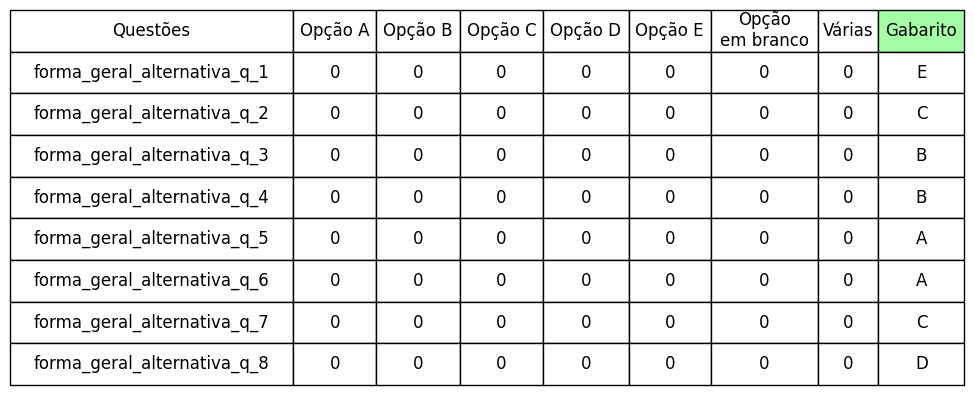

In [14]:
colunas_questoes = [f"forma_geral_alternativa_q_{i}" for i in range(1, 9)]

final_arquivo="TOTAL"
tabela_opcoes_marcadas_FG(cursos_analisados, dir_entrada, colunas_questoes, faculdades_analisadas_CO_IES,final_arquivo)


C:\Users\DANIEL\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:3: DtypeWarning: Columns (7,9,10,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82) have mixed types.Specify dtype option on import or set low_memory=False.
  This is separate from the ipykernel package so we can avoid doing imports until


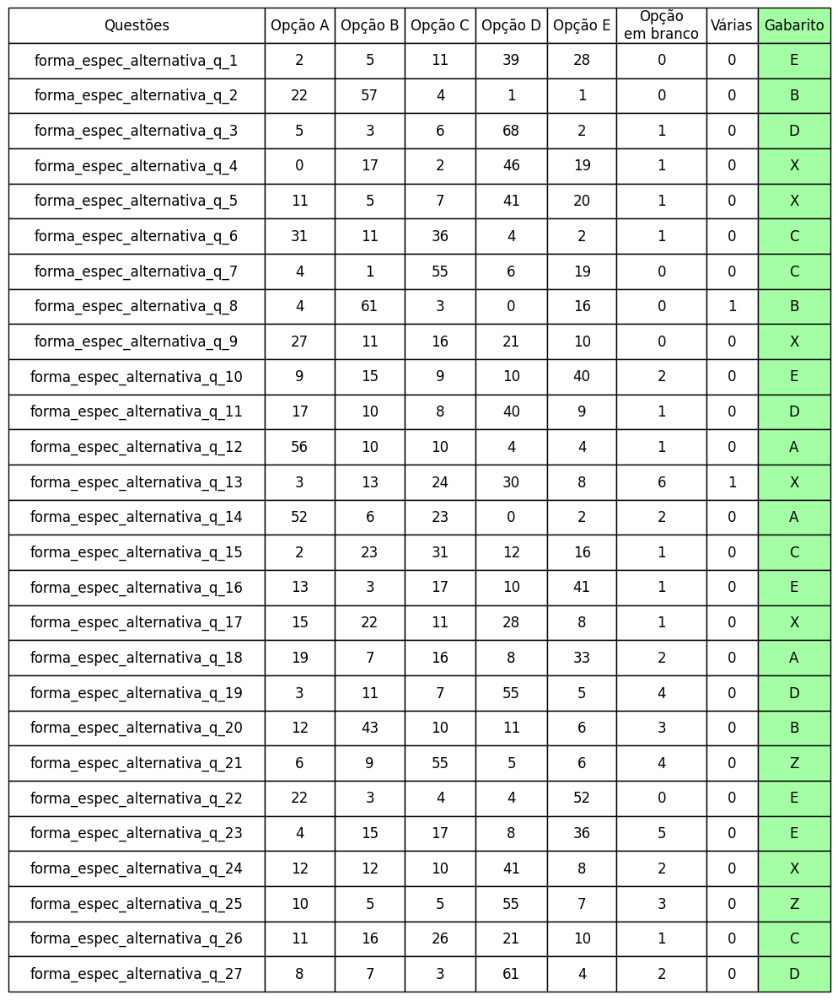

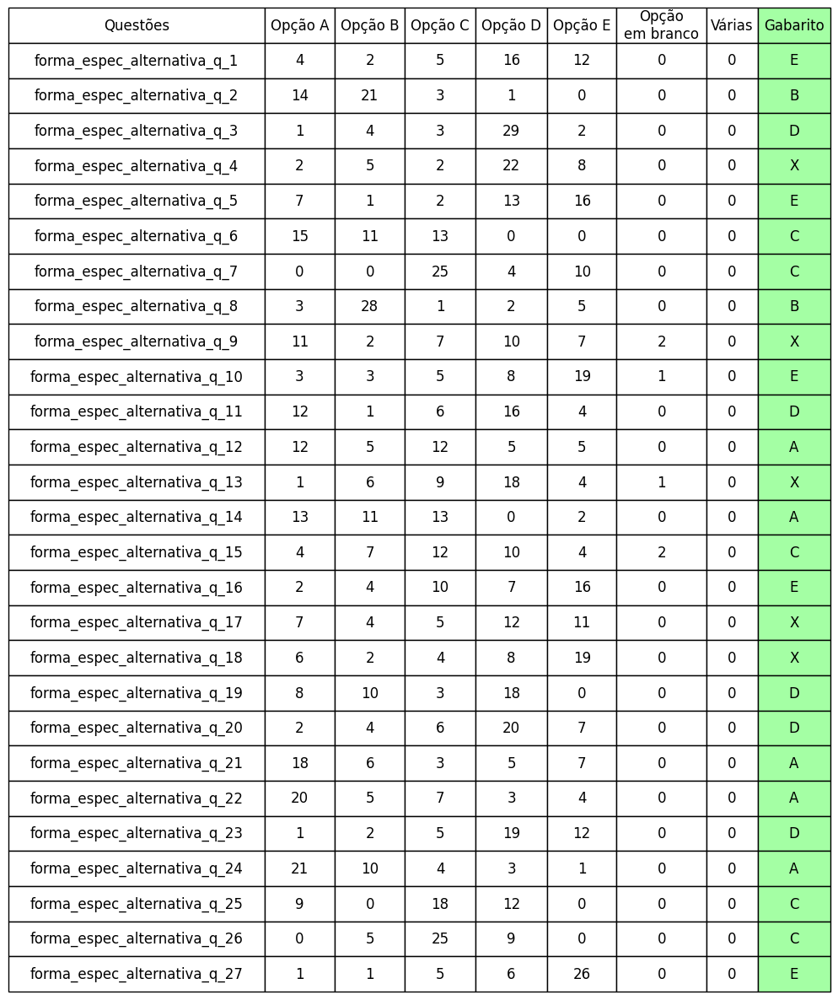

In [ ]:
colunas_questoes = [f"forma_espec_alternativa_q_{i}" for i in range(1, 28)]
final_arquivo="TOTAL"
tabela_opcoes_marcadas_CE(cursos_analisados, dir_entrada, colunas_questoes, faculdades_analisadas_CO_IES,final_arquivo)

### Entrada desempenho FG e CE

In [ ]:
import unidecode

#Cursos a ser analisados
cursos_analisados = [ "Ciência Da Computação (Bacharelado)",'ciencia da computacao (licenciatura)']

#Faculdades pelo CO_IES as 20 melhores
faculdades_analisadas_CO_IES = [575, 570, 8, 576, 581, 571, 577, 573, 585, 4925, 54, 591, 7, 56, 572, 586, 582, 271, 2,57]

#Faculdade que vai ser destacada na tabela com a cor verde '#A4FFA4'
faculdade_destacada= 'UNIVERSIDADE DE BRASILIA'

#Arquivo de entrada
dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'


#funcao para padronizar
def padronizar(lista):
    return [unidecode.unidecode(elemento).lower() for elemento in lista]
cursos_analisados=padronizar(cursos_analisados)
print(cursos_analisados)

['ciencia da computacao (bacharelado)', 'ciencia da computacao (licenciatura)']


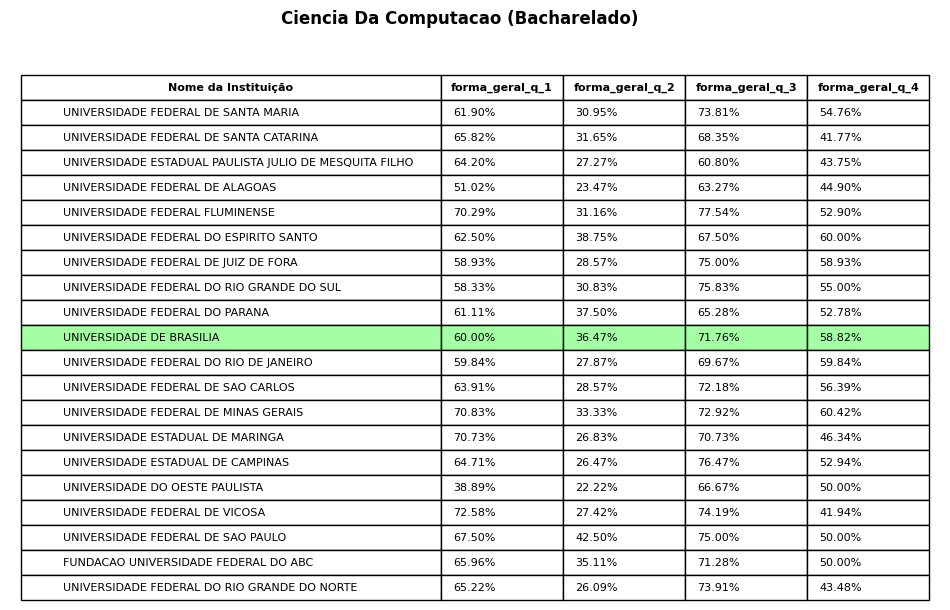

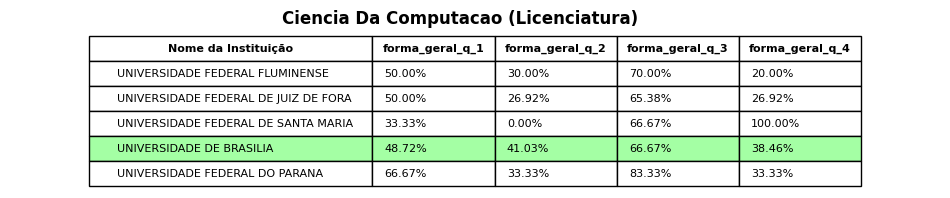

In [ ]:
colunas_questoes = [
    "forma_geral_q_1", "forma_geral_q_2", "forma_geral_q_3", "forma_geral_q_4"
]


for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_FG1_t.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)



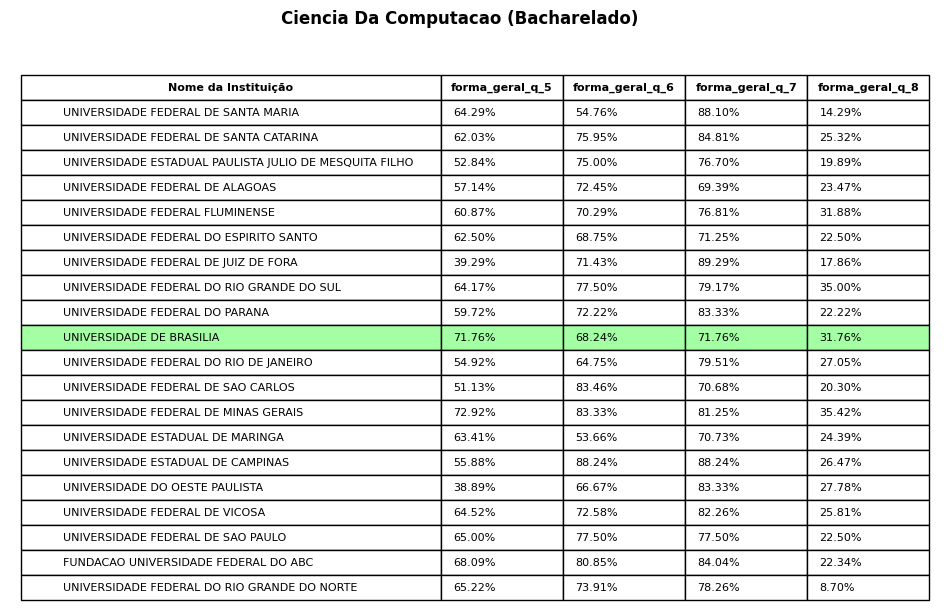

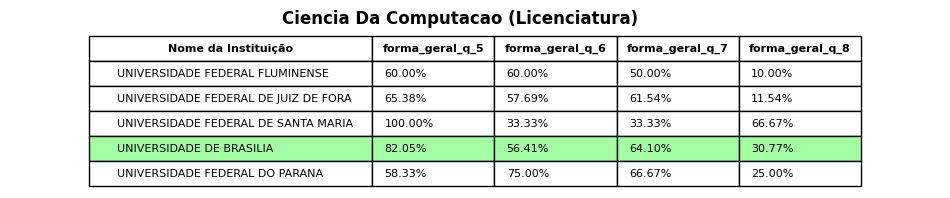

In [ ]:

colunas_questoes = [
     "forma_geral_q_5","forma_geral_q_6","forma_geral_q_7","forma_geral_q_8"
]

for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_FG2_t'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)


### Total analise vetor FG

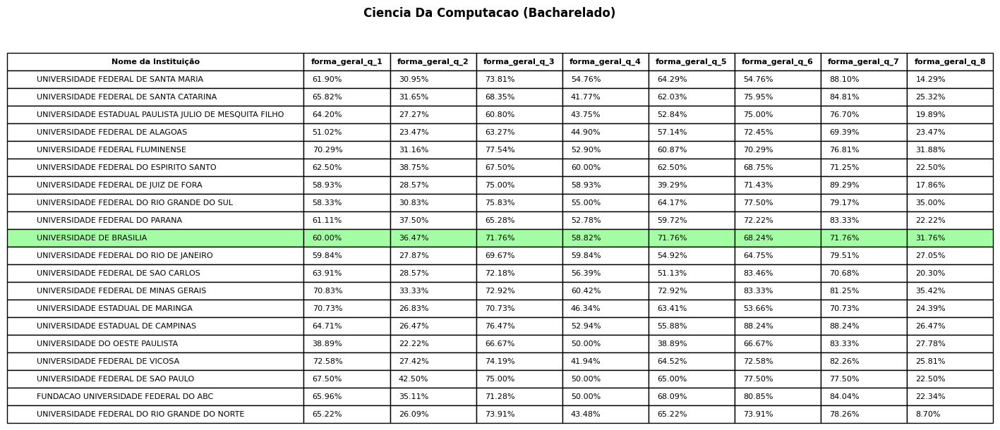

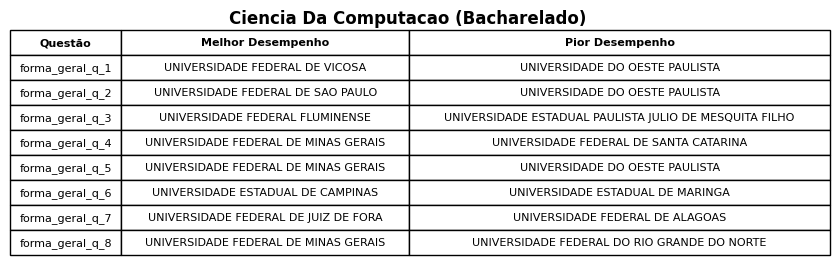

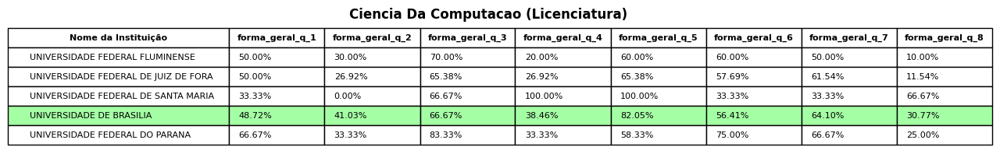

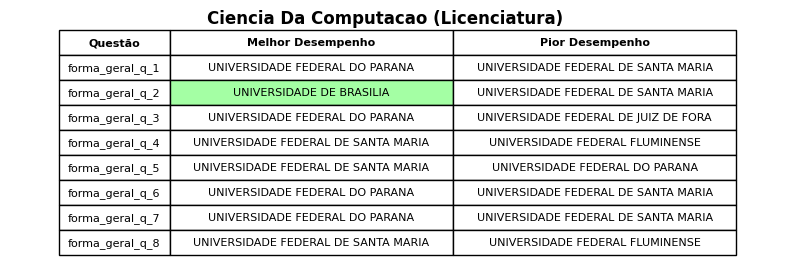

In [ ]:
# Definição das colunas de questões
colunas_questoes = [
    "forma_geral_q_1", "forma_geral_q_2", "forma_geral_q_3", "forma_geral_q_4",
    "forma_geral_q_5", "forma_geral_q_6", "forma_geral_q_7", "forma_geral_q_8"
]

for curso_analisado in cursos_analisados:
    # Gerar a tabela de percentual de acertos para o curso
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_Total_FG.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(
        dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes
    )
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)

    # Realizar e plotar a análise de desempenho para o curso
    dados_analise = analisar_desempenho_faculdades(percentuais_acertos, mapeamento_ies_curso)
    dir_destino_desempenho = f'{vetores}/tabela_desempenho_{curso_analisado.replace(" ", "_")}_Total_FG_t'
    tabela_desempenho_fac(dados_analise, curso_analisado, dir_destino_desempenho,faculdade_destacada)


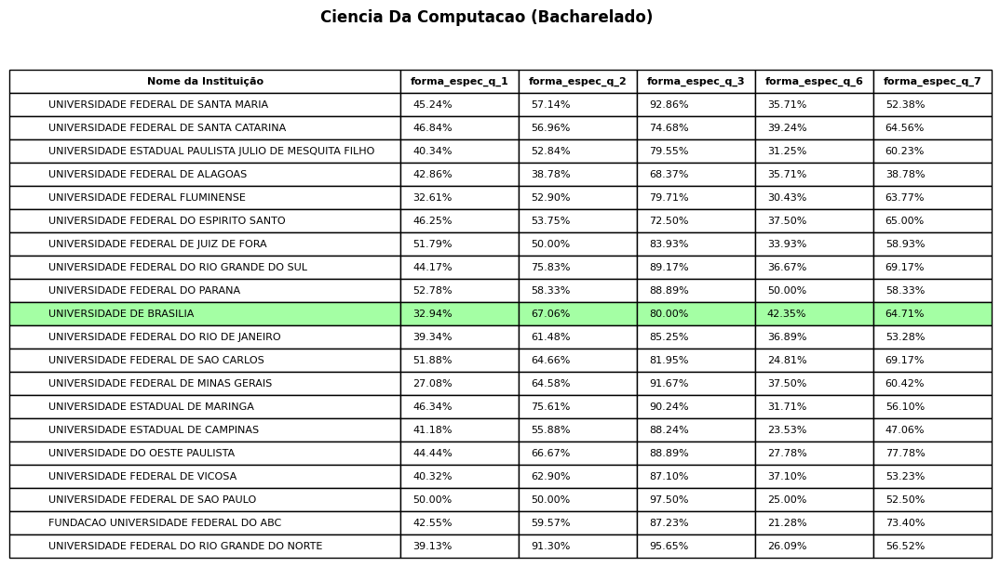

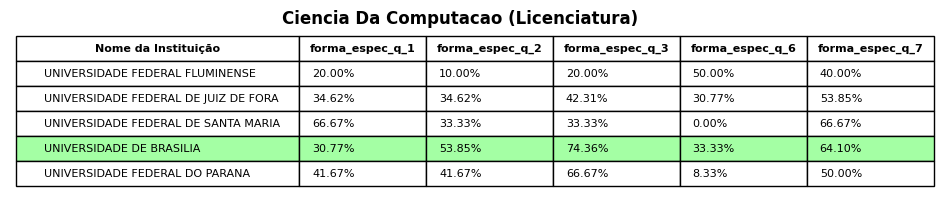

In [ ]:

colunas_questoes = [
    "forma_espec_q_1", "forma_espec_q_2", "forma_espec_q_3","forma_espec_q_6", "forma_espec_q_7"
]

for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_CE1_t'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)


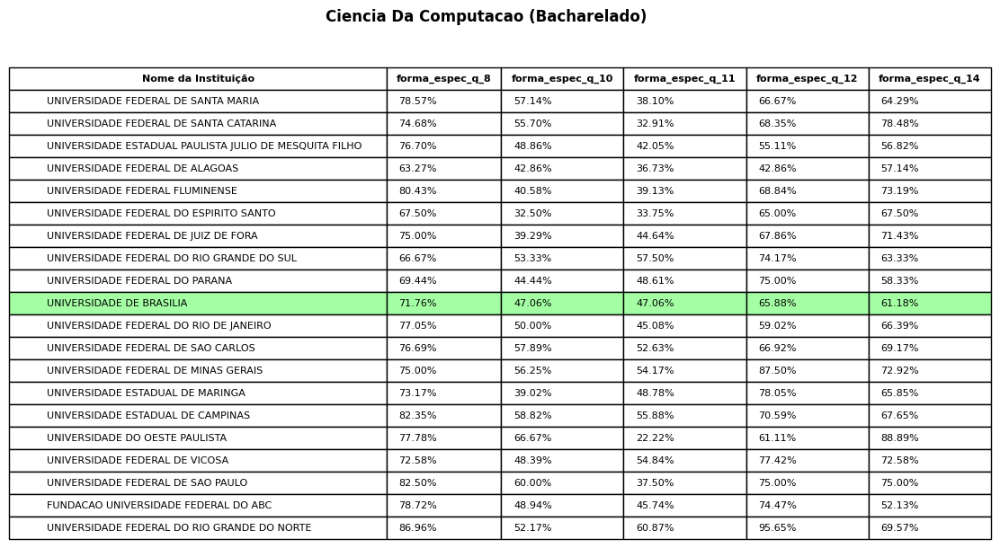

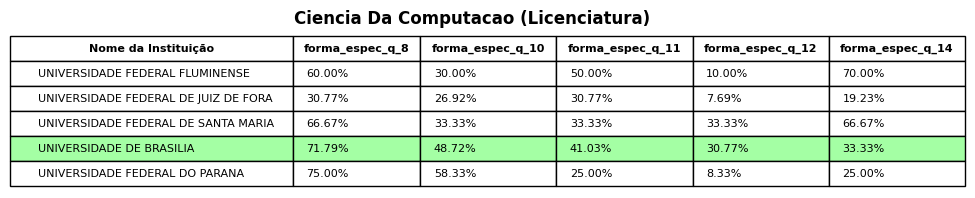

In [ ]:
colunas_questoes = [
     "forma_espec_q_8", "forma_espec_q_10","forma_espec_q_11", "forma_espec_q_12","forma_espec_q_14"
]
 
for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_CE2.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)

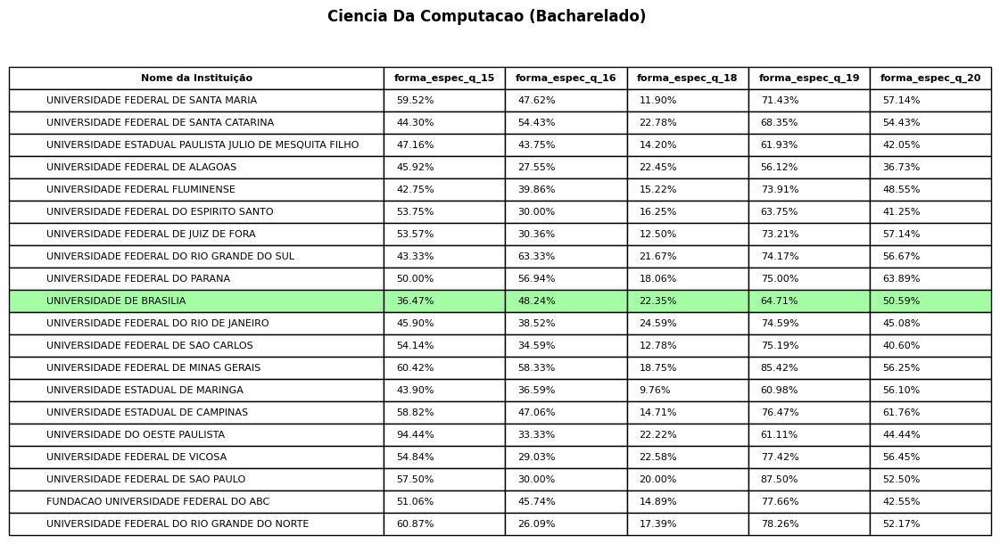

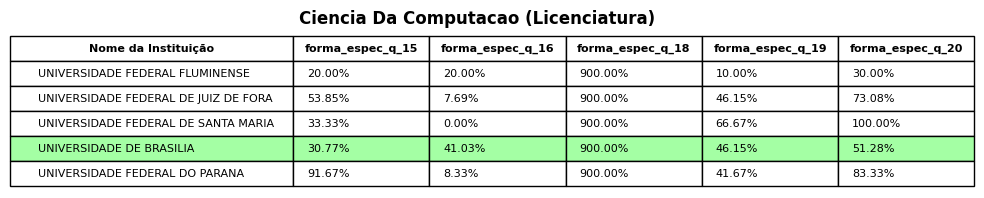

In [ ]:
colunas_questoes = [
    "forma_espec_q_15","forma_espec_q_16", "forma_espec_q_18","forma_espec_q_19","forma_espec_q_20"
]

for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_CE3.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)

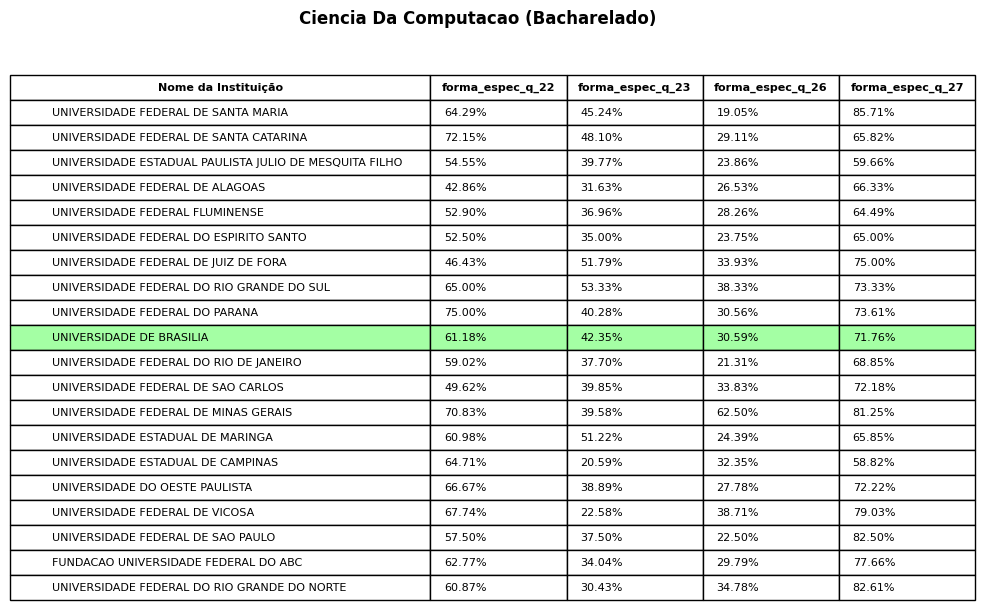

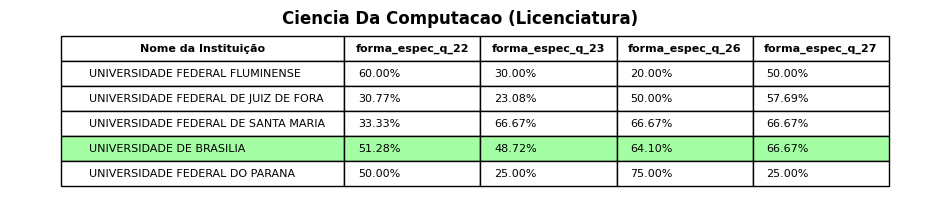

In [ ]:
colunas_questoes = [
    "forma_espec_q_22", "forma_espec_q_23","forma_espec_q_26", "forma_espec_q_27"
]

for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_CE4.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)

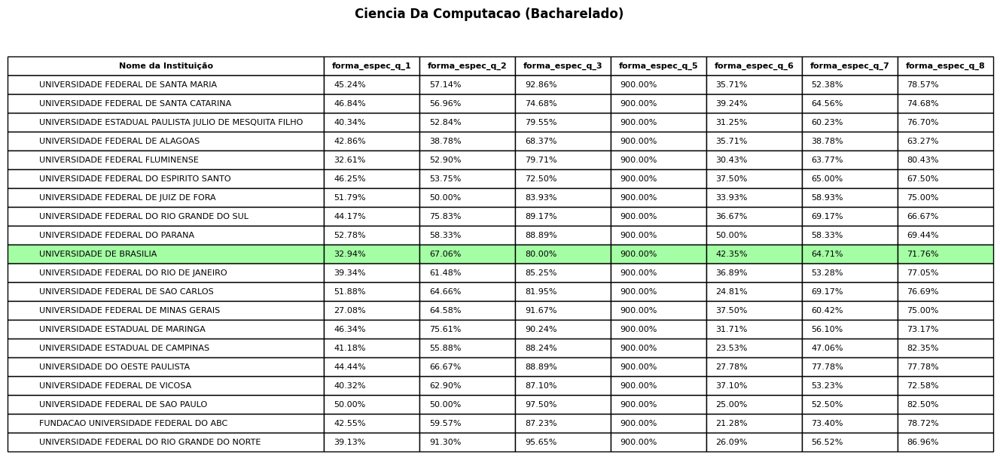

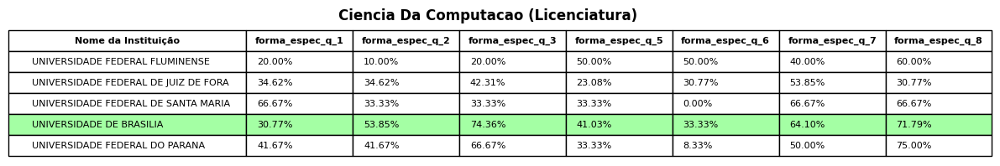

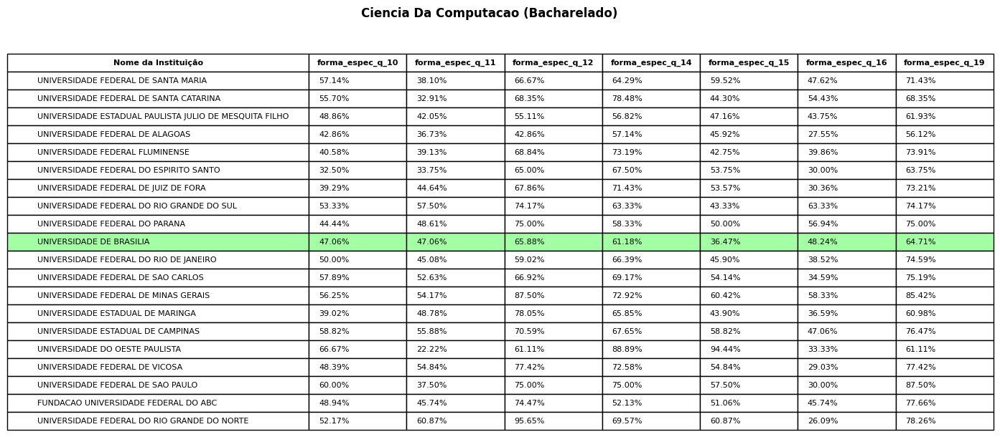

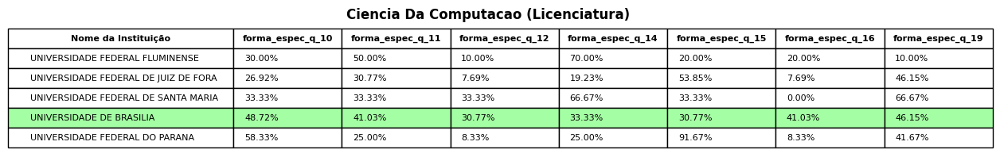

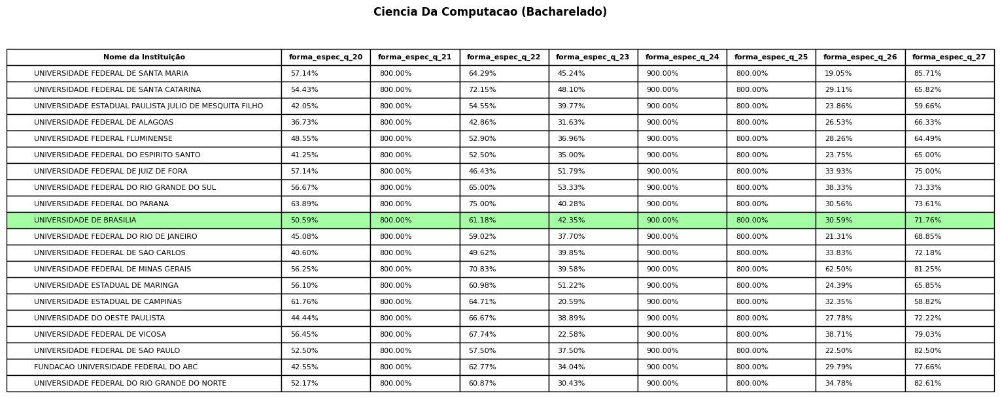

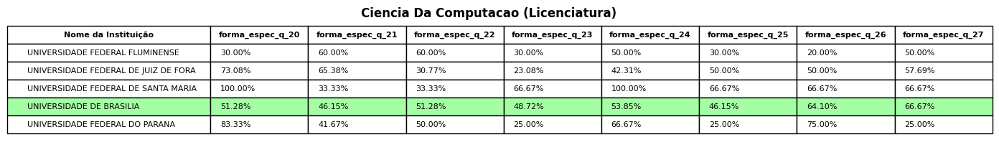

In [ ]:
colunas_questoes = [
    "forma_espec_q_1","forma_espec_q_2","forma_espec_q_3","forma_espec_q_5","forma_espec_q_6","forma_espec_q_7","forma_espec_q_8"
]

for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_CE1.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)


colunas_questoes = [
    "forma_espec_q_10","forma_espec_q_11","forma_espec_q_12","forma_espec_q_14","forma_espec_q_15","forma_espec_q_16","forma_espec_q_19"
]

for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_CE2.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)

colunas_questoes = [
    "forma_espec_q_20","forma_espec_q_21","forma_espec_q_22","forma_espec_q_23","forma_espec_q_24","forma_espec_q_25","forma_espec_q_26","forma_espec_q_27"
]

for curso_analisado in cursos_analisados:
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_CE3.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes)
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)

### Total analise vetor CE

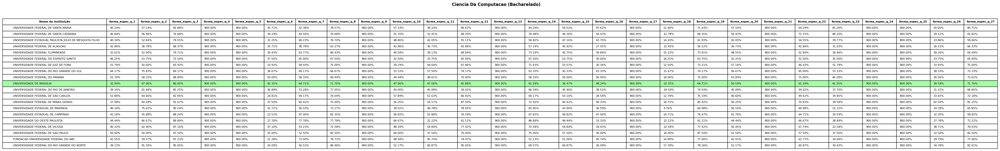

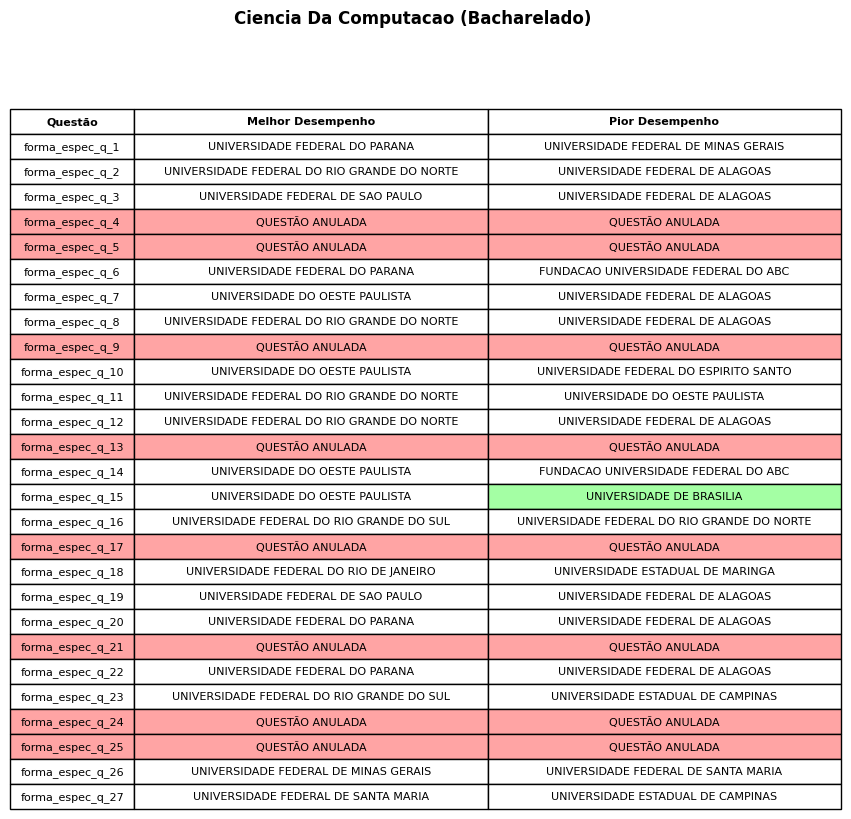

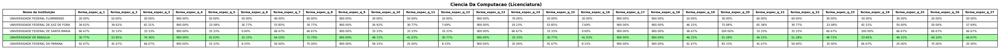

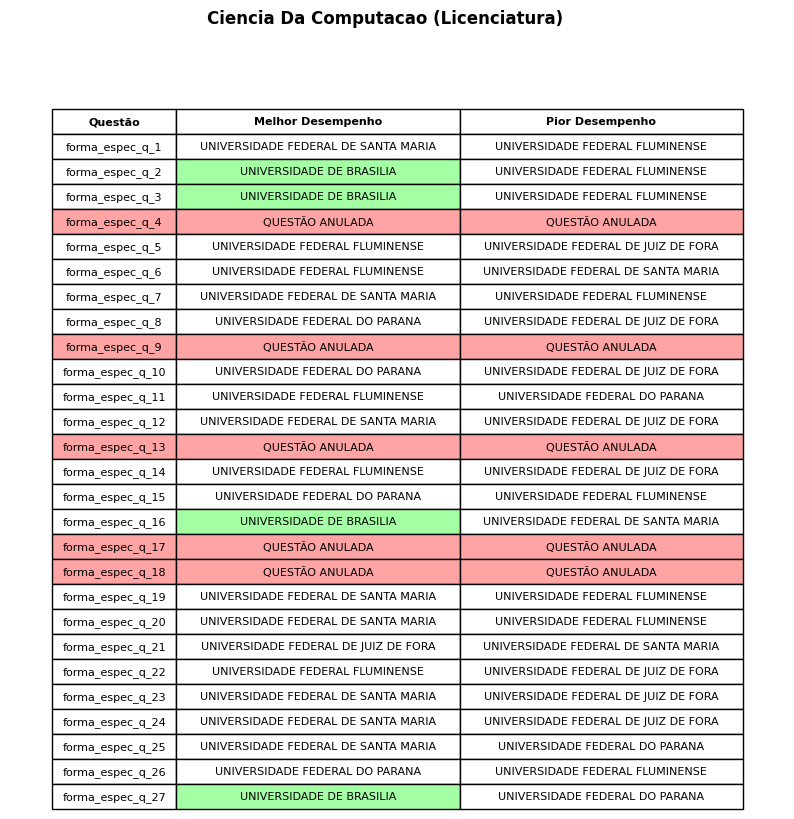

In [ ]:
colunas_questoes = [
    "forma_espec_q_1", "forma_espec_q_2", "forma_espec_q_3", "forma_espec_q_4", "forma_espec_q_5",
    "forma_espec_q_6", "forma_espec_q_7", "forma_espec_q_8", "forma_espec_q_9", "forma_espec_q_10",
    "forma_espec_q_11", "forma_espec_q_12", "forma_espec_q_13", "forma_espec_q_14", "forma_espec_q_15",
    "forma_espec_q_16", "forma_espec_q_17", "forma_espec_q_18", "forma_espec_q_19", "forma_espec_q_20",
    "forma_espec_q_21", "forma_espec_q_22", "forma_espec_q_23", "forma_espec_q_24", "forma_espec_q_25",
    "forma_espec_q_26", "forma_espec_q_27"
]


for curso_analisado in cursos_analisados:
    # Gerar a tabela de percentual de acertos para o curso
    dir_destino = f'{vetores}/tabela_percentual_acertos_{curso_analisado.replace(" ", "_")}_Total_CE.png'
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade(
        dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes
    )
    tabela_percentuais_qe(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino)

    dados_analise = analisar_desempenho_faculdades(percentuais_acertos, mapeamento_ies_curso)
    dir_destino_desempenho = f'{vetores}/tabela_desempenho_{curso_analisado.replace(" ", "_")}_Total_CE.png'
    
    
    tabela_desempenho_fac(dados_analise, curso_analisado, dir_destino_desempenho, faculdade_destacada)

## Comparacao media outras faculdades

### Entrada de dados

In [ ]:
import unidecode

#Cursos a ser analisados
cursos_analisados = [ "Ciência Da Computação (Bacharelado)",'ciencia da computacao (licenciatura)']
#cursos_analisados = [ 'ciencia da computacao (licenciatura)']
#Faculdades pelo CO_IES as 20 melhores
faculdades_analisadas_CO_IES = [575, 570, 8, 576, 581, 571, 577, 573, 585, 4925, 54, 591, 7, 56, 572, 586, 582, 271, 2,57]

#Faculdade que vai ser destacada na tabela com a cor verde '#A4FFA4'
faculdade_destacada= 'UNIVERSIDADE DE BRASILIA'

#Arquivo de entrada
dir_entrada = 'microdados_tratados/form_microdados_arq3_vetores_filtrados.csv'


#funcao para padronizar
def padronizar(lista):
    return [unidecode.unidecode(elemento).lower() for elemento in lista]
cursos_analisados=padronizar(cursos_analisados)
print(cursos_analisados)

['ciencia da computacao (bacharelado)', 'ciencia da computacao (licenciatura)']


### Funcao tabela Top N faculdades_vetores

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

def percentual_acertos_por_faculdade_r(dir_entrada, cursos_analisados, faculdades_analisadas, colunas_questoes):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_IES', 'NOME_CURSO'] + colunas_questoes)
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower() 
    df_filtrado = df[
        df['NOME_CURSO'].isin(map(str.lower, cursos_analisados)) & 
        df['CO_IES'].isin(faculdades_analisadas)
    ]
    
    mapeamento_ies_nome = df_filtrado.drop_duplicates(subset=['CO_IES', 'NOME_IES']).set_index('CO_IES')['NOME_IES']
    
    percentuais_por_faculdade = df_filtrado.groupby('CO_IES')[colunas_questoes].mean() * 100
    return percentuais_por_faculdade, mapeamento_ies_nome 

def tabela_ranking_top(percentuais, mapeamento_ies_nome, curso_analisado, dir_destino,n_top):
    fig, ax = plt.subplots(figsize=(9, 0.3 * len(mapeamento_ies_nome) + 0.5))  
    ax.axis('off')  

    #-------------titulo----------
    #plt.suptitle(curso_analisado.title(), fontsize=12, fontweight='bold', y=1)

    colunas_tabela = ['Número da Questão', 'Posição', 'Nome da Instituição', 'Percentual de Acertos']
    cell_text = []
    cell_merge = []

  
    for questao in colunas_questoes:
        percentuais_questao = percentuais[questao].sort_values(ascending=False).reset_index()
        
        top_5 = percentuais_questao.head(n_top)
        
        
        brasilia_index = None
        for index, row in percentuais_questao.iterrows():
            nome_ies = mapeamento_ies_nome.get(row['CO_IES'], 'Desconhecido').upper()
            if nome_ies == faculdade_destacada.upper():
                brasilia_index = index
                if index > n_top-1:
                    
                    top_5 = top_5.append(percentuais_questao.loc[[index]])
                break

       
        for index, row in top_5.iterrows():
            posicao = index + 1  
            nome_ies = mapeamento_ies_nome.get(row['CO_IES'], 'Desconhecido')
            percentual_formatado = f"{row[questao]:.2f} %"
            questao_texto = questao if posicao == top_5.first_valid_index() + 1 else ''
            cell_text.append([questao_texto, posicao, nome_ies, percentual_formatado])
            if posicao == top_5.first_valid_index() + 1:
                cell_merge.append((len(cell_text) - 1, len(top_5)))

   
    tabela = ax.table(
        cellText=cell_text,
        colLabels=colunas_tabela,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    for (i, j), cell in tabela._cells.items():  
        if i > 0 and j == 0:  
            if cell.get_text().get_text():  
                cell.set_facecolor('#ADD8E6')  


    for i, row in enumerate(cell_text):
 
        row_index = i + 1
       
        if faculdade_destacada in row:
            
            for j in range(1, 4):  
                tabela._cells[(row_index, j)].set_facecolor('#A4FFA4')
    
    
    for key, cell in tabela.get_celld().items():
        if key[0] == 0:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))

    tabela.auto_set_column_width(col=list(range(len(colunas_tabela))))    
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)
    
    plt.savefig(f'{vetores}/tabela_{dir_destino}_ranking_acertos_{curso_analisado.replace(" ", "_")}', bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()



### Top N FG

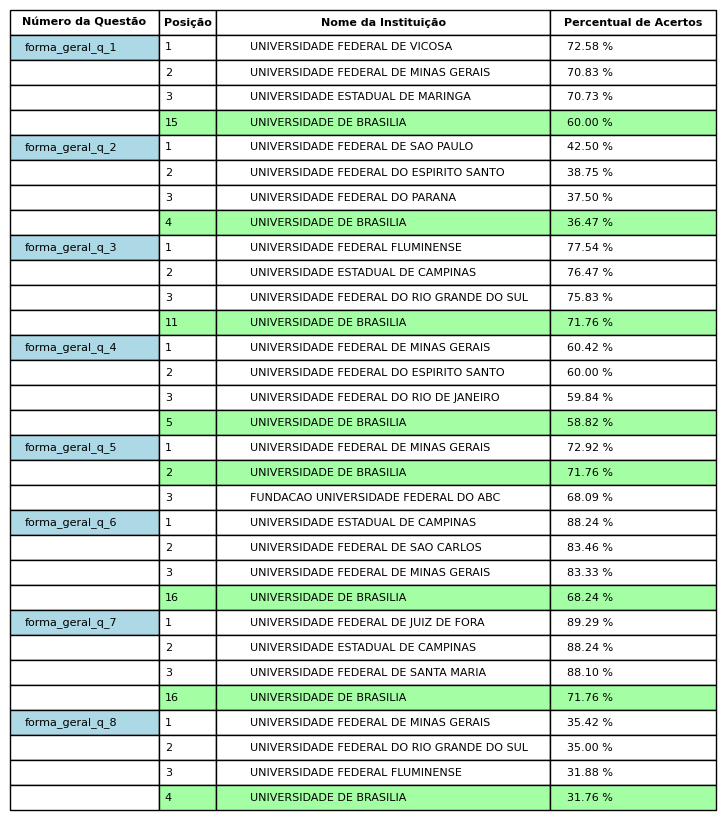

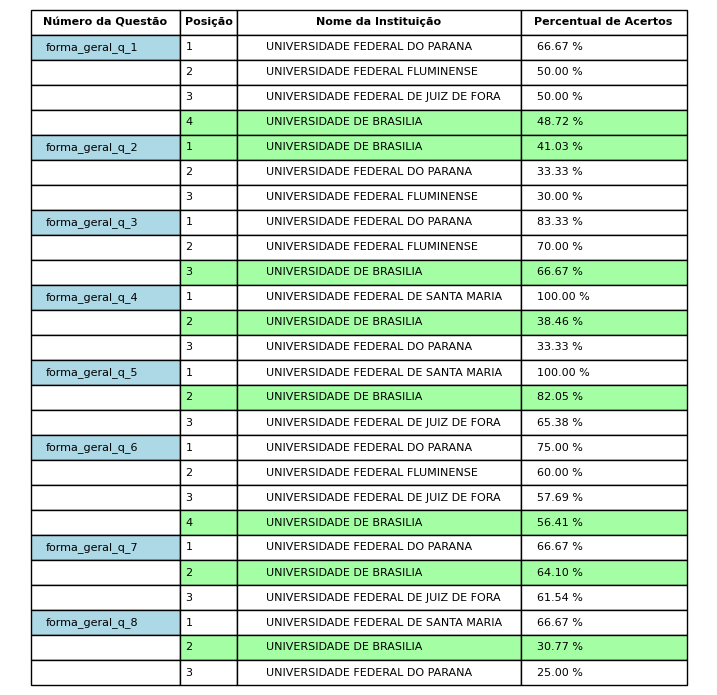

In [ ]:
colunas_questoes = [f"forma_geral_q_{i}" for i in range(1, 9)]
n_top=3

for curso_analisado in cursos_analisados:
 
    dir_destino = "FG"
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade_r(
        dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes
    )
    tabela_ranking_top(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino,n_top)


### Top CE

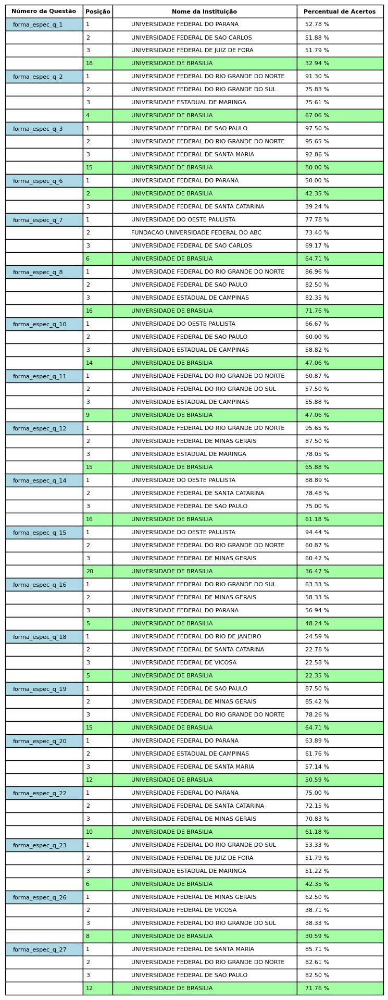

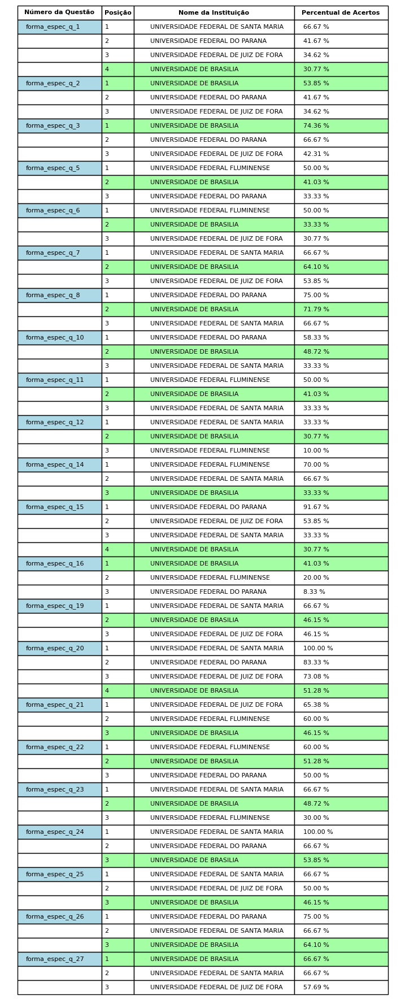

In [ ]:
dir_destino = "CE"
n_top=3

cursos_analisados = [ "ciencia da computacao (bacharelado)"]
colunas_questoes = [
    "forma_espec_q_1", "forma_espec_q_2", "forma_espec_q_3", 
    "forma_espec_q_6", "forma_espec_q_7", "forma_espec_q_8", "forma_espec_q_10",
    "forma_espec_q_11", "forma_espec_q_12", "forma_espec_q_14", "forma_espec_q_15",
    "forma_espec_q_16", "forma_espec_q_18", "forma_espec_q_19", "forma_espec_q_20",
    "forma_espec_q_22", "forma_espec_q_23", 
    "forma_espec_q_26", "forma_espec_q_27"
]


for curso_analisado in cursos_analisados:
 
    
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade_r(
        dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes
    )
    tabela_ranking_top(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino,n_top)

#-------------------------------------------------------------------------------------------------------------------------------------------
cursos_analisados = [ 'ciencia da computacao (licenciatura)']

colunas_questoes = [
    "forma_espec_q_1", "forma_espec_q_2", "forma_espec_q_3", "forma_espec_q_5",
    "forma_espec_q_6", "forma_espec_q_7", "forma_espec_q_8",  "forma_espec_q_10",
    "forma_espec_q_11", "forma_espec_q_12", "forma_espec_q_14", "forma_espec_q_15",
    "forma_espec_q_16", "forma_espec_q_19", "forma_espec_q_20",
    "forma_espec_q_21", "forma_espec_q_22", "forma_espec_q_23", "forma_espec_q_24", "forma_espec_q_25",
    "forma_espec_q_26", "forma_espec_q_27"
]

for curso_analisado in cursos_analisados: 
    
    percentuais_acertos, mapeamento_ies_curso = percentual_acertos_por_faculdade_r(
        dir_entrada, [curso_analisado], faculdades_analisadas_CO_IES, colunas_questoes
    )
    tabela_ranking_top(percentuais_acertos, mapeamento_ies_curso, curso_analisado, dir_destino,n_top)

### Funcao de Desempenho em porcentagem da UnB

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

def percentual_acertos_por_faculdade_r(dir_entrada, cursos_analisados, faculdades_analisadas, colunas_questoes):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_IES', 'NOME_CURSO'] + colunas_questoes)
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()  
    df_filtrado = df[
        df['NOME_CURSO'].isin(map(str.lower, cursos_analisados)) & 
        df['CO_IES'].isin(faculdades_analisadas)
    ]
    
    mapeamento_ies_nome = df_filtrado.drop_duplicates(subset=['CO_IES', 'NOME_IES']).set_index('CO_IES')['NOME_IES']
    
    percentuais_por_faculdade = df_filtrado.groupby('CO_IES')[colunas_questoes].mean() * 100
    return percentuais_por_faculdade, mapeamento_ies_nome 

def tabela_ranking_qe(percentuais, mapeamento_ies_nome, curso_analisado, dir_destino):
    fig, ax = plt.subplots(figsize=(12, 0.3 * len(mapeamento_ies_nome) + 0.5))  
    ax.axis('off')  

    #-----------------titulo-------------
    #plt.suptitle(curso_analisado.title(), fontsize=12, fontweight='bold', y=1)

    
    colunas_tabela = ['Número da Questão', 'Posição', 'Nome da Instituição', 'Percentual de Acertos']
    cell_text = []
    cell_merge = []  

    
    for questao in colunas_questoes:
        percentuais_questao = percentuais[questao].sort_values(ascending=False).reset_index()
        for posicao, (index, row) in enumerate(percentuais_questao.iterrows(), start=1):
            nome_ies = mapeamento_ies_nome.get(row['CO_IES'], 'Desconhecido')
            percentual_formatado = f"{row[questao]:.2f} %"
            
            questao_texto = questao if posicao == 1 else ''
            cell_text.append([questao_texto, posicao, nome_ies, percentual_formatado])
            if posicao == 1:
                cell_merge.append((len(cell_text) - 1, len(percentuais_questao)))  

    tabela = ax.table(
        cellText=cell_text,
        colLabels=colunas_tabela,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    for (i, j), cell in tabela._cells.items():  
        if i > 0 and j == 0:  
            if cell.get_text().get_text():  
                cell.set_facecolor('#ADD8E6') 


    for i, row in enumerate(cell_text):

        row_index = i + 1
      
        if faculdade_destacada in row:
          
            for j in range(1, 4):  
                tabela._cells[(row_index, j)].set_facecolor('#A4FFA4')
    
  
    for key, cell in tabela.get_celld().items():
        if key[0] == 0:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))

    tabela.auto_set_column_width(col=list(range(len(colunas_tabela))))    
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)
    
    
    plt.savefig(f'{vetores}/tabela_{dir_destino}_total_acertos_{curso_analisado.replace(" ", "_")}', bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()

def percentual_posicao_universidade(percentuais, mapeamento_ies_nome, codigo_universidade):
    posicoes = {}
    for questao in percentuais.columns:
        sorted_percentuais = percentuais[questao].sort_values(ascending=False)
        total_universidades = len(sorted_percentuais)
        
        posicao_universidade = sorted_percentuais.index.get_loc(codigo_universidade) + 1
        
        percentual_melhor_ou_igual = ((total_universidades - posicao_universidade + 1) / total_universidades) * 100
        posicoes[questao] = percentual_melhor_ou_igual
    return posicoes

def criar_tabela_percentual(posicoes, curso_analisado, dir_destino):
   
    colunas_tabela = ['Número da Questão', 'Desempenho da UnB em\nrelação a outras universidades']
    cell_text = [[questao, f"{percentual:.2f} %"] for questao, percentual in posicoes.items()]

  
    fig, ax = plt.subplots(figsize=(5, 0.3 * len(cell_text) + 0.5))
    ax.axis('off')

  
    tabela = ax.table(
        cellText=cell_text,
        colLabels=colunas_tabela,
        loc='center',
        cellLoc='center',
        colLoc='center'
    )

    
    for key, cell in tabela.get_celld().items():
        if key[0] == 0:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))

    tabela.auto_set_column_width(col=list(range(len(colunas_tabela))))    
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 2.5)

  
    plt.savefig(f'{vetores}/tabela_comparacao_{dir_destino}_{curso_analisado}', bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()

def gerar_tabelas_por_curso(cursos_analisados, dir_entrada, faculdades_analisadas, colunas_questoes, dir_destino, faculdade_destacada):
    for curso_analisado in cursos_analisados:
        percentuais, mapeamento_ies_nome = percentual_acertos_por_faculdade_r(
            dir_entrada, [curso_analisado], faculdades_analisadas, colunas_questoes
        )

        codigo_unb = None
        for codigo, nome in mapeamento_ies_nome.items():
            if faculdade_destacada.upper() in nome.upper():
                codigo_unb = codigo
                break
        if codigo_unb is None:
            raise ValueError(f"A {faculdade_destacada} não foi encontrada para o curso {curso_analisado}.")

        posicoes_percentuais = percentual_posicao_universidade(
            percentuais, mapeamento_ies_nome, codigo_unb
        )

        criar_tabela_percentual(posicoes_percentuais, curso_analisado, dir_destino)





In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

def percentual_acertos_por_faculdade_r(dir_entrada, cursos_analisados, faculdades_analisadas, colunas_questoes):
    df = pd.read_csv(dir_entrada, sep=';', usecols=['CO_IES', 'NOME_IES', 'NOME_CURSO'] + colunas_questoes)
    df['NOME_CURSO'] = df['NOME_CURSO'].str.lower()  
    df_filtrado = df[
        df['NOME_CURSO'].isin(map(str.lower, cursos_analisados)) & 
        df['CO_IES'].isin(faculdades_analisadas)
    ]
    
    mapeamento_ies_nome = df_filtrado.drop_duplicates(subset=['CO_IES', 'NOME_IES']).set_index('CO_IES')['NOME_IES']
    
    percentuais_por_faculdade = df_filtrado.groupby('CO_IES')[colunas_questoes].mean() * 100
    return percentuais_por_faculdade, mapeamento_ies_nome 

def tabela_ranking_qe(percentuais, mapeamento_ies_nome, curso_analisado, dir_destino):
    fig, ax = plt.subplots(figsize=(12, 0.3 * len(mapeamento_ies_nome) + 0.5))  
    ax.axis('off')  

     #-----------------titulo-------------
    #plt.suptitle(curso_analisado.title(), fontsize=12, fontweight='bold', y=1)

   
    colunas_tabela = ['Número da Questão', 'Posição', 'Nome da Instituição', 'Percentual de Acertos']
    cell_text = []
    cell_merge = [] 

    
    for questao in colunas_questoes:
        percentuais_questao = percentuais[questao].sort_values(ascending=False).reset_index()
        for posicao, (index, row) in enumerate(percentuais_questao.iterrows(), start=1):
            nome_ies = mapeamento_ies_nome.get(row['CO_IES'], 'Desconhecido')
            percentual_formatado = f"{row[questao]:.2f} %"
            
            questao_texto = questao if posicao == 1 else ''
            cell_text.append([questao_texto, posicao, nome_ies, percentual_formatado])
            if posicao == 1:
                cell_merge.append((len(cell_text) - 1, len(percentuais_questao)))  
                
    tabela = ax.table(
        cellText=cell_text,
        colLabels=colunas_tabela,
        loc='center',
        cellLoc='left',
        colLoc='center'
    )

    for (i, j), cell in tabela._cells.items():  
        if i > 0 and j == 0:  
            if cell.get_text().get_text():  
                cell.set_facecolor('#ADD8E6')  


    for i, row in enumerate(cell_text):
    
        row_index = i + 1
        
        if faculdade_destacada in row:
           
            for j in range(1, 4):  
                tabela._cells[(row_index, j)].set_facecolor('#A4FFA4')
    
    
    for key, cell in tabela.get_celld().items():
        if key[0] == 0:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))

    
        
    tabela.auto_set_column_width(col=list(range(len(colunas_tabela))))    
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 1.5)
    
    
    plt.savefig(f'{vetores}/tabela_{dir_destino}_total_acertos_{curso_analisado.replace(" ", "_")}', bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()

def percentual_posicao_universidade(percentuais, mapeamento_ies_nome, codigo_universidade):
    posicoes = {}
    for questao in percentuais.columns:
        sorted_percentuais = percentuais[questao].sort_values(ascending=False)
        total_universidades = len(sorted_percentuais)
        
        posicao_universidade = sorted_percentuais.index.get_loc(codigo_universidade) + 1
      
        percentual_melhor_ou_igual = ((total_universidades - posicao_universidade + 1) / total_universidades) * 100
        posicoes[questao] = percentual_melhor_ou_igual
    return posicoes

def criar_tabela_percentual(posicoes, curso_analisado, dir_destino):
   
    colunas_tabela = ['Número da Questão', 'Desempenho da UnB em\nrelação a outras universidades']
    cell_text = [[questao, f"{percentual:.2f} %"] for questao, percentual in posicoes.items()]

    percentuais_medios = list(posicoes.values())
    media_percentual = sum(percentuais_medios) / len(percentuais_medios)
    

    cell_text.append(["Média", f"{media_percentual:.2f} %"])
   
    fig, ax = plt.subplots(figsize=(5, 0.3 * len(cell_text) + 0.5))
    ax.axis('off')

   
    tabela = ax.table(
        cellText=cell_text,
        colLabels=colunas_tabela,
        loc='center',
        cellLoc='center',
        colLoc='center'
    )

 
    for key, cell in tabela.get_celld().items():
        if key[0] == 0:
            cell.set_text_props(fontproperties=FontProperties(weight='bold'))

    tabela.auto_set_column_width(col=list(range(len(colunas_tabela))))    
    tabela.auto_set_font_size(False)
    tabela.set_fontsize(8)
    tabela.scale(1, 2.5)

    
    plt.savefig(f'{vetores}/tabela_comparacao_{dir_destino}_{curso_analisado}', bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()

def gerar_tabelas_por_curso(cursos_analisados, dir_entrada, faculdades_analisadas, colunas_questoes, dir_destino, faculdade_destacada):
    for curso_analisado in cursos_analisados:
        percentuais, mapeamento_ies_nome = percentual_acertos_por_faculdade_r(
            dir_entrada, [curso_analisado], faculdades_analisadas, colunas_questoes
        )

        codigo_unb = None
        for codigo, nome in mapeamento_ies_nome.items():
            if faculdade_destacada.upper() in nome.upper():
                codigo_unb = codigo
                break
        if codigo_unb is None:
            raise ValueError(f"A {faculdade_destacada} não foi encontrada para o curso {curso_analisado}.")

        posicoes_percentuais = percentual_posicao_universidade(
            percentuais, mapeamento_ies_nome, codigo_unb
        )

        criar_tabela_percentual(posicoes_percentuais, curso_analisado, dir_destino)


### Desempenho FG

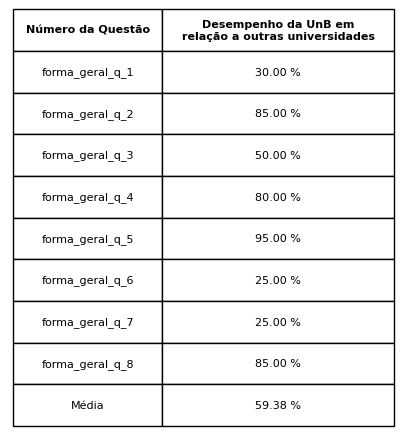

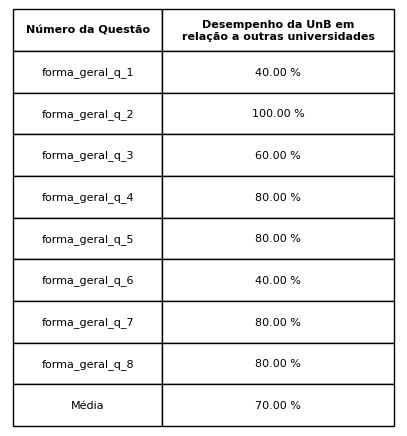

In [ ]:
cursos_analisados = [ "ciencia da computacao (bacharelado)",'ciencia da computacao (licenciatura)']
colunas_questoes = [f"forma_geral_q_{i}" for i in range(1, 9)]
dir_destino = "FG"

gerar_tabelas_por_curso(cursos_analisados, dir_entrada, faculdades_analisadas_CO_IES, colunas_questoes, dir_destino,faculdade_destacada)

### Desempenho CE

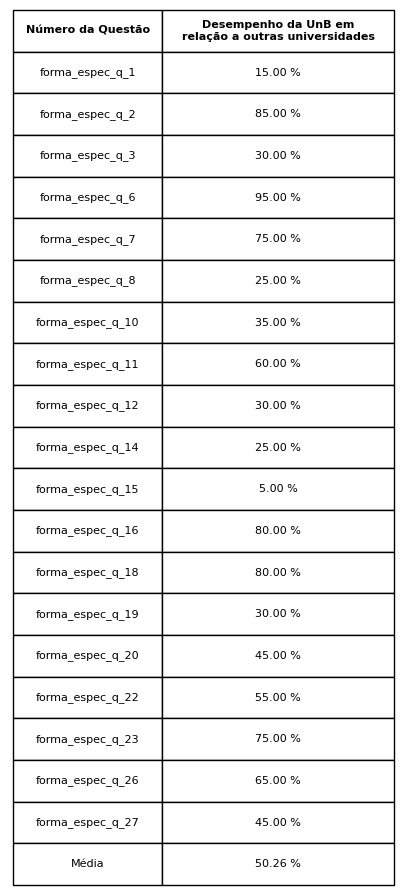

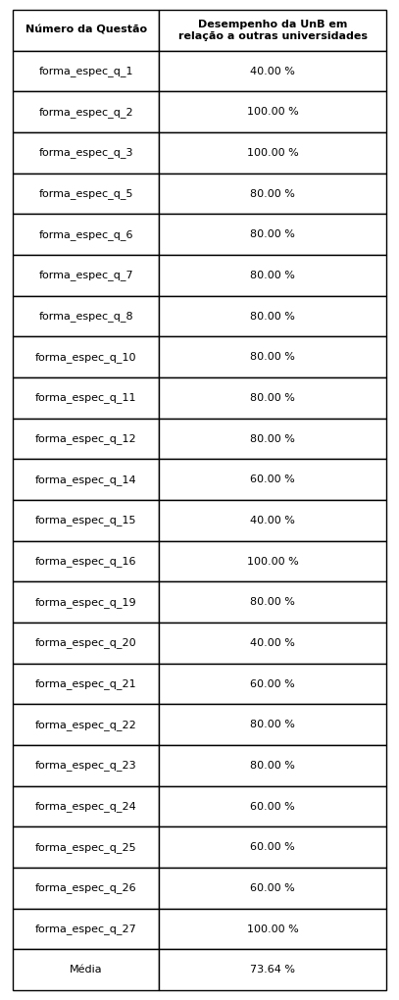

In [ ]:
dir_destino = "CE"

cursos_analisados = [ "ciencia da computacao (bacharelado)"]
colunas_questoes = [
    "forma_espec_q_1", "forma_espec_q_2", "forma_espec_q_3", 
    "forma_espec_q_6", "forma_espec_q_7", "forma_espec_q_8", "forma_espec_q_10",
    "forma_espec_q_11", "forma_espec_q_12", "forma_espec_q_14", "forma_espec_q_15",
    "forma_espec_q_16", "forma_espec_q_18", "forma_espec_q_19", "forma_espec_q_20",
    "forma_espec_q_22", "forma_espec_q_23", 
    "forma_espec_q_26", "forma_espec_q_27"
]


gerar_tabelas_por_curso(cursos_analisados, dir_entrada, faculdades_analisadas_CO_IES, colunas_questoes, dir_destino,faculdade_destacada)

#-------------------------------------------------------------------------------------------------------------------------------------------
cursos_analisados = [ 'ciencia da computacao (licenciatura)']

colunas_questoes = [
    "forma_espec_q_1", "forma_espec_q_2", "forma_espec_q_3", "forma_espec_q_5",
    "forma_espec_q_6", "forma_espec_q_7", "forma_espec_q_8",  "forma_espec_q_10",
    "forma_espec_q_11", "forma_espec_q_12", "forma_espec_q_14", "forma_espec_q_15",
    "forma_espec_q_16", "forma_espec_q_19", "forma_espec_q_20",
    "forma_espec_q_21", "forma_espec_q_22", "forma_espec_q_23", "forma_espec_q_24", "forma_espec_q_25",
    "forma_espec_q_26", "forma_espec_q_27"
]

gerar_tabelas_por_curso(cursos_analisados, dir_entrada, faculdades_analisadas_CO_IES, colunas_questoes, dir_destino,faculdade_destacada)


